In [1]:
import pandas as pd
import glob
import matplotlib.pyplot as plt
from scipy.stats import f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import seaborn as sns
import math
import statistics
import warnings
import numpy as  np
import ast
import re
from scipy.signal import resample
import tkinter as tk
from matplotlib.backends.backend_tkagg import FigureCanvasTkAgg
import pingouin as pg
import statsmodels.api as sm
from sklearn.preprocessing import MinMaxScaler
warnings.filterwarnings('ignore')

df = pd.read_json(r"C:\Users\veoni\Documents\GitHub\MTE_DLAB\Analysis\df_manrev.json")

In [2]:
mean_data_points = df['downsampled_traj'].apply(lambda x: len(x)).mean()
print(mean_data_points)
df['new_timestamps'] = df['timestamps']
df['new_timestamps'] = df['downsampled_traj'].apply(lambda x: [i * 0.01 for i in range(len(x))])
df['new_timestamps'] = df['new_timestamps'].apply(lambda x: [round(i, 2) for i in x])

117.91166486096064


In [3]:
print(df['new_timestamps'][0])

[0.0, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.11, 0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2, 0.21, 0.22, 0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3, 0.31, 0.32, 0.33, 0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4, 0.41, 0.42, 0.43, 0.44, 0.45, 0.46, 0.47, 0.48, 0.49, 0.5, 0.51, 0.52, 0.53, 0.54, 0.55, 0.56, 0.57, 0.58, 0.59, 0.6, 0.61, 0.62, 0.63, 0.64, 0.65, 0.66, 0.67, 0.68, 0.69, 0.7, 0.71, 0.72, 0.73, 0.74, 0.75, 0.76, 0.77, 0.78, 0.79, 0.8, 0.81, 0.82, 0.83, 0.84, 0.85, 0.86, 0.87, 0.88, 0.89, 0.9, 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99, 1.0, 1.01, 1.02, 1.03, 1.04, 1.05, 1.06, 1.07, 1.08, 1.09, 1.1, 1.11, 1.12, 1.13, 1.14, 1.15, 1.16, 1.17, 1.18, 1.19, 1.2, 1.21, 1.22, 1.23, 1.24, 1.25, 1.26, 1.27, 1.28, 1.29, 1.3, 1.31, 1.32, 1.33, 1.34, 1.35, 1.36, 1.37, 1.38, 1.39, 1.4, 1.41, 1.42, 1.43, 1.44, 1.45, 1.46, 1.47, 1.48, 1.49, 1.5, 1.51, 1.52, 1.53, 1.54, 1.55, 1.56, 1.57, 1.58, 1.59, 1.6, 1.61, 1.62, 1.63, 1.64, 1.65, 1.66, 1.67, 1.68, 1.

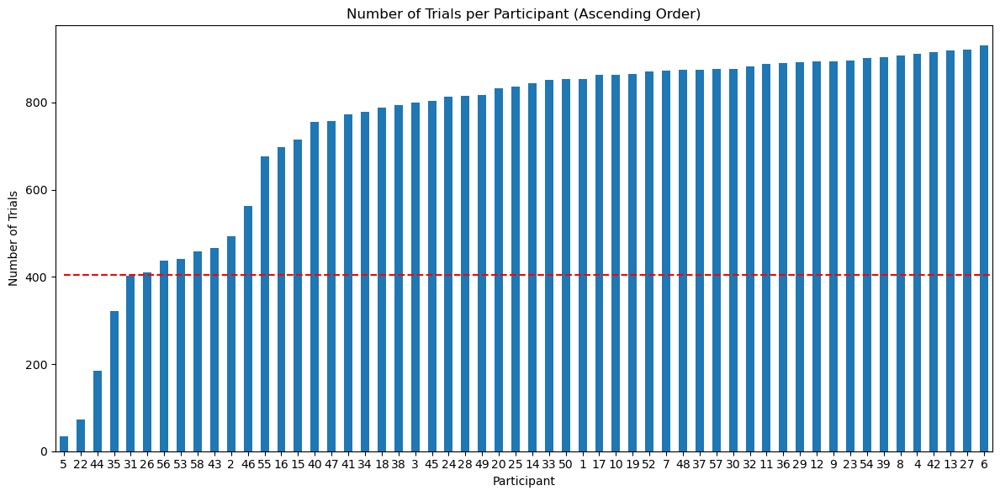

In [4]:
pt_trial = df['pt_num'].value_counts().sort_values(ascending=True)
participants_below_400 = df['pt_num'].value_counts().loc[lambda x: x < 405].index.tolist()
participants_below_400

pt_trial_sorted = pt_trial.sort_values()

plt.figure(figsize=(12, 6))  # Increase the figure size

pt_trial_sorted.plot(kind='bar')
plt.xlabel('Participant')
plt.ylabel('Number of Trials')
plt.title('Number of Trials per Participant (Ascending Order)')
plt.hlines(405, 0, 70, colors='r', linestyles='dashed')
plt.xticks(rotation=0)

plt.tight_layout()
plt.show()

In [5]:
#Drop participants with less than 400 trials and 31
df = df[~df['pt_num'].isin(participants_below_400)]


In [6]:
avg_timestamps = df['new_timestamps'].apply(lambda x: np.mean(x)).mean()

def cut_and_fill_traj(traj, length=60, before=10):
    start_index = None
    for i, (x, y) in enumerate(traj):
        if y >= -108:
            start_index = i
            break
    
    if start_index is None:
        return traj[:length]
    beg_index = max(0, start_index - before)
    end_index = start_index + length
    traj = traj[beg_index:end_index]
    
    if (len(traj)-start_index) < end_index:
        last_x, last_y = traj[-1]
        traj.extend([(last_x, last_y)] * (length - len(traj) + before ))
        #traj.extend([(float('nan'), float('nan'))] * (length - len(traj) + before ))
        
    
    return traj

In [7]:
df['cut_traj'] = [cut_and_fill_traj(traj, length=71, before=10) for traj in df['downsampled_traj']]
df['x_values'] = df['cut_traj'].apply(lambda traj: [point[0] for point in traj])
df['y_values'] = df['cut_traj'].apply(lambda traj: [point[1] for point in traj])


In [8]:
def cut_off_trajectory(traj):
    return [pos for pos in traj if pos[1] >= -108]

df['onset_traj'] = df['downsampled_traj'].apply(cut_off_trajectory)

In [9]:
avg_onset_traj = df['onset_traj'].apply(lambda x: len(x)).mean()

FileNotFoundError: [Errno 2] No such file or directory: 'interim plots_1/participant_10_nan_avg.pdf'

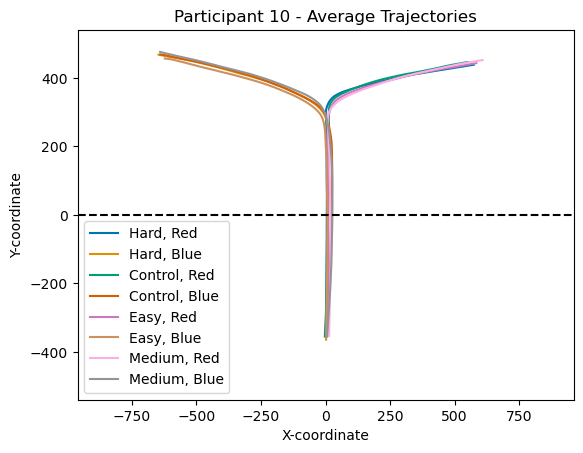

In [10]:
participants = df['pt_num'].unique()

# Set the color palette to colorblind
sns.set_palette("colorblind")

for participant in participants:
    plt.figure()  # Create a new figure for each participant
    
    conditions = df[df['pt_num'] == participant]['difficulty'].unique()
    choices = df[df['pt_num'] == participant]['choice'].unique()
    
    for condition in conditions:
        for choice in choices:
            df_filtered = df[(df['pt_num'] == participant) & (df['difficulty'] == condition) & (df['choice'] == choice)]
            
            average_x_traj = np.nanmean(df_filtered['x_values'].tolist(), axis=0)
            average_y_traj = np.nanmean(df_filtered['y_values'].tolist(), axis=0)
            
            plt.plot(average_x_traj, average_y_traj, label=f'{condition}, {choice}')
    
    plt.xlabel('X-coordinate')
    plt.ylabel('Y-coordinate')
    plt.xlim(-960, 960)
    plt.ylim(-540, 540)
    plt.hlines(0, -960, 960, colors='black', linestyles='dashed')
    plt.title(f'Participant {participant} - Average Trajectories')
    plt.legend()
    plt.savefig(f'interim plots_1/participant_{participant}_nan_avg.pdf')
    plt.show()
    plt.close()

FileNotFoundError: [Errno 2] No such file or directory: 'interim plots_1/0global_avg_nan.pdf'

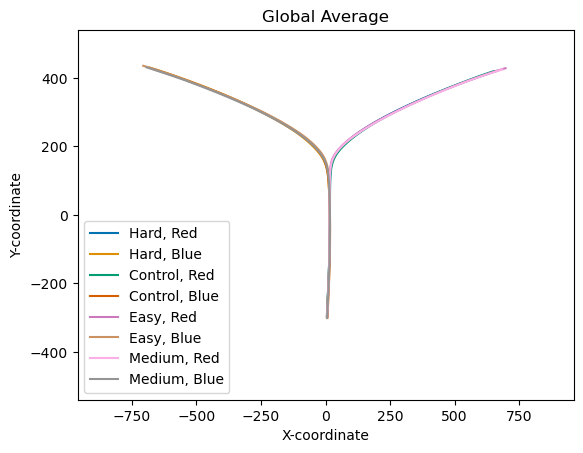

In [11]:
conditions = df['difficulty'].unique()
choices = df['choice'].unique()

for condition in conditions:
    for choice in choices:
        df_filtered = df[(df['difficulty'] == condition) & (df['choice'] == choice)]

        average_x_traj = np.nanmean(df_filtered['x_values'].tolist(), axis=0)
        average_y_traj = np.nanmean(df_filtered['y_values'].tolist(), axis=0)

        plt.plot(average_x_traj, average_y_traj, label=f'{condition}, {choice}')

plt.xlabel('X-coordinate')
plt.ylabel('Y-coordinate')
plt.xlim(-960, 960)
plt.ylim(-540, 540)
#plt.hlines(-108, -960, 960, colors='black', linestyles='dashed')
plt.title('Global Average')
plt.legend()
plt.savefig('interim plots_1/0global_avg_nan.pdf')
plt.show()



FileNotFoundError: [Errno 2] No such file or directory: 'interim plots_2/participant_10_lastpoint_x_seperation.pdf'

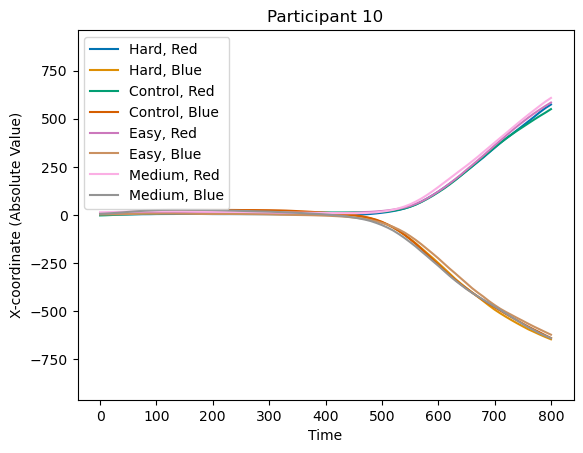

In [12]:
participants = df['pt_num'].unique()
conditions = df['difficulty'].unique()
sns.set_palette("colorblind")
for participant in participants:
    fig, ax = plt.subplots()  # Create a new figure and axes for each participant
    
    for condition in conditions:
        df_filtered = df[(df['pt_num'] == participant) & (df['difficulty'] == condition)]
        
        for choice in choices:
            df_choice_filtered = df_filtered[df_filtered['choice'] == choice]
            
            if choice == 'Red':
                average_x_traj = np.nanmean(df_choice_filtered['x_values'].tolist(), axis=0)
                time = list(range(0, len(average_x_traj) * 10, 10))
                ax.plot(time, average_x_traj,label=f'{condition}, {choice}')
                ax.set_xlabel('Time')
                ax.set_ylabel('X-coordinate')
                ax.set_title(f'Participant {participant}')
            elif choice == 'Blue':
                average_x_traj = np.nanmean(df_choice_filtered['x_values'].tolist(), axis=0)
                #average_x_traj_abs = np.abs(average_x_traj)
                ax.plot(time, average_x_traj, label=f'{condition}, {choice}')
                ax.set_xlabel('Time')
                ax.set_ylabel('X-coordinate (Absolute Value)')
                ax.set_title(f'Participant {participant}')
    
    ax.set_ylim(-960, 960)
    ax.legend()
    plt.savefig(f'interim plots_2/participant_{participant}_lastpoint_x_seperation.pdf')
    plt.show()


FileNotFoundError: [Errno 2] No such file or directory: 'interim plots_2/0global_lastpoint_xseperation.pdf'

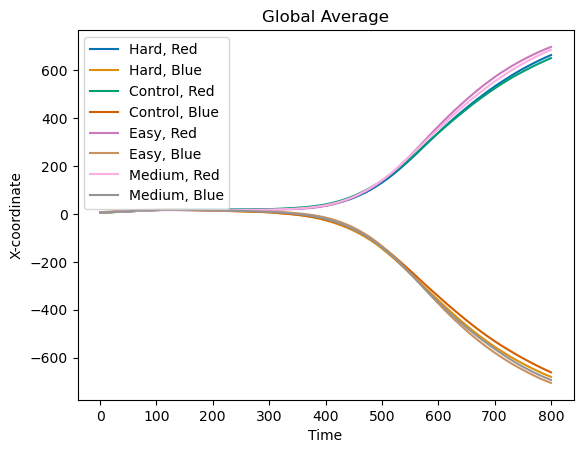

In [13]:
conditions = df['difficulty'].unique()
choices = df['choice'].unique()

plt.figure()  # Create a new figure

for condition in conditions:
    for choice in choices:
        df_filtered = df[(df['difficulty'] == condition) & (df['choice'] == choice)]

        average_x_traj = np.nanmean(df_filtered['x_values'].tolist(), axis=0)

        plt.plot(time, average_x_traj, label=f'{condition}, {choice}')

plt.ylabel('X-coordinate')
plt.xlabel('Time')
plt.title('Global Average')
plt.legend()
plt.savefig('interim plots_2/0global_lastpoint_xseperation.pdf')
plt.show()


In [14]:
data_files = glob.glob(r'../Squircle experiment/data/*.json')
# Load the dataset
df_raw = pd.DataFrame()
for i in range(len(data_files)):
    temp_df = pd.read_json(data_files[i])
    temp_df['previous_diff'] = temp_df['difficulty'].shift(fill_value=None)
    temp_df['previous_trueval'] = temp_df['true_value'].shift(fill_value=None)
    df_raw = pd.concat([df_raw, temp_df])
df_raw = df_raw.drop(df_raw.columns[df_raw.columns.str.contains('Unnamed', case=False)], axis=1)

#Adding C values to the dataframe
def assign_muval(row):
    if row['previous_diff'] == 'Control':
        return 0.50
    elif row['previous_diff'] == 'Easy' and row['previous_trueval'] == 'Blue':
        return 0.455
    elif row['previous_diff'] == 'Easy' and row['previous_trueval'] == 'Red':
        return 0.545
    elif row['previous_diff'] == 'Medium' and row['previous_trueval'] == 'Blue':
        return 0.47
    elif row['previous_diff'] == 'Medium' and row['previous_trueval'] == 'Red':
        return 0.53
    elif row['previous_diff'] == 'Hard' and row['previous_trueval'] == 'Blue':
        return 0.48
    elif row['previous_diff'] == 'Hard' and row['previous_trueval'] == 'Red':
        return 0.52
    else:
        return 'NAN'

df_raw['prev_evidence'] = df_raw.apply(assign_muval, axis=1)
# Create an instance of MinMaxScaler
scaler = MinMaxScaler(feature_range=(-1, 1))

# Rescale the value assignments
df_raw['prev_evidence'] = scaler.fit_transform(df_raw['prev_evidence'].values.reshape(-1, 1))

# Check if 'previous_evidence_rescaled' column exists in df_raw
df = df.merge(df_raw[['trial_nbr', 'pt_num', 'prev_evidence']], on=['trial_nbr', 'pt_num'], how='left')
df = df.drop_duplicates(subset=['trial_nbr', 'pt_num'], keep='first')


In [15]:
#Adding C values to the dataframe
def assign_muval(row):
    if row['difficulty'] == 'Control':
        return 0.50
    elif row['difficulty'] == 'Easy' and row['true_value'] == 'Blue':
        return 0.455
    elif row['difficulty'] == 'Easy' and row['true_value'] == 'Red':
        return 0.545
    elif row['difficulty'] == 'Medium' and row['true_value'] == 'Blue':
        return 0.47
    elif row['difficulty'] == 'Medium' and row['true_value'] == 'Red':
        return 0.53
    elif row['difficulty'] == 'Hard' and row['true_value'] == 'Blue':
        return 0.48
    elif row['difficulty'] == 'Hard' and row['true_value'] == 'Red':
        return 0.52

df['muval'] = df.apply(assign_muval, axis=1)
# Create an instance of MinMaxScaler
scaler = MinMaxScaler(feature_range=(-1, 1))

# Rescale the value assignments
df['evidence'] = scaler.fit_transform(df['muval'].values.reshape(-1, 1))



In [18]:
df.to_json(r"C:\Users\veoni\Documents\GitHub\MTE_DLAB\Analysis\DF_reg.json")

## Exporting another dataframe for R mixed models with csv
## only with necessary columns
df_r = df.loc[:, ['pt_num', 'trial_nbr', 'block_number', 'acc', 'choice', 'true_value', 'difficulty', 'rt', 'previous_response', 'evidence', 'prev_evidence']]

df_r.to_csv(r"C:\Users\veoni\Documents\GitHub\MTE_DLAB\Analysis\DF_reg_r.csv")

In [17]:
df_r.head()

,pt_num,trial_nbr,block_number,acc,choice,true_value,difficulty,rt,previous_response,evidence,prev_evidence
0,10,1,Block 1,True,Red,Red,Hard,0.723426,Red,0.444444,NaN
2,10,2,Block 1,True,Blue,Blue,Hard,0.601322,Red,-0.444444,0.666667
4,10,4,Block 1,Control,Red,Control,Control,0.961610,NAN,0.000000,-1.000000
6,10,5,Block 1,True,Blue,Blue,Easy,0.779001,Red,-1.000000,1.000000
8,10,6,Block 1,True,Red,Red,Medium,0.812069,Blue,0.666667,0.666667


## Regression

In [ ]:
df = pd.read_json(r"C:\Users\veoni\Documents\GitHub\MTE_DLAB\Analysis\DF_reg.json")

## with Categorical Predictors

In [ ]:
######################################

df_lm = df[df['true_value'] != 'Control']
# Get the unique participant numbers
participants = df_lm['pt_num'].unique()
all_coefs = []
# Iterate over each participant
for participant in participants:
    # Filter the dataframe for the current participant
    df_lm_participant = df_lm[df_lm['pt_num'] == participant]

    # One-hot encode the categorical predictor 'true_value'
    df_encoded_participant = pd.get_dummies(df_lm_participant, columns=['true_value'])

    # Drop rows with missing values
    df_cleaned_participant = df_encoded_participant.dropna()

    coefs = []
    for i in range(0, 81):
        # Extract the dependent variable
        first_values = df_cleaned_participant['x_values'].apply(lambda x: x[i])
        y = np.array(first_values).astype(int)

        # Extract the independent variables
        X_categorical = df_cleaned_participant[['true_value_Red']].values
        
        X_numerical = df_cleaned_participant['muval_rescaled'].values.reshape(-1, 1)
        X_numerical = np.abs(X_numerical)

        # Add interaction term
        #interaction_term = X_categorical * X_numerical

        # Concatenate predictors and interaction term
        X = np.concatenate((X_categorical, X_numerical), axis=1)

        # Add constant term for intercept
        X = sm.add_constant(X)

        # Perform linear regression
        model = sm.OLS(y, X).fit()

        # Append coefficients to the list
        coefs.append((model.params[0], model.params[1], model.params[2]))

        # Print the summary of the regression results
        print(f"Participant {participant}, Iteration {i+1}")
        #print(model.summary())
    plt.plot(time, coefs)
    plt.xlabel('Time')
    plt.ylabel('Coefficients')
    plt.title(f'Coefficients ' + f'Participant {participant}')
    plt.vlines(100, -960, 960, colors='black', linestyles='dashed')
    plt.legend(['Blue','Red', 'Mu_evidence'])
    plt.show()
    all_coefs.append(coefs)


KeyError: 'muval_rescaled'

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Convert the list of coefficients to a numpy array
all_coefs_array = np.array(all_coefs)

# Calculate the average of each coefficient across all samples
average_coefs = np.mean(all_coefs_array, axis=0)

# Extract the x, y, and z values of the coefficients
x_coefs = average_coefs[:, 0]
y_coefs = average_coefs[:, 1]
z_coefs = average_coefs[:, 2]

# Calculate the standard error of each coefficient across all samples
std_coefs = np.std(all_coefs_array, axis=0, ddof=1) / np.sqrt(all_coefs_array.shape[0])

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the average coefficients with error bars
plt.plot(time, x_coefs, label='Sign_Blue', color='blue')
plt.plot(time, y_coefs, label='Sign_Red', color='red')
plt.plot(time, z_coefs, label='Evidence', color='green')
plt.fill_between(time, x_coefs - std_coefs[:, 0], x_coefs + std_coefs[:, 0], alpha=0.2, color='blue')
plt.fill_between(time, y_coefs - std_coefs[:, 1], y_coefs + std_coefs[:, 1], alpha=0.2, color='red')
plt.fill_between(time, z_coefs - std_coefs[:, 2], z_coefs + std_coefs[:, 2], alpha=0.2, color='green')

plt.xlabel('Time')
plt.ylabel('Coefficient Value')
plt.title('Average Coefficients')
plt.ylim(-960, 960)
plt.vlines(110, -960, 960, colors='orange', linestyles='dashed')
plt.legend()
plt.show()


IndexError: invalid index to scalar variable.

In [ ]:
#df_lm = df[df['acc'] == 1]
# One-hot encode the categorical predictor 'true_value'
df_encoded = pd.get_dummies(df, columns=['true_value'], drop_first=True)
df_cleaned = df_encoded.dropna()
df['category'] = df['true_value'].apply(lambda x: 1 if x == 'Red' else -1 if x == 'Blue' else 0)

## just change it manually


coefs = []
for i in range(0, 90):
    # Extract the dependent variable
    values = df_cleaned['x_values'].apply(lambda x: x[i])
    y = np.array(values).astype(int)
    # Extract the independent variables
    X_categorical = df_cleaned[['true_value_Red']].values
    #X_categorical = np.where(X_categorical == 0, -1,1)
    
    
    X_numerical = df_cleaned['muval_rescaled'].values.reshape(-1, 1)
    X_numerical = np.abs(X_numerical)
    # Add interaction term
    #interaction = X_categorical * X_numerical
    

    # Concatenate predictors and interaction term
    X = np.concatenate((X_categorical, X_numerical), axis=1)
    #X = X_numerical
    # Add constant term for intercept
    X = sm.add_constant(X)

    # Perform linear regression
    model = sm.OLS(y, X).fit()
    print(model.summary())
    # Append coefficients to the list
    coefs.append((model.params[0], model.params[1], model.params[2]))
# Predict values
#y_pred = model.predict(X)
    
    
    

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                    0.8054
Date:                Tue, 19 Mar 2024   Prob (F-statistic):              0.447
Time:                        10:12:28   Log-Likelihood:            -2.2615e+05
No. Observations:               40522   AIC:                         4.523e+05
Df Residuals:                   40519   BIC:                         4.523e+05
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          6.1552      0.571     10.774      0.0

IndexError: list index out of range

In [ ]:
#second_items = [item[0] for item in coefs]
#print(second_items)
sns.set_palette("colorblind")
plt.plot(time, coefs)
plt.xlabel('Time')
plt.ylabel('Coefficients')
plt.title('Coefficients')
plt.legend(['Blue', 'Red', 'Mu_evidence'])
plt.show()

NameError: name 'time' is not defined

## Without Categoircal Predictors

In [ ]:
######################################

#df_lm = df[df['true_value'] != 'Control']
df_lm = df
# Get the unique participant numbers
participants = df_lm['pt_num'].unique()
all_coefs = []
# Iterate over each participant
for participant in participants:
    # Filter the dataframe for the current participant
    df_lm_participant = df_lm[df_lm['pt_num'] == participant]

    # One-hot encode the categorical predictor 'true_value'
    df_encoded_participant = pd.get_dummies(df_lm_participant, columns=['true_value'])

    # Drop rows with missing values
    df_cleaned_participant = df_encoded_participant.dropna()

    coefs = []
    for i in range(0, 81):
        # Extract the dependent variable
        first_values = df_cleaned_participant['x_values'].apply(lambda x: x[i])
        y = np.array(first_values).astype(int)

        # Extract the independent variables
        #X_categorical = df_cleaned_participant[['true_value_Red']].values
        
        X_numerical = df_cleaned_participant['muval_rescaled'].values.reshape(-1, 1)
        #X_numerical = np.abs(X_numerical)

        # Add interaction term
        #interaction_term = X_categorical * X_numerical

        # Concatenate predictors and interaction term
        #X = np.concatenate((X_categorical, X_numerical), axis=1)

        # Add constant term for intercept
        X = sm.add_constant(X_numerical)

        # Perform linear regression
        model = sm.OLS(y, X).fit()

        # Append coefficients to the list
        coefs.append((model.params[0], model.params[1]))

        # Print the summary of the regression results
        print(f"Participant {participant}, Iteration {i+1}")
        #print(model.summary())
    plt.plot(time, coefs)
    plt.xlabel('Time')
    plt.ylabel('Coefficients')
    plt.title(f'Coefficients ' + f'Participant {participant}')
    plt.vlines(100, -960, 960, colors='black', linestyles='dashed')
    plt.legend(['Blue','Red', 'Mu_evidence'])
    plt.show()
    all_coefs.append(coefs)


KeyError: 'muval_rescaled'

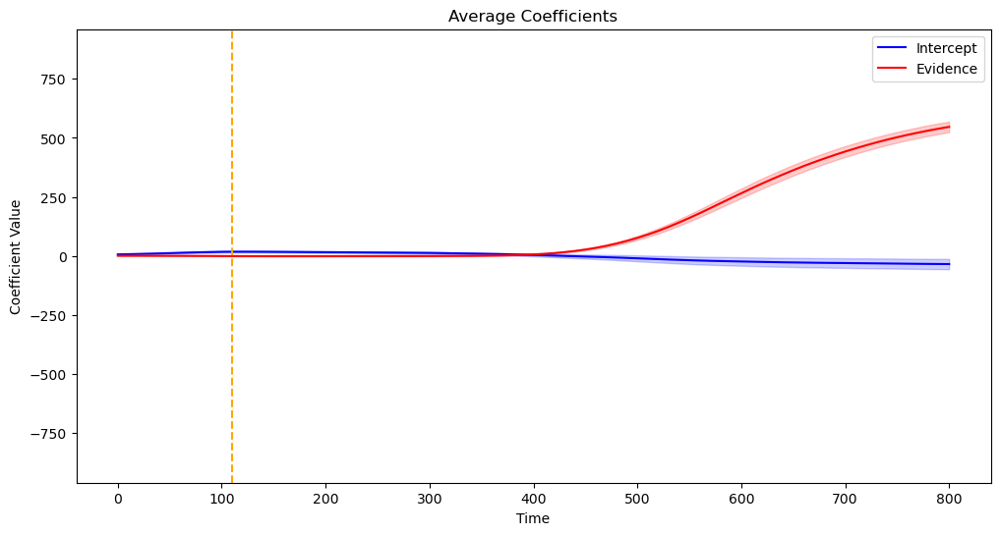

In [ ]:

### Plottting the average coefficients

# Convert the list of coefficients to a numpy array
all_coefs_array = np.array(all_coefs)

# Calculate the average of each coefficient across all samples
average_coefs = np.mean(all_coefs_array, axis=0)

# Extract the x, y, and z values of the coefficients
x_coefs = average_coefs[:, 0]
y_coefs = average_coefs[:, 1]

# Calculate the standard error of each coefficient across all samples
std_coefs = np.std(all_coefs_array, axis=0, ddof=1) / np.sqrt(all_coefs_array.shape[0])

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the average coefficients with error bars
plt.plot(time, x_coefs, label='Intercept', color='blue')
plt.plot(time, y_coefs, label='Evidence', color='red')
plt.fill_between(time, x_coefs - std_coefs[:, 0], x_coefs + std_coefs[:, 0], alpha=0.2, color='blue')
plt.fill_between(time, y_coefs - std_coefs[:, 1], y_coefs + std_coefs[:, 1], alpha=0.2, color='red')

plt.xlabel('Time')
plt.ylabel('Coefficient Value')
plt.title('Average Coefficients')
plt.ylim(-960, 960)
plt.vlines(110, -960, 960, colors='orange', linestyles='dashed')
plt.legend()
plt.show()


## Adding Previous Response as a Predictor

Participant 10, Iteration 1
Participant 10, Iteration 2
Participant 10, Iteration 3
Participant 10, Iteration 4
Participant 10, Iteration 5
Participant 10, Iteration 6
Participant 10, Iteration 7
Participant 10, Iteration 8
Participant 10, Iteration 9
Participant 10, Iteration 10
Participant 10, Iteration 11
Participant 10, Iteration 12
Participant 10, Iteration 13
Participant 10, Iteration 14
Participant 10, Iteration 15
Participant 10, Iteration 16
Participant 10, Iteration 17
Participant 10, Iteration 18
Participant 10, Iteration 19
Participant 10, Iteration 20
Participant 10, Iteration 21
Participant 10, Iteration 22
Participant 10, Iteration 23
Participant 10, Iteration 24
Participant 10, Iteration 25
Participant 10, Iteration 26
Participant 10, Iteration 27
Participant 10, Iteration 28
Participant 10, Iteration 29
Participant 10, Iteration 30
Participant 10, Iteration 31
Participant 10, Iteration 32
Participant 10, Iteration 33
Participant 10, Iteration 34
Participant 10, Iterati

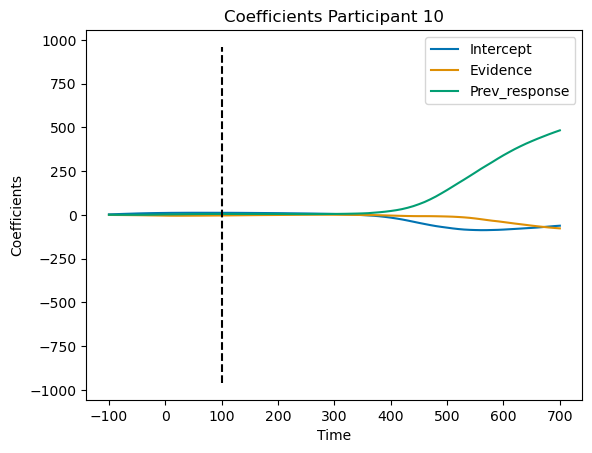

Participant 11, Iteration 1
Participant 11, Iteration 2
Participant 11, Iteration 3
Participant 11, Iteration 4
Participant 11, Iteration 5
Participant 11, Iteration 6
Participant 11, Iteration 7
Participant 11, Iteration 8
Participant 11, Iteration 9
Participant 11, Iteration 10
Participant 11, Iteration 11
Participant 11, Iteration 12
Participant 11, Iteration 13
Participant 11, Iteration 14
Participant 11, Iteration 15
Participant 11, Iteration 16
Participant 11, Iteration 17
Participant 11, Iteration 18
Participant 11, Iteration 19
Participant 11, Iteration 20
Participant 11, Iteration 21
Participant 11, Iteration 22
Participant 11, Iteration 23
Participant 11, Iteration 24
Participant 11, Iteration 25
Participant 11, Iteration 26
Participant 11, Iteration 27
Participant 11, Iteration 28
Participant 11, Iteration 29
Participant 11, Iteration 30
Participant 11, Iteration 31
Participant 11, Iteration 32
Participant 11, Iteration 33
Participant 11, Iteration 34
Participant 11, Iterati

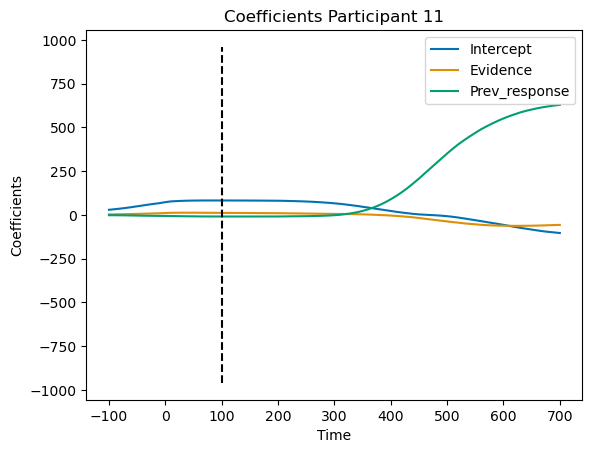

Participant 12, Iteration 1
Participant 12, Iteration 2
Participant 12, Iteration 3
Participant 12, Iteration 4
Participant 12, Iteration 5
Participant 12, Iteration 6
Participant 12, Iteration 7
Participant 12, Iteration 8
Participant 12, Iteration 9
Participant 12, Iteration 10
Participant 12, Iteration 11
Participant 12, Iteration 12
Participant 12, Iteration 13
Participant 12, Iteration 14
Participant 12, Iteration 15
Participant 12, Iteration 16
Participant 12, Iteration 17
Participant 12, Iteration 18
Participant 12, Iteration 19
Participant 12, Iteration 20
Participant 12, Iteration 21
Participant 12, Iteration 22
Participant 12, Iteration 23
Participant 12, Iteration 24
Participant 12, Iteration 25
Participant 12, Iteration 26
Participant 12, Iteration 27
Participant 12, Iteration 28
Participant 12, Iteration 29
Participant 12, Iteration 30
Participant 12, Iteration 31
Participant 12, Iteration 32
Participant 12, Iteration 33
Participant 12, Iteration 34
Participant 12, Iterati

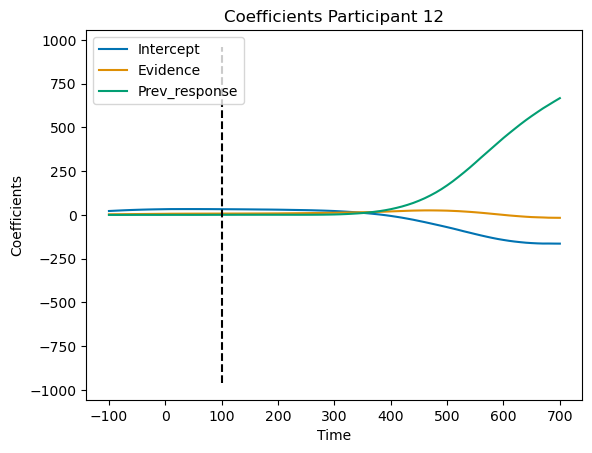

Participant 13, Iteration 1
Participant 13, Iteration 2
Participant 13, Iteration 3
Participant 13, Iteration 4
Participant 13, Iteration 5
Participant 13, Iteration 6
Participant 13, Iteration 7
Participant 13, Iteration 8
Participant 13, Iteration 9
Participant 13, Iteration 10
Participant 13, Iteration 11
Participant 13, Iteration 12
Participant 13, Iteration 13
Participant 13, Iteration 14
Participant 13, Iteration 15
Participant 13, Iteration 16
Participant 13, Iteration 17
Participant 13, Iteration 18
Participant 13, Iteration 19
Participant 13, Iteration 20
Participant 13, Iteration 21
Participant 13, Iteration 22
Participant 13, Iteration 23
Participant 13, Iteration 24
Participant 13, Iteration 25
Participant 13, Iteration 26
Participant 13, Iteration 27
Participant 13, Iteration 28
Participant 13, Iteration 29
Participant 13, Iteration 30
Participant 13, Iteration 31
Participant 13, Iteration 32
Participant 13, Iteration 33
Participant 13, Iteration 34
Participant 13, Iterati

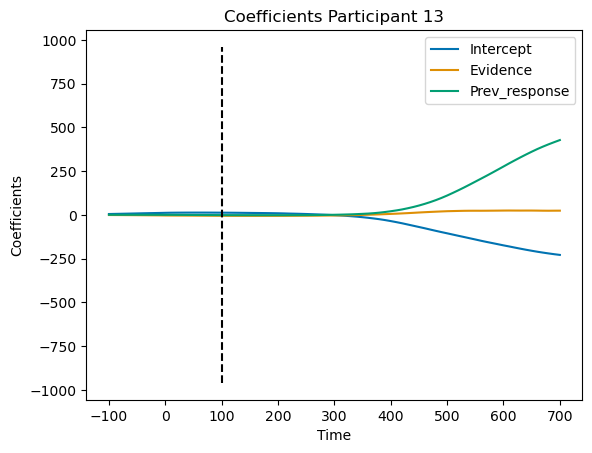

Participant 14, Iteration 1
Participant 14, Iteration 2
Participant 14, Iteration 3
Participant 14, Iteration 4
Participant 14, Iteration 5
Participant 14, Iteration 6
Participant 14, Iteration 7
Participant 14, Iteration 8
Participant 14, Iteration 9
Participant 14, Iteration 10
Participant 14, Iteration 11
Participant 14, Iteration 12
Participant 14, Iteration 13
Participant 14, Iteration 14
Participant 14, Iteration 15
Participant 14, Iteration 16
Participant 14, Iteration 17
Participant 14, Iteration 18
Participant 14, Iteration 19
Participant 14, Iteration 20
Participant 14, Iteration 21
Participant 14, Iteration 22
Participant 14, Iteration 23
Participant 14, Iteration 24
Participant 14, Iteration 25
Participant 14, Iteration 26
Participant 14, Iteration 27
Participant 14, Iteration 28
Participant 14, Iteration 29
Participant 14, Iteration 30
Participant 14, Iteration 31
Participant 14, Iteration 32
Participant 14, Iteration 33
Participant 14, Iteration 34
Participant 14, Iterati

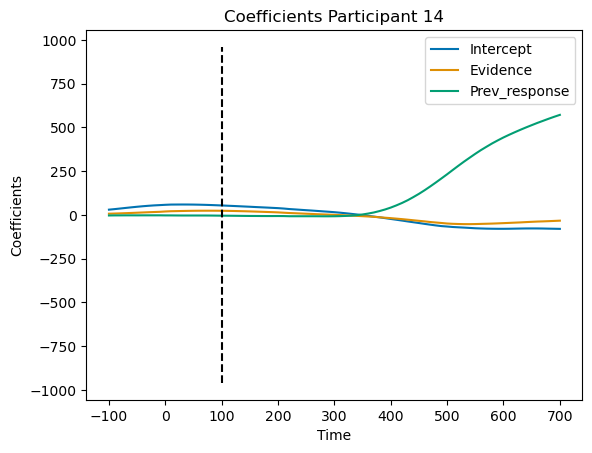

Participant 15, Iteration 1
Participant 15, Iteration 2
Participant 15, Iteration 3
Participant 15, Iteration 4
Participant 15, Iteration 5
Participant 15, Iteration 6
Participant 15, Iteration 7
Participant 15, Iteration 8
Participant 15, Iteration 9
Participant 15, Iteration 10
Participant 15, Iteration 11
Participant 15, Iteration 12
Participant 15, Iteration 13
Participant 15, Iteration 14
Participant 15, Iteration 15
Participant 15, Iteration 16
Participant 15, Iteration 17
Participant 15, Iteration 18
Participant 15, Iteration 19
Participant 15, Iteration 20
Participant 15, Iteration 21
Participant 15, Iteration 22
Participant 15, Iteration 23
Participant 15, Iteration 24
Participant 15, Iteration 25
Participant 15, Iteration 26
Participant 15, Iteration 27
Participant 15, Iteration 28
Participant 15, Iteration 29
Participant 15, Iteration 30
Participant 15, Iteration 31
Participant 15, Iteration 32
Participant 15, Iteration 33
Participant 15, Iteration 34
Participant 15, Iterati

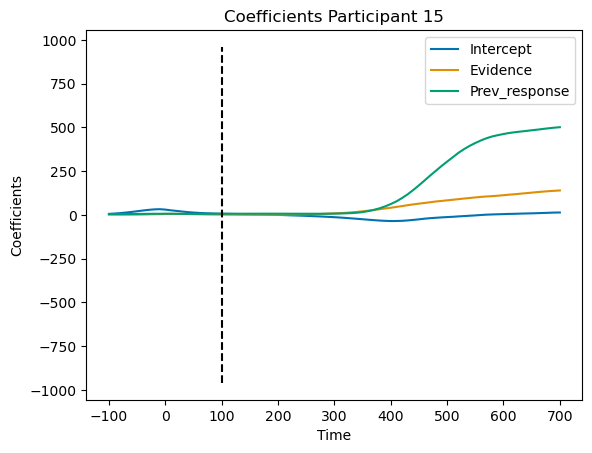

Participant 16, Iteration 1
Participant 16, Iteration 2
Participant 16, Iteration 3
Participant 16, Iteration 4
Participant 16, Iteration 5
Participant 16, Iteration 6
Participant 16, Iteration 7
Participant 16, Iteration 8
Participant 16, Iteration 9
Participant 16, Iteration 10
Participant 16, Iteration 11
Participant 16, Iteration 12
Participant 16, Iteration 13
Participant 16, Iteration 14
Participant 16, Iteration 15
Participant 16, Iteration 16
Participant 16, Iteration 17
Participant 16, Iteration 18
Participant 16, Iteration 19
Participant 16, Iteration 20
Participant 16, Iteration 21
Participant 16, Iteration 22
Participant 16, Iteration 23
Participant 16, Iteration 24
Participant 16, Iteration 25
Participant 16, Iteration 26
Participant 16, Iteration 27
Participant 16, Iteration 28
Participant 16, Iteration 29
Participant 16, Iteration 30
Participant 16, Iteration 31
Participant 16, Iteration 32
Participant 16, Iteration 33
Participant 16, Iteration 34
Participant 16, Iterati

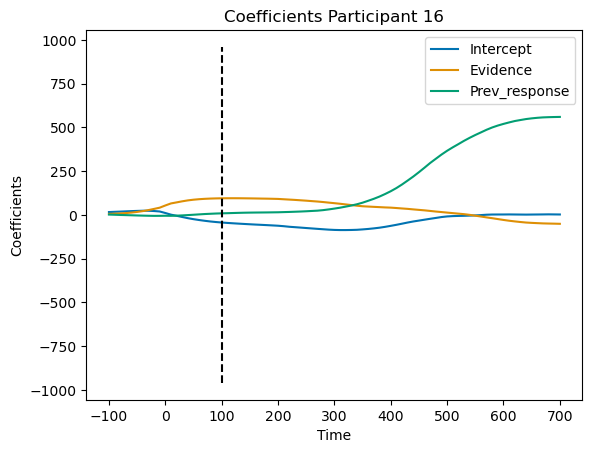

Participant 17, Iteration 1
Participant 17, Iteration 2
Participant 17, Iteration 3
Participant 17, Iteration 4
Participant 17, Iteration 5
Participant 17, Iteration 6
Participant 17, Iteration 7
Participant 17, Iteration 8
Participant 17, Iteration 9
Participant 17, Iteration 10
Participant 17, Iteration 11
Participant 17, Iteration 12
Participant 17, Iteration 13
Participant 17, Iteration 14
Participant 17, Iteration 15
Participant 17, Iteration 16
Participant 17, Iteration 17
Participant 17, Iteration 18
Participant 17, Iteration 19
Participant 17, Iteration 20
Participant 17, Iteration 21
Participant 17, Iteration 22
Participant 17, Iteration 23
Participant 17, Iteration 24
Participant 17, Iteration 25
Participant 17, Iteration 26
Participant 17, Iteration 27
Participant 17, Iteration 28
Participant 17, Iteration 29
Participant 17, Iteration 30
Participant 17, Iteration 31
Participant 17, Iteration 32
Participant 17, Iteration 33
Participant 17, Iteration 34
Participant 17, Iterati

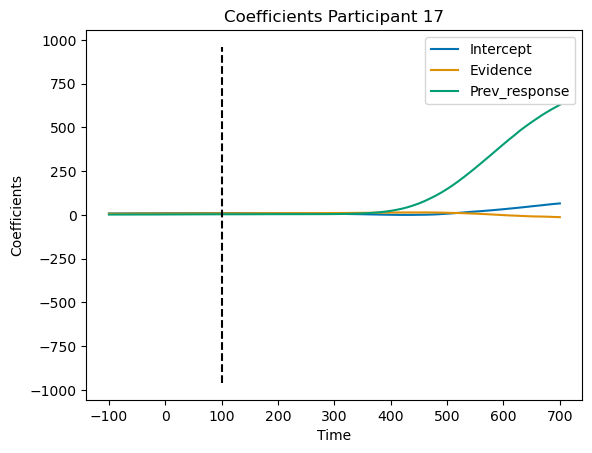

Participant 18, Iteration 1
Participant 18, Iteration 2
Participant 18, Iteration 3
Participant 18, Iteration 4
Participant 18, Iteration 5
Participant 18, Iteration 6
Participant 18, Iteration 7
Participant 18, Iteration 8
Participant 18, Iteration 9
Participant 18, Iteration 10
Participant 18, Iteration 11
Participant 18, Iteration 12
Participant 18, Iteration 13
Participant 18, Iteration 14
Participant 18, Iteration 15
Participant 18, Iteration 16
Participant 18, Iteration 17
Participant 18, Iteration 18
Participant 18, Iteration 19
Participant 18, Iteration 20
Participant 18, Iteration 21
Participant 18, Iteration 22
Participant 18, Iteration 23
Participant 18, Iteration 24
Participant 18, Iteration 25
Participant 18, Iteration 26
Participant 18, Iteration 27
Participant 18, Iteration 28
Participant 18, Iteration 29
Participant 18, Iteration 30
Participant 18, Iteration 31
Participant 18, Iteration 32
Participant 18, Iteration 33
Participant 18, Iteration 34
Participant 18, Iterati

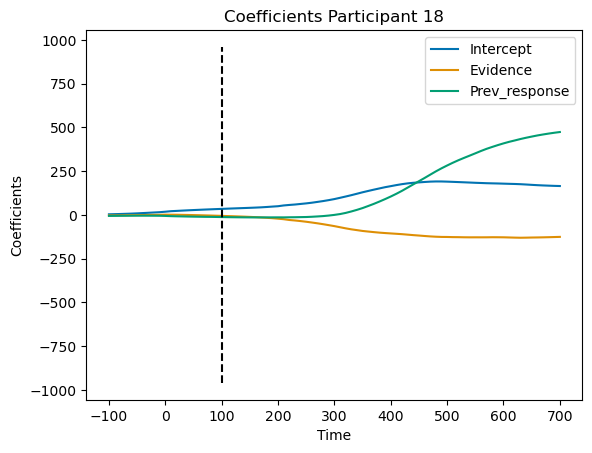

Participant 19, Iteration 1
Participant 19, Iteration 2
Participant 19, Iteration 3
Participant 19, Iteration 4
Participant 19, Iteration 5
Participant 19, Iteration 6
Participant 19, Iteration 7
Participant 19, Iteration 8
Participant 19, Iteration 9
Participant 19, Iteration 10
Participant 19, Iteration 11
Participant 19, Iteration 12
Participant 19, Iteration 13
Participant 19, Iteration 14
Participant 19, Iteration 15
Participant 19, Iteration 16
Participant 19, Iteration 17
Participant 19, Iteration 18
Participant 19, Iteration 19
Participant 19, Iteration 20
Participant 19, Iteration 21
Participant 19, Iteration 22
Participant 19, Iteration 23
Participant 19, Iteration 24
Participant 19, Iteration 25
Participant 19, Iteration 26
Participant 19, Iteration 27
Participant 19, Iteration 28
Participant 19, Iteration 29
Participant 19, Iteration 30
Participant 19, Iteration 31
Participant 19, Iteration 32
Participant 19, Iteration 33
Participant 19, Iteration 34
Participant 19, Iterati

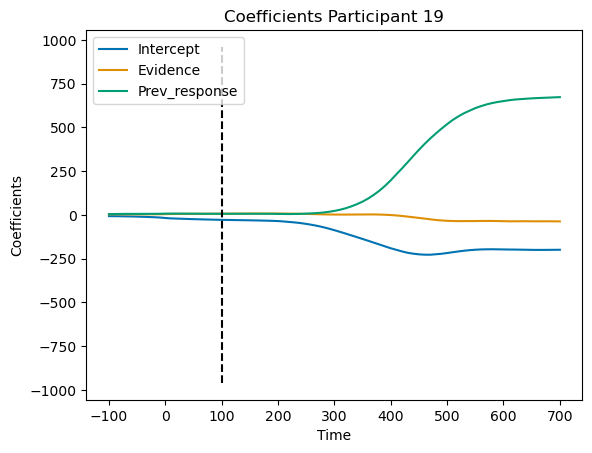

Participant 1, Iteration 1
Participant 1, Iteration 2
Participant 1, Iteration 3
Participant 1, Iteration 4
Participant 1, Iteration 5
Participant 1, Iteration 6
Participant 1, Iteration 7
Participant 1, Iteration 8
Participant 1, Iteration 9
Participant 1, Iteration 10
Participant 1, Iteration 11
Participant 1, Iteration 12
Participant 1, Iteration 13
Participant 1, Iteration 14
Participant 1, Iteration 15
Participant 1, Iteration 16
Participant 1, Iteration 17
Participant 1, Iteration 18
Participant 1, Iteration 19
Participant 1, Iteration 20
Participant 1, Iteration 21
Participant 1, Iteration 22
Participant 1, Iteration 23
Participant 1, Iteration 24
Participant 1, Iteration 25
Participant 1, Iteration 26
Participant 1, Iteration 27
Participant 1, Iteration 28
Participant 1, Iteration 29
Participant 1, Iteration 30
Participant 1, Iteration 31
Participant 1, Iteration 32
Participant 1, Iteration 33
Participant 1, Iteration 34
Participant 1, Iteration 35
Participant 1, Iteration 36
P

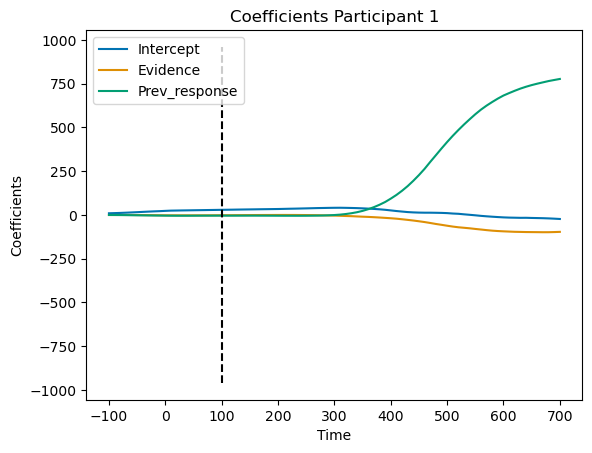

Participant 20, Iteration 1
Participant 20, Iteration 2
Participant 20, Iteration 3
Participant 20, Iteration 4
Participant 20, Iteration 5
Participant 20, Iteration 6
Participant 20, Iteration 7
Participant 20, Iteration 8
Participant 20, Iteration 9
Participant 20, Iteration 10
Participant 20, Iteration 11
Participant 20, Iteration 12
Participant 20, Iteration 13
Participant 20, Iteration 14
Participant 20, Iteration 15
Participant 20, Iteration 16
Participant 20, Iteration 17
Participant 20, Iteration 18
Participant 20, Iteration 19
Participant 20, Iteration 20
Participant 20, Iteration 21
Participant 20, Iteration 22
Participant 20, Iteration 23
Participant 20, Iteration 24
Participant 20, Iteration 25
Participant 20, Iteration 26
Participant 20, Iteration 27
Participant 20, Iteration 28
Participant 20, Iteration 29
Participant 20, Iteration 30
Participant 20, Iteration 31
Participant 20, Iteration 32
Participant 20, Iteration 33
Participant 20, Iteration 34
Participant 20, Iterati

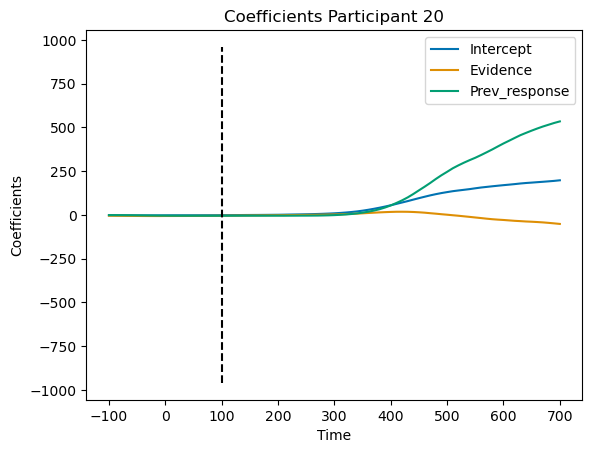

Participant 23, Iteration 1
Participant 23, Iteration 2
Participant 23, Iteration 3
Participant 23, Iteration 4
Participant 23, Iteration 5
Participant 23, Iteration 6
Participant 23, Iteration 7
Participant 23, Iteration 8
Participant 23, Iteration 9
Participant 23, Iteration 10
Participant 23, Iteration 11
Participant 23, Iteration 12
Participant 23, Iteration 13
Participant 23, Iteration 14
Participant 23, Iteration 15
Participant 23, Iteration 16
Participant 23, Iteration 17
Participant 23, Iteration 18
Participant 23, Iteration 19
Participant 23, Iteration 20
Participant 23, Iteration 21
Participant 23, Iteration 22
Participant 23, Iteration 23
Participant 23, Iteration 24
Participant 23, Iteration 25
Participant 23, Iteration 26
Participant 23, Iteration 27
Participant 23, Iteration 28
Participant 23, Iteration 29
Participant 23, Iteration 30
Participant 23, Iteration 31
Participant 23, Iteration 32
Participant 23, Iteration 33
Participant 23, Iteration 34
Participant 23, Iterati

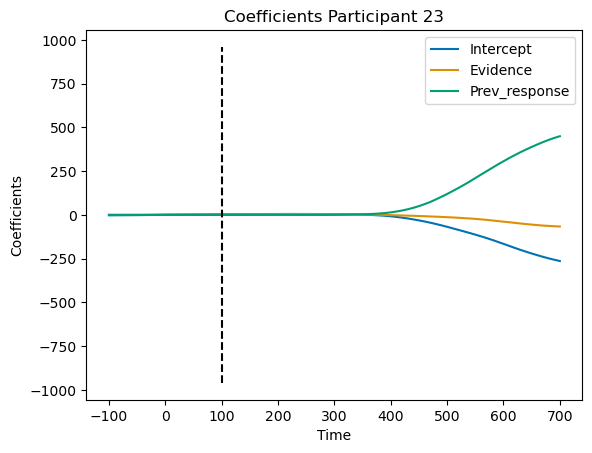

Participant 24, Iteration 1
Participant 24, Iteration 2
Participant 24, Iteration 3
Participant 24, Iteration 4
Participant 24, Iteration 5
Participant 24, Iteration 6
Participant 24, Iteration 7
Participant 24, Iteration 8
Participant 24, Iteration 9
Participant 24, Iteration 10
Participant 24, Iteration 11
Participant 24, Iteration 12
Participant 24, Iteration 13
Participant 24, Iteration 14
Participant 24, Iteration 15
Participant 24, Iteration 16
Participant 24, Iteration 17
Participant 24, Iteration 18
Participant 24, Iteration 19
Participant 24, Iteration 20
Participant 24, Iteration 21
Participant 24, Iteration 22
Participant 24, Iteration 23
Participant 24, Iteration 24
Participant 24, Iteration 25
Participant 24, Iteration 26
Participant 24, Iteration 27
Participant 24, Iteration 28
Participant 24, Iteration 29
Participant 24, Iteration 30
Participant 24, Iteration 31
Participant 24, Iteration 32
Participant 24, Iteration 33
Participant 24, Iteration 34
Participant 24, Iterati

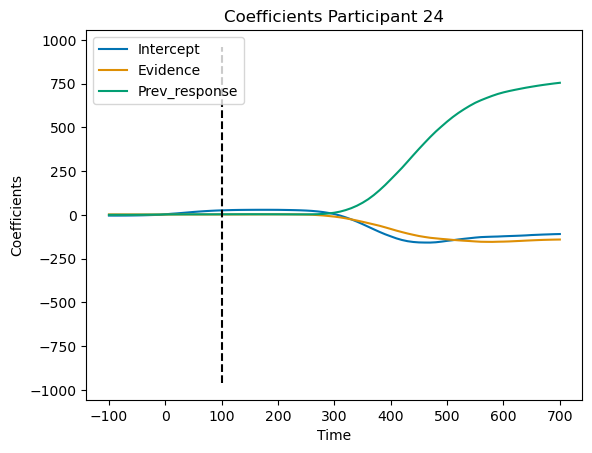

Participant 25, Iteration 1
Participant 25, Iteration 2
Participant 25, Iteration 3
Participant 25, Iteration 4
Participant 25, Iteration 5
Participant 25, Iteration 6
Participant 25, Iteration 7
Participant 25, Iteration 8
Participant 25, Iteration 9
Participant 25, Iteration 10
Participant 25, Iteration 11
Participant 25, Iteration 12
Participant 25, Iteration 13
Participant 25, Iteration 14
Participant 25, Iteration 15
Participant 25, Iteration 16
Participant 25, Iteration 17
Participant 25, Iteration 18
Participant 25, Iteration 19
Participant 25, Iteration 20
Participant 25, Iteration 21
Participant 25, Iteration 22
Participant 25, Iteration 23
Participant 25, Iteration 24
Participant 25, Iteration 25
Participant 25, Iteration 26
Participant 25, Iteration 27
Participant 25, Iteration 28
Participant 25, Iteration 29
Participant 25, Iteration 30
Participant 25, Iteration 31
Participant 25, Iteration 32
Participant 25, Iteration 33
Participant 25, Iteration 34
Participant 25, Iterati

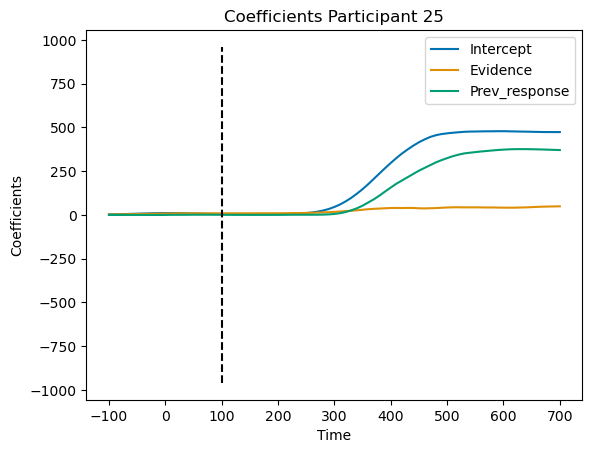

Participant 26, Iteration 1
Participant 26, Iteration 2
Participant 26, Iteration 3
Participant 26, Iteration 4
Participant 26, Iteration 5
Participant 26, Iteration 6
Participant 26, Iteration 7
Participant 26, Iteration 8
Participant 26, Iteration 9
Participant 26, Iteration 10
Participant 26, Iteration 11
Participant 26, Iteration 12
Participant 26, Iteration 13
Participant 26, Iteration 14
Participant 26, Iteration 15
Participant 26, Iteration 16
Participant 26, Iteration 17
Participant 26, Iteration 18
Participant 26, Iteration 19
Participant 26, Iteration 20
Participant 26, Iteration 21
Participant 26, Iteration 22
Participant 26, Iteration 23
Participant 26, Iteration 24
Participant 26, Iteration 25
Participant 26, Iteration 26
Participant 26, Iteration 27
Participant 26, Iteration 28
Participant 26, Iteration 29
Participant 26, Iteration 30
Participant 26, Iteration 31
Participant 26, Iteration 32
Participant 26, Iteration 33
Participant 26, Iteration 34
Participant 26, Iterati

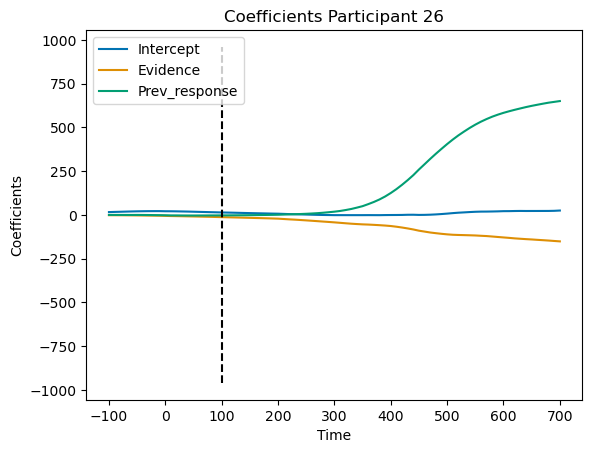

Participant 27, Iteration 1
Participant 27, Iteration 2
Participant 27, Iteration 3
Participant 27, Iteration 4
Participant 27, Iteration 5
Participant 27, Iteration 6
Participant 27, Iteration 7
Participant 27, Iteration 8
Participant 27, Iteration 9
Participant 27, Iteration 10
Participant 27, Iteration 11
Participant 27, Iteration 12
Participant 27, Iteration 13
Participant 27, Iteration 14
Participant 27, Iteration 15
Participant 27, Iteration 16
Participant 27, Iteration 17
Participant 27, Iteration 18
Participant 27, Iteration 19
Participant 27, Iteration 20
Participant 27, Iteration 21
Participant 27, Iteration 22
Participant 27, Iteration 23
Participant 27, Iteration 24
Participant 27, Iteration 25
Participant 27, Iteration 26
Participant 27, Iteration 27
Participant 27, Iteration 28
Participant 27, Iteration 29
Participant 27, Iteration 30
Participant 27, Iteration 31
Participant 27, Iteration 32
Participant 27, Iteration 33
Participant 27, Iteration 34
Participant 27, Iterati

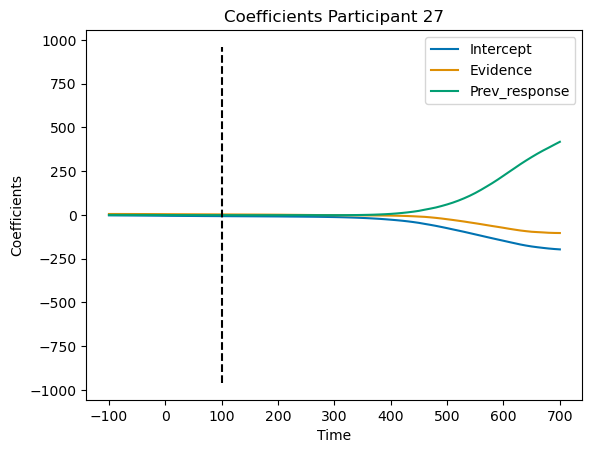

Participant 28, Iteration 1
Participant 28, Iteration 2
Participant 28, Iteration 3
Participant 28, Iteration 4
Participant 28, Iteration 5
Participant 28, Iteration 6
Participant 28, Iteration 7
Participant 28, Iteration 8
Participant 28, Iteration 9
Participant 28, Iteration 10
Participant 28, Iteration 11
Participant 28, Iteration 12
Participant 28, Iteration 13
Participant 28, Iteration 14
Participant 28, Iteration 15
Participant 28, Iteration 16
Participant 28, Iteration 17
Participant 28, Iteration 18
Participant 28, Iteration 19
Participant 28, Iteration 20
Participant 28, Iteration 21
Participant 28, Iteration 22
Participant 28, Iteration 23
Participant 28, Iteration 24
Participant 28, Iteration 25
Participant 28, Iteration 26
Participant 28, Iteration 27
Participant 28, Iteration 28
Participant 28, Iteration 29
Participant 28, Iteration 30
Participant 28, Iteration 31
Participant 28, Iteration 32
Participant 28, Iteration 33
Participant 28, Iteration 34
Participant 28, Iterati

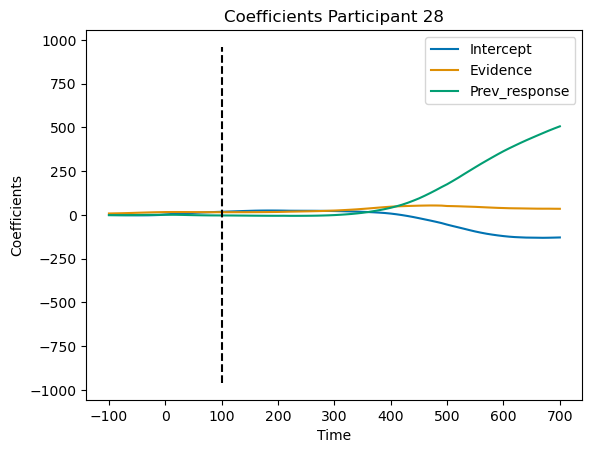

Participant 29, Iteration 1
Participant 29, Iteration 2
Participant 29, Iteration 3
Participant 29, Iteration 4
Participant 29, Iteration 5
Participant 29, Iteration 6
Participant 29, Iteration 7
Participant 29, Iteration 8
Participant 29, Iteration 9
Participant 29, Iteration 10
Participant 29, Iteration 11
Participant 29, Iteration 12
Participant 29, Iteration 13
Participant 29, Iteration 14
Participant 29, Iteration 15
Participant 29, Iteration 16
Participant 29, Iteration 17
Participant 29, Iteration 18
Participant 29, Iteration 19
Participant 29, Iteration 20
Participant 29, Iteration 21
Participant 29, Iteration 22
Participant 29, Iteration 23
Participant 29, Iteration 24
Participant 29, Iteration 25
Participant 29, Iteration 26
Participant 29, Iteration 27
Participant 29, Iteration 28
Participant 29, Iteration 29
Participant 29, Iteration 30
Participant 29, Iteration 31
Participant 29, Iteration 32
Participant 29, Iteration 33
Participant 29, Iteration 34
Participant 29, Iterati

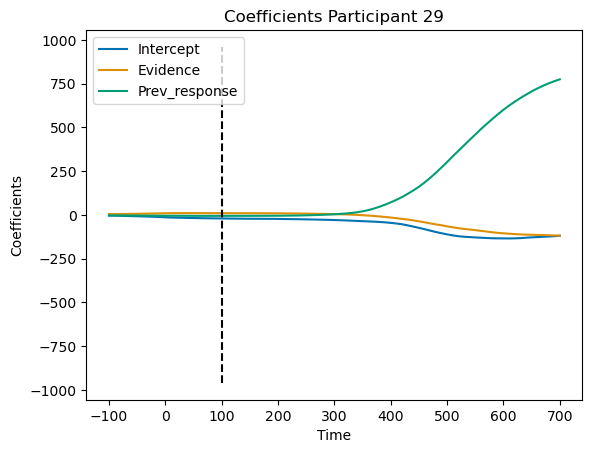

Participant 2, Iteration 1
Participant 2, Iteration 2
Participant 2, Iteration 3
Participant 2, Iteration 4
Participant 2, Iteration 5
Participant 2, Iteration 6
Participant 2, Iteration 7
Participant 2, Iteration 8
Participant 2, Iteration 9
Participant 2, Iteration 10
Participant 2, Iteration 11
Participant 2, Iteration 12
Participant 2, Iteration 13
Participant 2, Iteration 14
Participant 2, Iteration 15
Participant 2, Iteration 16
Participant 2, Iteration 17
Participant 2, Iteration 18
Participant 2, Iteration 19
Participant 2, Iteration 20
Participant 2, Iteration 21
Participant 2, Iteration 22
Participant 2, Iteration 23
Participant 2, Iteration 24
Participant 2, Iteration 25
Participant 2, Iteration 26
Participant 2, Iteration 27
Participant 2, Iteration 28
Participant 2, Iteration 29
Participant 2, Iteration 30
Participant 2, Iteration 31
Participant 2, Iteration 32
Participant 2, Iteration 33
Participant 2, Iteration 34
Participant 2, Iteration 35
Participant 2, Iteration 36
P

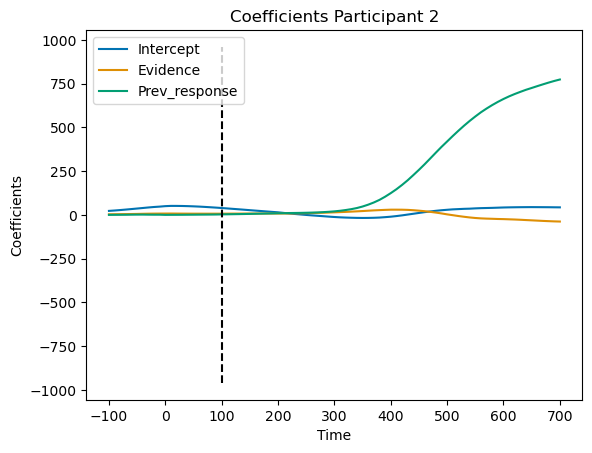

Participant 30, Iteration 1
Participant 30, Iteration 2
Participant 30, Iteration 3
Participant 30, Iteration 4
Participant 30, Iteration 5
Participant 30, Iteration 6
Participant 30, Iteration 7
Participant 30, Iteration 8
Participant 30, Iteration 9
Participant 30, Iteration 10
Participant 30, Iteration 11
Participant 30, Iteration 12
Participant 30, Iteration 13
Participant 30, Iteration 14
Participant 30, Iteration 15
Participant 30, Iteration 16
Participant 30, Iteration 17
Participant 30, Iteration 18
Participant 30, Iteration 19
Participant 30, Iteration 20
Participant 30, Iteration 21
Participant 30, Iteration 22
Participant 30, Iteration 23
Participant 30, Iteration 24
Participant 30, Iteration 25
Participant 30, Iteration 26
Participant 30, Iteration 27
Participant 30, Iteration 28
Participant 30, Iteration 29
Participant 30, Iteration 30
Participant 30, Iteration 31
Participant 30, Iteration 32
Participant 30, Iteration 33
Participant 30, Iteration 34
Participant 30, Iterati

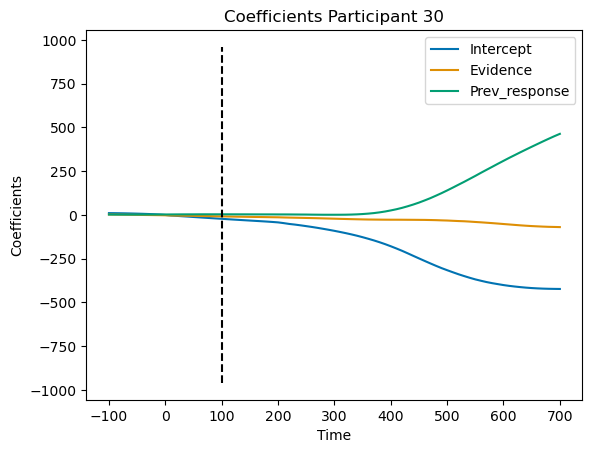

Participant 32, Iteration 1
Participant 32, Iteration 2
Participant 32, Iteration 3
Participant 32, Iteration 4
Participant 32, Iteration 5
Participant 32, Iteration 6
Participant 32, Iteration 7
Participant 32, Iteration 8
Participant 32, Iteration 9
Participant 32, Iteration 10
Participant 32, Iteration 11
Participant 32, Iteration 12
Participant 32, Iteration 13
Participant 32, Iteration 14
Participant 32, Iteration 15
Participant 32, Iteration 16
Participant 32, Iteration 17
Participant 32, Iteration 18
Participant 32, Iteration 19
Participant 32, Iteration 20
Participant 32, Iteration 21
Participant 32, Iteration 22
Participant 32, Iteration 23
Participant 32, Iteration 24
Participant 32, Iteration 25
Participant 32, Iteration 26
Participant 32, Iteration 27
Participant 32, Iteration 28
Participant 32, Iteration 29
Participant 32, Iteration 30
Participant 32, Iteration 31
Participant 32, Iteration 32
Participant 32, Iteration 33
Participant 32, Iteration 34
Participant 32, Iterati

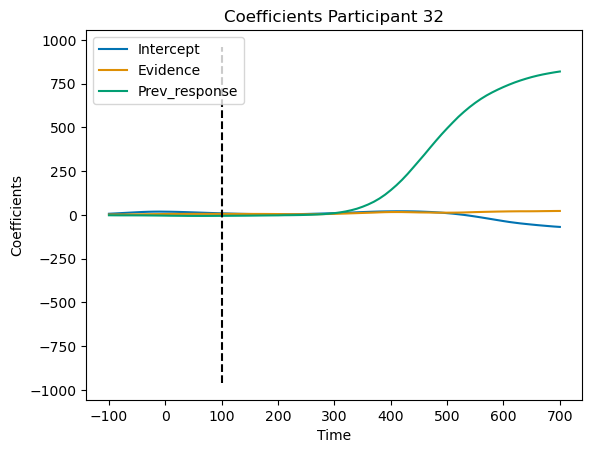

Participant 33, Iteration 1
Participant 33, Iteration 2
Participant 33, Iteration 3
Participant 33, Iteration 4
Participant 33, Iteration 5
Participant 33, Iteration 6
Participant 33, Iteration 7
Participant 33, Iteration 8
Participant 33, Iteration 9
Participant 33, Iteration 10
Participant 33, Iteration 11
Participant 33, Iteration 12
Participant 33, Iteration 13
Participant 33, Iteration 14
Participant 33, Iteration 15
Participant 33, Iteration 16
Participant 33, Iteration 17
Participant 33, Iteration 18
Participant 33, Iteration 19
Participant 33, Iteration 20
Participant 33, Iteration 21
Participant 33, Iteration 22
Participant 33, Iteration 23
Participant 33, Iteration 24
Participant 33, Iteration 25
Participant 33, Iteration 26
Participant 33, Iteration 27
Participant 33, Iteration 28
Participant 33, Iteration 29
Participant 33, Iteration 30
Participant 33, Iteration 31
Participant 33, Iteration 32
Participant 33, Iteration 33
Participant 33, Iteration 34
Participant 33, Iterati

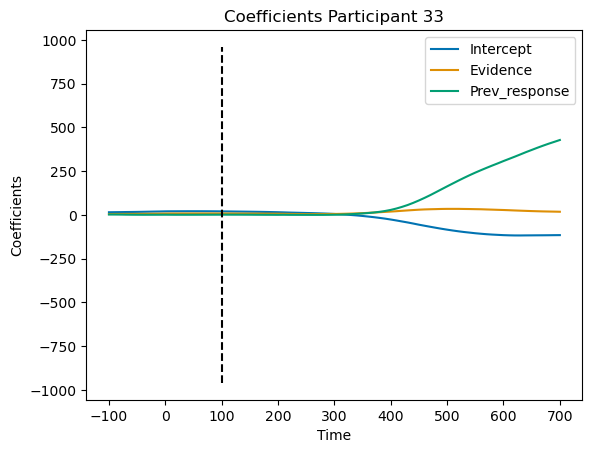

Participant 34, Iteration 1
Participant 34, Iteration 2
Participant 34, Iteration 3
Participant 34, Iteration 4
Participant 34, Iteration 5
Participant 34, Iteration 6
Participant 34, Iteration 7
Participant 34, Iteration 8
Participant 34, Iteration 9
Participant 34, Iteration 10
Participant 34, Iteration 11
Participant 34, Iteration 12
Participant 34, Iteration 13
Participant 34, Iteration 14
Participant 34, Iteration 15
Participant 34, Iteration 16
Participant 34, Iteration 17
Participant 34, Iteration 18
Participant 34, Iteration 19
Participant 34, Iteration 20
Participant 34, Iteration 21
Participant 34, Iteration 22
Participant 34, Iteration 23
Participant 34, Iteration 24
Participant 34, Iteration 25
Participant 34, Iteration 26
Participant 34, Iteration 27
Participant 34, Iteration 28
Participant 34, Iteration 29
Participant 34, Iteration 30
Participant 34, Iteration 31
Participant 34, Iteration 32
Participant 34, Iteration 33
Participant 34, Iteration 34
Participant 34, Iterati

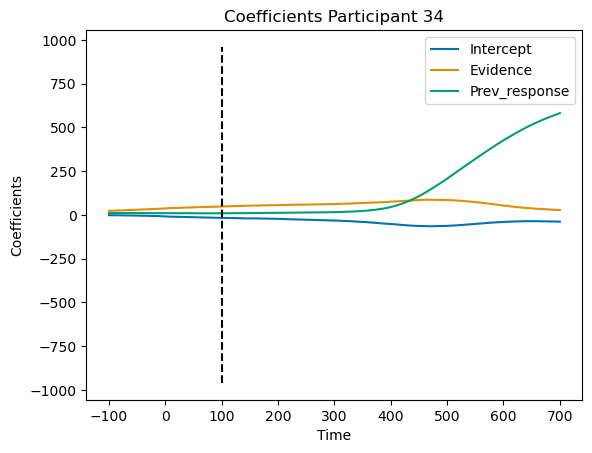

Participant 36, Iteration 1
Participant 36, Iteration 2
Participant 36, Iteration 3
Participant 36, Iteration 4
Participant 36, Iteration 5
Participant 36, Iteration 6
Participant 36, Iteration 7
Participant 36, Iteration 8
Participant 36, Iteration 9
Participant 36, Iteration 10
Participant 36, Iteration 11
Participant 36, Iteration 12
Participant 36, Iteration 13
Participant 36, Iteration 14
Participant 36, Iteration 15
Participant 36, Iteration 16
Participant 36, Iteration 17
Participant 36, Iteration 18
Participant 36, Iteration 19
Participant 36, Iteration 20
Participant 36, Iteration 21
Participant 36, Iteration 22
Participant 36, Iteration 23
Participant 36, Iteration 24
Participant 36, Iteration 25
Participant 36, Iteration 26
Participant 36, Iteration 27
Participant 36, Iteration 28
Participant 36, Iteration 29
Participant 36, Iteration 30
Participant 36, Iteration 31
Participant 36, Iteration 32
Participant 36, Iteration 33
Participant 36, Iteration 34
Participant 36, Iterati

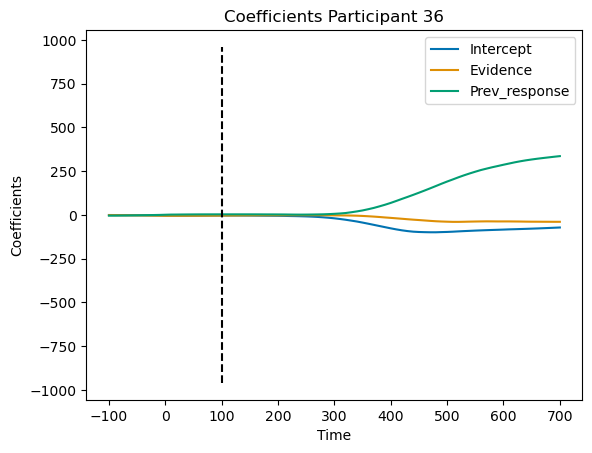

Participant 37, Iteration 1
Participant 37, Iteration 2
Participant 37, Iteration 3
Participant 37, Iteration 4
Participant 37, Iteration 5
Participant 37, Iteration 6
Participant 37, Iteration 7
Participant 37, Iteration 8
Participant 37, Iteration 9
Participant 37, Iteration 10
Participant 37, Iteration 11
Participant 37, Iteration 12
Participant 37, Iteration 13
Participant 37, Iteration 14
Participant 37, Iteration 15
Participant 37, Iteration 16
Participant 37, Iteration 17
Participant 37, Iteration 18
Participant 37, Iteration 19
Participant 37, Iteration 20
Participant 37, Iteration 21
Participant 37, Iteration 22
Participant 37, Iteration 23
Participant 37, Iteration 24
Participant 37, Iteration 25
Participant 37, Iteration 26
Participant 37, Iteration 27
Participant 37, Iteration 28
Participant 37, Iteration 29
Participant 37, Iteration 30
Participant 37, Iteration 31
Participant 37, Iteration 32
Participant 37, Iteration 33
Participant 37, Iteration 34
Participant 37, Iterati

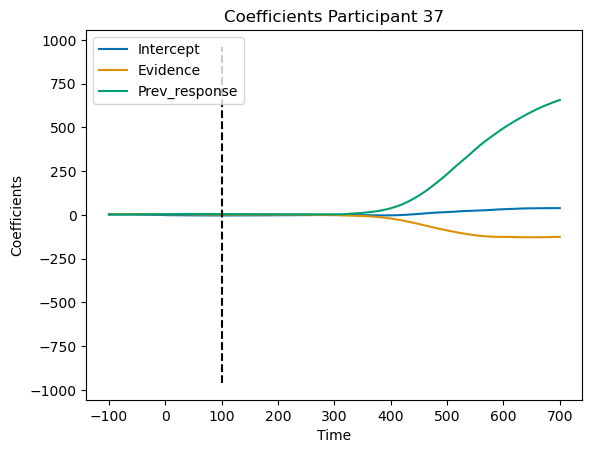

Participant 38, Iteration 1
Participant 38, Iteration 2
Participant 38, Iteration 3
Participant 38, Iteration 4
Participant 38, Iteration 5
Participant 38, Iteration 6
Participant 38, Iteration 7
Participant 38, Iteration 8
Participant 38, Iteration 9
Participant 38, Iteration 10
Participant 38, Iteration 11
Participant 38, Iteration 12
Participant 38, Iteration 13
Participant 38, Iteration 14
Participant 38, Iteration 15
Participant 38, Iteration 16
Participant 38, Iteration 17
Participant 38, Iteration 18
Participant 38, Iteration 19
Participant 38, Iteration 20
Participant 38, Iteration 21
Participant 38, Iteration 22
Participant 38, Iteration 23
Participant 38, Iteration 24
Participant 38, Iteration 25
Participant 38, Iteration 26
Participant 38, Iteration 27
Participant 38, Iteration 28
Participant 38, Iteration 29
Participant 38, Iteration 30
Participant 38, Iteration 31
Participant 38, Iteration 32
Participant 38, Iteration 33
Participant 38, Iteration 34
Participant 38, Iterati

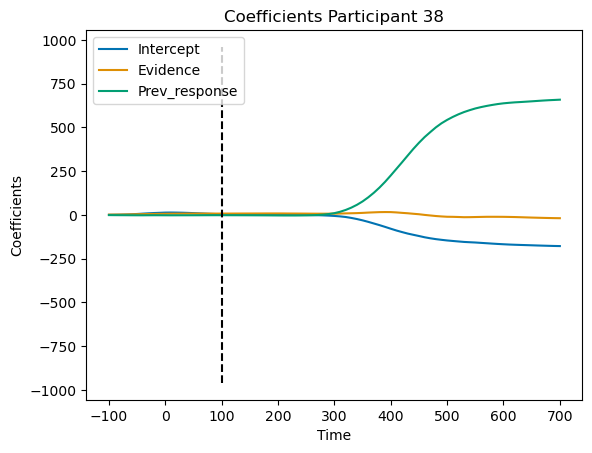

Participant 39, Iteration 1
Participant 39, Iteration 2
Participant 39, Iteration 3
Participant 39, Iteration 4
Participant 39, Iteration 5
Participant 39, Iteration 6
Participant 39, Iteration 7
Participant 39, Iteration 8
Participant 39, Iteration 9
Participant 39, Iteration 10
Participant 39, Iteration 11
Participant 39, Iteration 12
Participant 39, Iteration 13
Participant 39, Iteration 14
Participant 39, Iteration 15
Participant 39, Iteration 16
Participant 39, Iteration 17
Participant 39, Iteration 18
Participant 39, Iteration 19
Participant 39, Iteration 20
Participant 39, Iteration 21
Participant 39, Iteration 22
Participant 39, Iteration 23
Participant 39, Iteration 24
Participant 39, Iteration 25
Participant 39, Iteration 26
Participant 39, Iteration 27
Participant 39, Iteration 28
Participant 39, Iteration 29
Participant 39, Iteration 30
Participant 39, Iteration 31
Participant 39, Iteration 32
Participant 39, Iteration 33
Participant 39, Iteration 34
Participant 39, Iterati

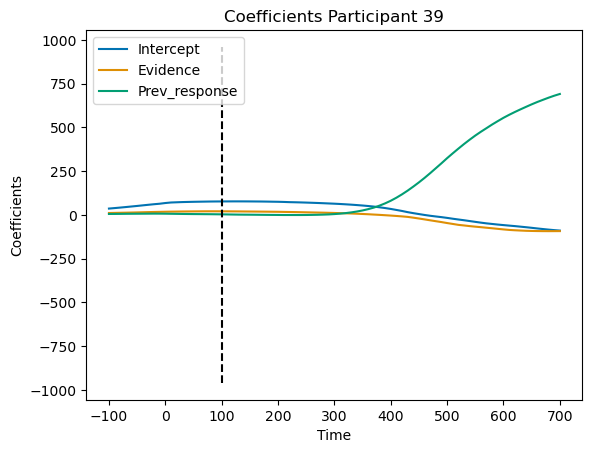

Participant 3, Iteration 1
Participant 3, Iteration 2
Participant 3, Iteration 3
Participant 3, Iteration 4
Participant 3, Iteration 5
Participant 3, Iteration 6
Participant 3, Iteration 7
Participant 3, Iteration 8
Participant 3, Iteration 9
Participant 3, Iteration 10
Participant 3, Iteration 11
Participant 3, Iteration 12
Participant 3, Iteration 13
Participant 3, Iteration 14
Participant 3, Iteration 15
Participant 3, Iteration 16
Participant 3, Iteration 17
Participant 3, Iteration 18
Participant 3, Iteration 19
Participant 3, Iteration 20
Participant 3, Iteration 21
Participant 3, Iteration 22
Participant 3, Iteration 23
Participant 3, Iteration 24
Participant 3, Iteration 25
Participant 3, Iteration 26
Participant 3, Iteration 27
Participant 3, Iteration 28
Participant 3, Iteration 29
Participant 3, Iteration 30
Participant 3, Iteration 31
Participant 3, Iteration 32
Participant 3, Iteration 33
Participant 3, Iteration 34
Participant 3, Iteration 35
Participant 3, Iteration 36
P

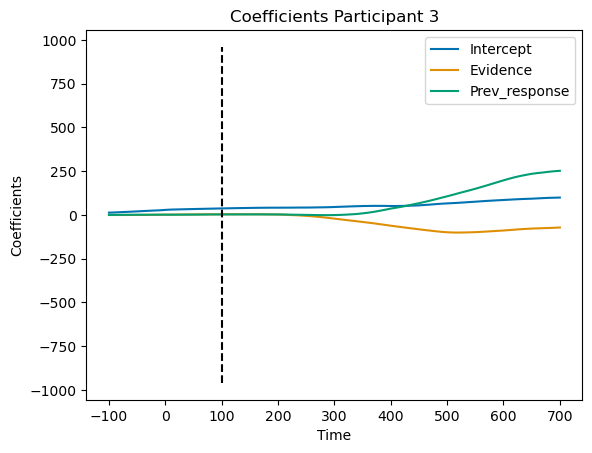

Participant 40, Iteration 1
Participant 40, Iteration 2
Participant 40, Iteration 3
Participant 40, Iteration 4
Participant 40, Iteration 5
Participant 40, Iteration 6
Participant 40, Iteration 7
Participant 40, Iteration 8
Participant 40, Iteration 9
Participant 40, Iteration 10
Participant 40, Iteration 11
Participant 40, Iteration 12
Participant 40, Iteration 13
Participant 40, Iteration 14
Participant 40, Iteration 15
Participant 40, Iteration 16
Participant 40, Iteration 17
Participant 40, Iteration 18
Participant 40, Iteration 19
Participant 40, Iteration 20
Participant 40, Iteration 21
Participant 40, Iteration 22
Participant 40, Iteration 23
Participant 40, Iteration 24
Participant 40, Iteration 25
Participant 40, Iteration 26
Participant 40, Iteration 27
Participant 40, Iteration 28
Participant 40, Iteration 29
Participant 40, Iteration 30
Participant 40, Iteration 31
Participant 40, Iteration 32
Participant 40, Iteration 33
Participant 40, Iteration 34
Participant 40, Iterati

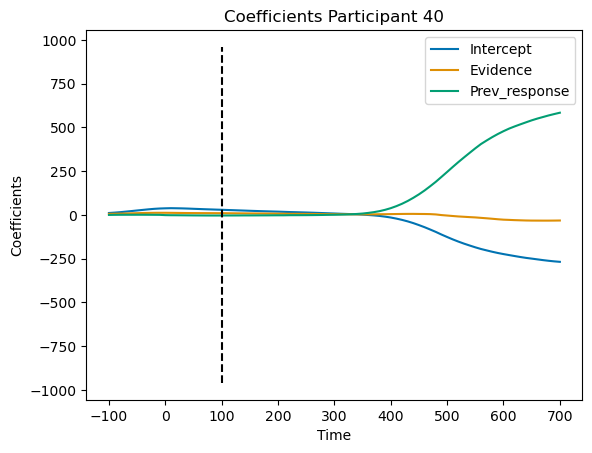

Participant 41, Iteration 1
Participant 41, Iteration 2
Participant 41, Iteration 3
Participant 41, Iteration 4
Participant 41, Iteration 5
Participant 41, Iteration 6
Participant 41, Iteration 7
Participant 41, Iteration 8
Participant 41, Iteration 9
Participant 41, Iteration 10
Participant 41, Iteration 11
Participant 41, Iteration 12
Participant 41, Iteration 13
Participant 41, Iteration 14
Participant 41, Iteration 15
Participant 41, Iteration 16
Participant 41, Iteration 17
Participant 41, Iteration 18
Participant 41, Iteration 19
Participant 41, Iteration 20
Participant 41, Iteration 21
Participant 41, Iteration 22
Participant 41, Iteration 23
Participant 41, Iteration 24
Participant 41, Iteration 25
Participant 41, Iteration 26
Participant 41, Iteration 27
Participant 41, Iteration 28
Participant 41, Iteration 29
Participant 41, Iteration 30
Participant 41, Iteration 31
Participant 41, Iteration 32
Participant 41, Iteration 33
Participant 41, Iteration 34
Participant 41, Iterati

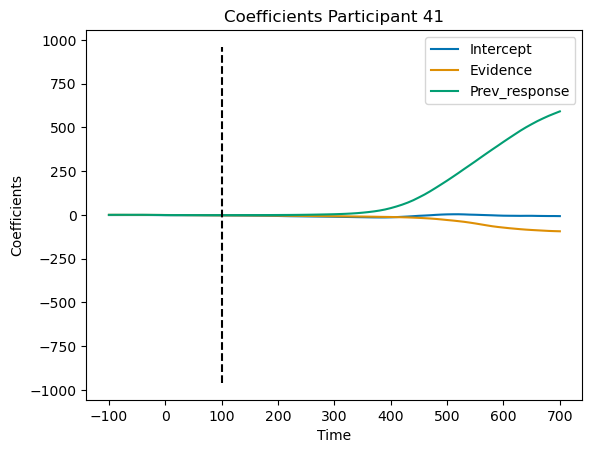

Participant 42, Iteration 1
Participant 42, Iteration 2
Participant 42, Iteration 3
Participant 42, Iteration 4
Participant 42, Iteration 5
Participant 42, Iteration 6
Participant 42, Iteration 7
Participant 42, Iteration 8
Participant 42, Iteration 9
Participant 42, Iteration 10
Participant 42, Iteration 11
Participant 42, Iteration 12
Participant 42, Iteration 13
Participant 42, Iteration 14
Participant 42, Iteration 15
Participant 42, Iteration 16
Participant 42, Iteration 17
Participant 42, Iteration 18
Participant 42, Iteration 19
Participant 42, Iteration 20
Participant 42, Iteration 21
Participant 42, Iteration 22
Participant 42, Iteration 23
Participant 42, Iteration 24
Participant 42, Iteration 25
Participant 42, Iteration 26
Participant 42, Iteration 27
Participant 42, Iteration 28
Participant 42, Iteration 29
Participant 42, Iteration 30
Participant 42, Iteration 31
Participant 42, Iteration 32
Participant 42, Iteration 33
Participant 42, Iteration 34
Participant 42, Iterati

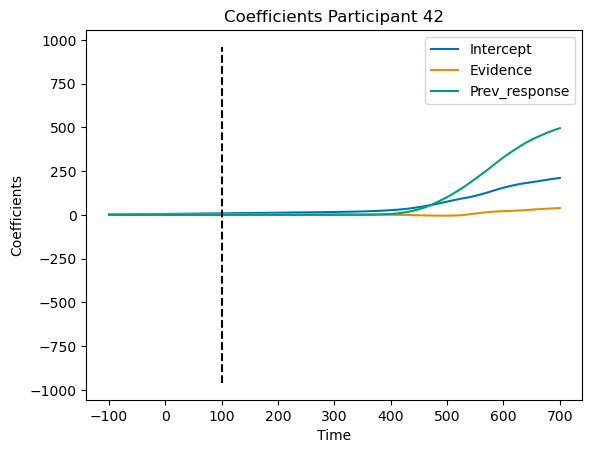

Participant 43, Iteration 1
Participant 43, Iteration 2
Participant 43, Iteration 3
Participant 43, Iteration 4
Participant 43, Iteration 5
Participant 43, Iteration 6
Participant 43, Iteration 7
Participant 43, Iteration 8
Participant 43, Iteration 9
Participant 43, Iteration 10
Participant 43, Iteration 11
Participant 43, Iteration 12
Participant 43, Iteration 13
Participant 43, Iteration 14
Participant 43, Iteration 15
Participant 43, Iteration 16
Participant 43, Iteration 17
Participant 43, Iteration 18
Participant 43, Iteration 19
Participant 43, Iteration 20
Participant 43, Iteration 21
Participant 43, Iteration 22
Participant 43, Iteration 23
Participant 43, Iteration 24
Participant 43, Iteration 25
Participant 43, Iteration 26
Participant 43, Iteration 27
Participant 43, Iteration 28
Participant 43, Iteration 29
Participant 43, Iteration 30
Participant 43, Iteration 31
Participant 43, Iteration 32
Participant 43, Iteration 33
Participant 43, Iteration 34
Participant 43, Iterati

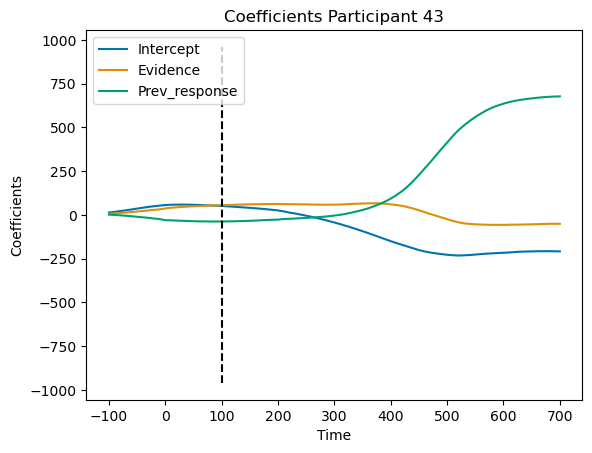

Participant 45, Iteration 1
Participant 45, Iteration 2
Participant 45, Iteration 3
Participant 45, Iteration 4
Participant 45, Iteration 5
Participant 45, Iteration 6
Participant 45, Iteration 7
Participant 45, Iteration 8
Participant 45, Iteration 9
Participant 45, Iteration 10
Participant 45, Iteration 11
Participant 45, Iteration 12
Participant 45, Iteration 13
Participant 45, Iteration 14
Participant 45, Iteration 15
Participant 45, Iteration 16
Participant 45, Iteration 17
Participant 45, Iteration 18
Participant 45, Iteration 19
Participant 45, Iteration 20
Participant 45, Iteration 21
Participant 45, Iteration 22
Participant 45, Iteration 23
Participant 45, Iteration 24
Participant 45, Iteration 25
Participant 45, Iteration 26
Participant 45, Iteration 27
Participant 45, Iteration 28
Participant 45, Iteration 29
Participant 45, Iteration 30
Participant 45, Iteration 31
Participant 45, Iteration 32
Participant 45, Iteration 33
Participant 45, Iteration 34
Participant 45, Iterati

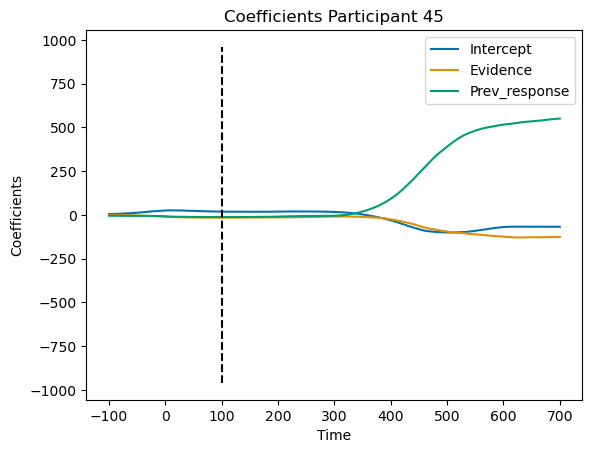

Participant 46, Iteration 1
Participant 46, Iteration 2
Participant 46, Iteration 3
Participant 46, Iteration 4
Participant 46, Iteration 5
Participant 46, Iteration 6
Participant 46, Iteration 7
Participant 46, Iteration 8
Participant 46, Iteration 9
Participant 46, Iteration 10
Participant 46, Iteration 11
Participant 46, Iteration 12
Participant 46, Iteration 13
Participant 46, Iteration 14
Participant 46, Iteration 15
Participant 46, Iteration 16
Participant 46, Iteration 17
Participant 46, Iteration 18
Participant 46, Iteration 19
Participant 46, Iteration 20
Participant 46, Iteration 21
Participant 46, Iteration 22
Participant 46, Iteration 23
Participant 46, Iteration 24
Participant 46, Iteration 25
Participant 46, Iteration 26
Participant 46, Iteration 27
Participant 46, Iteration 28
Participant 46, Iteration 29
Participant 46, Iteration 30
Participant 46, Iteration 31
Participant 46, Iteration 32
Participant 46, Iteration 33
Participant 46, Iteration 34
Participant 46, Iterati

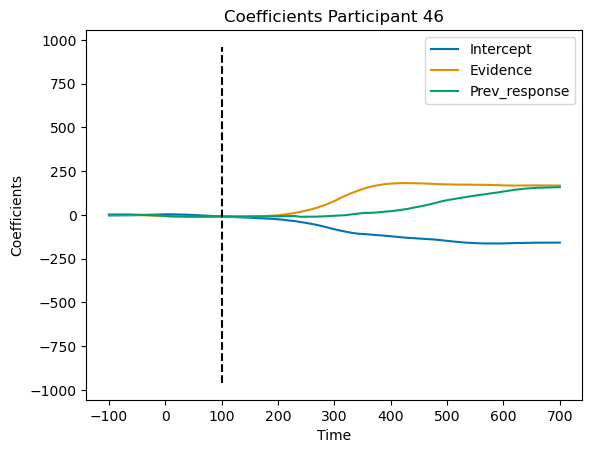

Participant 47, Iteration 1
Participant 47, Iteration 2
Participant 47, Iteration 3
Participant 47, Iteration 4
Participant 47, Iteration 5
Participant 47, Iteration 6
Participant 47, Iteration 7
Participant 47, Iteration 8
Participant 47, Iteration 9
Participant 47, Iteration 10
Participant 47, Iteration 11
Participant 47, Iteration 12
Participant 47, Iteration 13
Participant 47, Iteration 14
Participant 47, Iteration 15
Participant 47, Iteration 16
Participant 47, Iteration 17
Participant 47, Iteration 18
Participant 47, Iteration 19
Participant 47, Iteration 20
Participant 47, Iteration 21
Participant 47, Iteration 22
Participant 47, Iteration 23
Participant 47, Iteration 24
Participant 47, Iteration 25
Participant 47, Iteration 26
Participant 47, Iteration 27
Participant 47, Iteration 28
Participant 47, Iteration 29
Participant 47, Iteration 30
Participant 47, Iteration 31
Participant 47, Iteration 32
Participant 47, Iteration 33
Participant 47, Iteration 34
Participant 47, Iterati

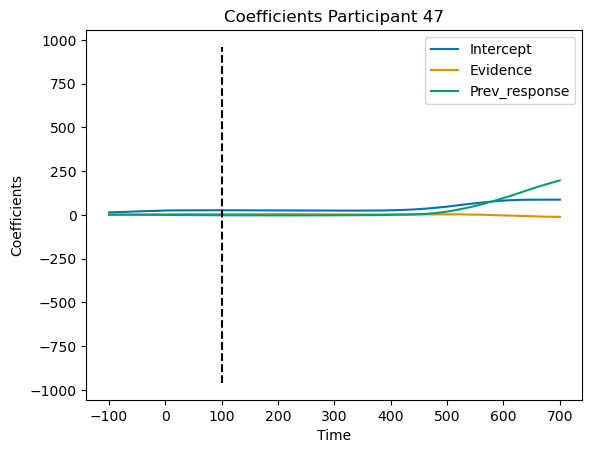

Participant 48, Iteration 1
Participant 48, Iteration 2
Participant 48, Iteration 3
Participant 48, Iteration 4
Participant 48, Iteration 5
Participant 48, Iteration 6
Participant 48, Iteration 7
Participant 48, Iteration 8
Participant 48, Iteration 9
Participant 48, Iteration 10
Participant 48, Iteration 11
Participant 48, Iteration 12
Participant 48, Iteration 13
Participant 48, Iteration 14
Participant 48, Iteration 15
Participant 48, Iteration 16
Participant 48, Iteration 17
Participant 48, Iteration 18
Participant 48, Iteration 19
Participant 48, Iteration 20
Participant 48, Iteration 21
Participant 48, Iteration 22
Participant 48, Iteration 23
Participant 48, Iteration 24
Participant 48, Iteration 25
Participant 48, Iteration 26
Participant 48, Iteration 27
Participant 48, Iteration 28
Participant 48, Iteration 29
Participant 48, Iteration 30
Participant 48, Iteration 31
Participant 48, Iteration 32
Participant 48, Iteration 33
Participant 48, Iteration 34
Participant 48, Iterati

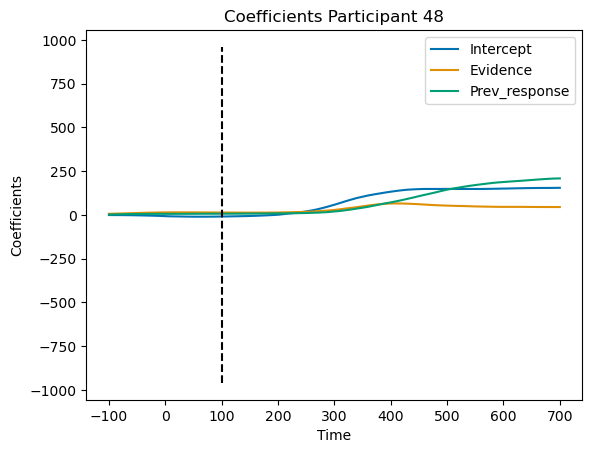

Participant 49, Iteration 1
Participant 49, Iteration 2
Participant 49, Iteration 3
Participant 49, Iteration 4
Participant 49, Iteration 5
Participant 49, Iteration 6
Participant 49, Iteration 7
Participant 49, Iteration 8
Participant 49, Iteration 9
Participant 49, Iteration 10
Participant 49, Iteration 11
Participant 49, Iteration 12
Participant 49, Iteration 13
Participant 49, Iteration 14
Participant 49, Iteration 15
Participant 49, Iteration 16
Participant 49, Iteration 17
Participant 49, Iteration 18
Participant 49, Iteration 19
Participant 49, Iteration 20
Participant 49, Iteration 21
Participant 49, Iteration 22
Participant 49, Iteration 23
Participant 49, Iteration 24
Participant 49, Iteration 25
Participant 49, Iteration 26
Participant 49, Iteration 27
Participant 49, Iteration 28
Participant 49, Iteration 29
Participant 49, Iteration 30
Participant 49, Iteration 31
Participant 49, Iteration 32
Participant 49, Iteration 33
Participant 49, Iteration 34
Participant 49, Iterati

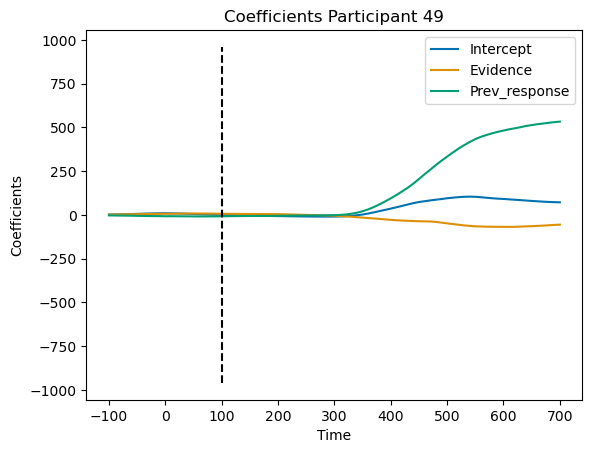

Participant 4, Iteration 1
Participant 4, Iteration 2
Participant 4, Iteration 3
Participant 4, Iteration 4
Participant 4, Iteration 5
Participant 4, Iteration 6
Participant 4, Iteration 7
Participant 4, Iteration 8
Participant 4, Iteration 9
Participant 4, Iteration 10
Participant 4, Iteration 11
Participant 4, Iteration 12
Participant 4, Iteration 13
Participant 4, Iteration 14
Participant 4, Iteration 15
Participant 4, Iteration 16
Participant 4, Iteration 17
Participant 4, Iteration 18
Participant 4, Iteration 19
Participant 4, Iteration 20
Participant 4, Iteration 21
Participant 4, Iteration 22
Participant 4, Iteration 23
Participant 4, Iteration 24
Participant 4, Iteration 25
Participant 4, Iteration 26
Participant 4, Iteration 27
Participant 4, Iteration 28
Participant 4, Iteration 29
Participant 4, Iteration 30
Participant 4, Iteration 31
Participant 4, Iteration 32
Participant 4, Iteration 33
Participant 4, Iteration 34
Participant 4, Iteration 35
Participant 4, Iteration 36
P

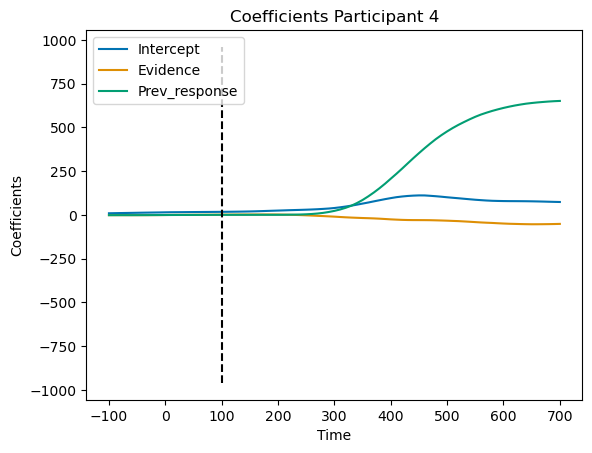

Participant 50, Iteration 1
Participant 50, Iteration 2
Participant 50, Iteration 3
Participant 50, Iteration 4
Participant 50, Iteration 5
Participant 50, Iteration 6
Participant 50, Iteration 7
Participant 50, Iteration 8
Participant 50, Iteration 9
Participant 50, Iteration 10
Participant 50, Iteration 11
Participant 50, Iteration 12
Participant 50, Iteration 13
Participant 50, Iteration 14
Participant 50, Iteration 15
Participant 50, Iteration 16
Participant 50, Iteration 17
Participant 50, Iteration 18
Participant 50, Iteration 19
Participant 50, Iteration 20
Participant 50, Iteration 21
Participant 50, Iteration 22
Participant 50, Iteration 23
Participant 50, Iteration 24
Participant 50, Iteration 25
Participant 50, Iteration 26
Participant 50, Iteration 27
Participant 50, Iteration 28
Participant 50, Iteration 29
Participant 50, Iteration 30
Participant 50, Iteration 31
Participant 50, Iteration 32
Participant 50, Iteration 33
Participant 50, Iteration 34
Participant 50, Iterati

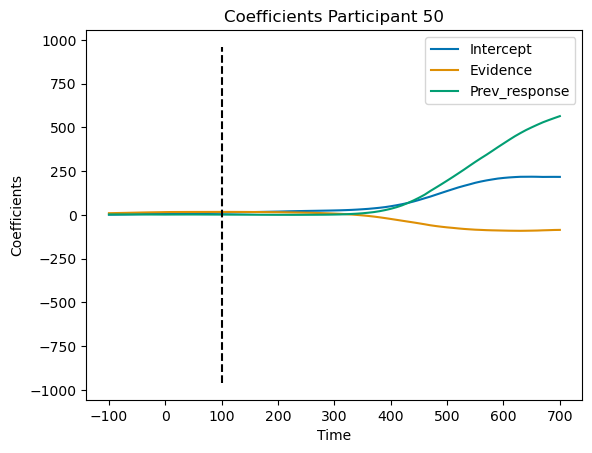

Participant 52, Iteration 1
Participant 52, Iteration 2
Participant 52, Iteration 3
Participant 52, Iteration 4
Participant 52, Iteration 5
Participant 52, Iteration 6
Participant 52, Iteration 7
Participant 52, Iteration 8
Participant 52, Iteration 9
Participant 52, Iteration 10
Participant 52, Iteration 11
Participant 52, Iteration 12
Participant 52, Iteration 13
Participant 52, Iteration 14
Participant 52, Iteration 15
Participant 52, Iteration 16
Participant 52, Iteration 17
Participant 52, Iteration 18
Participant 52, Iteration 19
Participant 52, Iteration 20
Participant 52, Iteration 21
Participant 52, Iteration 22
Participant 52, Iteration 23
Participant 52, Iteration 24
Participant 52, Iteration 25
Participant 52, Iteration 26
Participant 52, Iteration 27
Participant 52, Iteration 28
Participant 52, Iteration 29
Participant 52, Iteration 30
Participant 52, Iteration 31
Participant 52, Iteration 32
Participant 52, Iteration 33
Participant 52, Iteration 34
Participant 52, Iterati

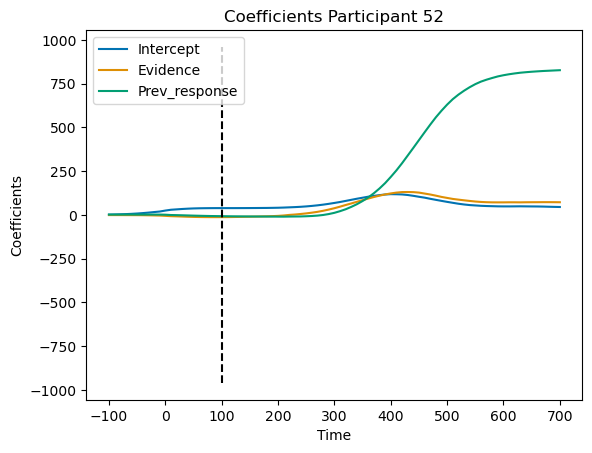

Participant 53, Iteration 1
Participant 53, Iteration 2
Participant 53, Iteration 3
Participant 53, Iteration 4
Participant 53, Iteration 5
Participant 53, Iteration 6
Participant 53, Iteration 7
Participant 53, Iteration 8
Participant 53, Iteration 9
Participant 53, Iteration 10
Participant 53, Iteration 11
Participant 53, Iteration 12
Participant 53, Iteration 13
Participant 53, Iteration 14
Participant 53, Iteration 15
Participant 53, Iteration 16
Participant 53, Iteration 17
Participant 53, Iteration 18
Participant 53, Iteration 19
Participant 53, Iteration 20
Participant 53, Iteration 21
Participant 53, Iteration 22
Participant 53, Iteration 23
Participant 53, Iteration 24
Participant 53, Iteration 25
Participant 53, Iteration 26
Participant 53, Iteration 27
Participant 53, Iteration 28
Participant 53, Iteration 29
Participant 53, Iteration 30
Participant 53, Iteration 31
Participant 53, Iteration 32
Participant 53, Iteration 33
Participant 53, Iteration 34
Participant 53, Iterati

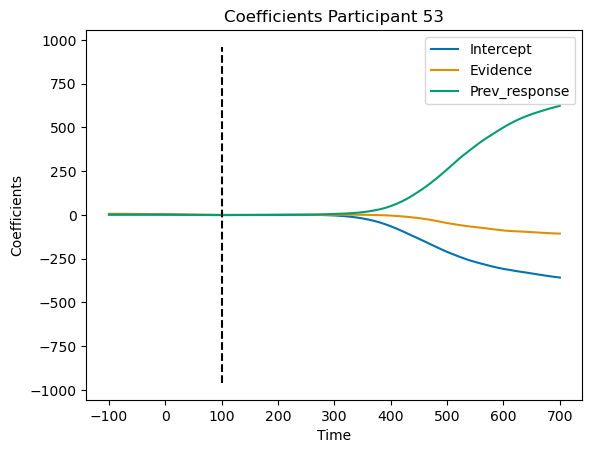

Participant 54, Iteration 1
Participant 54, Iteration 2
Participant 54, Iteration 3
Participant 54, Iteration 4
Participant 54, Iteration 5
Participant 54, Iteration 6
Participant 54, Iteration 7
Participant 54, Iteration 8
Participant 54, Iteration 9
Participant 54, Iteration 10
Participant 54, Iteration 11
Participant 54, Iteration 12
Participant 54, Iteration 13
Participant 54, Iteration 14
Participant 54, Iteration 15
Participant 54, Iteration 16
Participant 54, Iteration 17
Participant 54, Iteration 18
Participant 54, Iteration 19
Participant 54, Iteration 20
Participant 54, Iteration 21
Participant 54, Iteration 22
Participant 54, Iteration 23
Participant 54, Iteration 24
Participant 54, Iteration 25
Participant 54, Iteration 26
Participant 54, Iteration 27
Participant 54, Iteration 28
Participant 54, Iteration 29
Participant 54, Iteration 30
Participant 54, Iteration 31
Participant 54, Iteration 32
Participant 54, Iteration 33
Participant 54, Iteration 34
Participant 54, Iterati

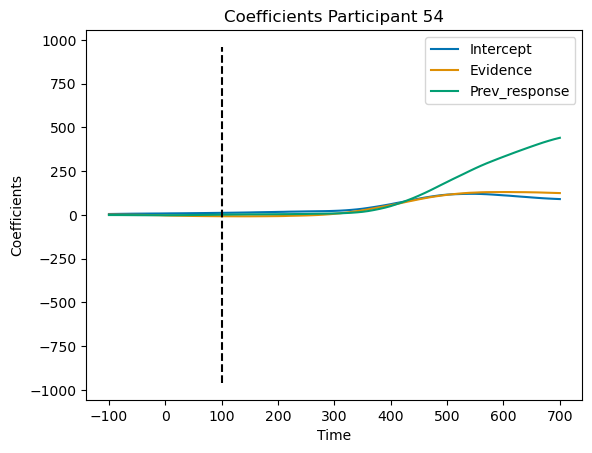

Participant 55, Iteration 1
Participant 55, Iteration 2
Participant 55, Iteration 3
Participant 55, Iteration 4
Participant 55, Iteration 5
Participant 55, Iteration 6
Participant 55, Iteration 7
Participant 55, Iteration 8
Participant 55, Iteration 9
Participant 55, Iteration 10
Participant 55, Iteration 11
Participant 55, Iteration 12
Participant 55, Iteration 13
Participant 55, Iteration 14
Participant 55, Iteration 15
Participant 55, Iteration 16
Participant 55, Iteration 17
Participant 55, Iteration 18
Participant 55, Iteration 19
Participant 55, Iteration 20
Participant 55, Iteration 21
Participant 55, Iteration 22
Participant 55, Iteration 23
Participant 55, Iteration 24
Participant 55, Iteration 25
Participant 55, Iteration 26
Participant 55, Iteration 27
Participant 55, Iteration 28
Participant 55, Iteration 29
Participant 55, Iteration 30
Participant 55, Iteration 31
Participant 55, Iteration 32
Participant 55, Iteration 33
Participant 55, Iteration 34
Participant 55, Iterati

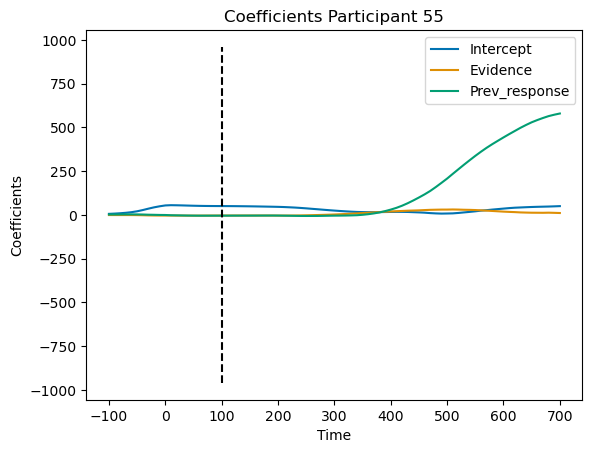

Participant 56, Iteration 1
Participant 56, Iteration 2
Participant 56, Iteration 3
Participant 56, Iteration 4
Participant 56, Iteration 5
Participant 56, Iteration 6
Participant 56, Iteration 7
Participant 56, Iteration 8
Participant 56, Iteration 9
Participant 56, Iteration 10
Participant 56, Iteration 11
Participant 56, Iteration 12
Participant 56, Iteration 13
Participant 56, Iteration 14
Participant 56, Iteration 15
Participant 56, Iteration 16
Participant 56, Iteration 17
Participant 56, Iteration 18
Participant 56, Iteration 19
Participant 56, Iteration 20
Participant 56, Iteration 21
Participant 56, Iteration 22
Participant 56, Iteration 23
Participant 56, Iteration 24
Participant 56, Iteration 25
Participant 56, Iteration 26
Participant 56, Iteration 27
Participant 56, Iteration 28
Participant 56, Iteration 29
Participant 56, Iteration 30
Participant 56, Iteration 31
Participant 56, Iteration 32
Participant 56, Iteration 33
Participant 56, Iteration 34
Participant 56, Iterati

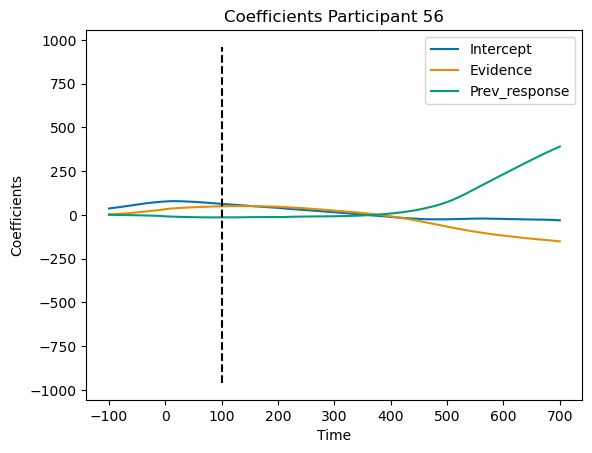

Participant 57, Iteration 1
Participant 57, Iteration 2
Participant 57, Iteration 3
Participant 57, Iteration 4
Participant 57, Iteration 5
Participant 57, Iteration 6
Participant 57, Iteration 7
Participant 57, Iteration 8
Participant 57, Iteration 9
Participant 57, Iteration 10
Participant 57, Iteration 11
Participant 57, Iteration 12
Participant 57, Iteration 13
Participant 57, Iteration 14
Participant 57, Iteration 15
Participant 57, Iteration 16
Participant 57, Iteration 17
Participant 57, Iteration 18
Participant 57, Iteration 19
Participant 57, Iteration 20
Participant 57, Iteration 21
Participant 57, Iteration 22
Participant 57, Iteration 23
Participant 57, Iteration 24
Participant 57, Iteration 25
Participant 57, Iteration 26
Participant 57, Iteration 27
Participant 57, Iteration 28
Participant 57, Iteration 29
Participant 57, Iteration 30
Participant 57, Iteration 31
Participant 57, Iteration 32
Participant 57, Iteration 33
Participant 57, Iteration 34
Participant 57, Iterati

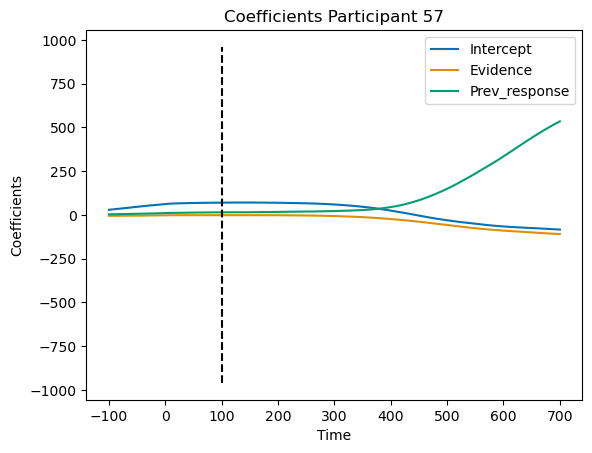

Participant 58, Iteration 1
Participant 58, Iteration 2
Participant 58, Iteration 3
Participant 58, Iteration 4
Participant 58, Iteration 5
Participant 58, Iteration 6
Participant 58, Iteration 7
Participant 58, Iteration 8
Participant 58, Iteration 9
Participant 58, Iteration 10
Participant 58, Iteration 11
Participant 58, Iteration 12
Participant 58, Iteration 13
Participant 58, Iteration 14
Participant 58, Iteration 15
Participant 58, Iteration 16
Participant 58, Iteration 17
Participant 58, Iteration 18
Participant 58, Iteration 19
Participant 58, Iteration 20
Participant 58, Iteration 21
Participant 58, Iteration 22
Participant 58, Iteration 23
Participant 58, Iteration 24
Participant 58, Iteration 25
Participant 58, Iteration 26
Participant 58, Iteration 27
Participant 58, Iteration 28
Participant 58, Iteration 29
Participant 58, Iteration 30
Participant 58, Iteration 31
Participant 58, Iteration 32
Participant 58, Iteration 33
Participant 58, Iteration 34
Participant 58, Iterati

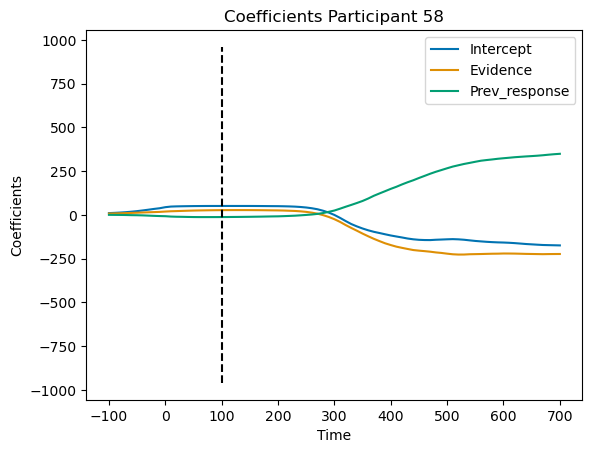

Participant 6, Iteration 1
Participant 6, Iteration 2
Participant 6, Iteration 3
Participant 6, Iteration 4
Participant 6, Iteration 5
Participant 6, Iteration 6
Participant 6, Iteration 7
Participant 6, Iteration 8
Participant 6, Iteration 9
Participant 6, Iteration 10
Participant 6, Iteration 11
Participant 6, Iteration 12
Participant 6, Iteration 13
Participant 6, Iteration 14
Participant 6, Iteration 15
Participant 6, Iteration 16
Participant 6, Iteration 17
Participant 6, Iteration 18
Participant 6, Iteration 19
Participant 6, Iteration 20
Participant 6, Iteration 21
Participant 6, Iteration 22
Participant 6, Iteration 23
Participant 6, Iteration 24
Participant 6, Iteration 25
Participant 6, Iteration 26
Participant 6, Iteration 27
Participant 6, Iteration 28
Participant 6, Iteration 29
Participant 6, Iteration 30
Participant 6, Iteration 31
Participant 6, Iteration 32
Participant 6, Iteration 33
Participant 6, Iteration 34
Participant 6, Iteration 35
Participant 6, Iteration 36
P

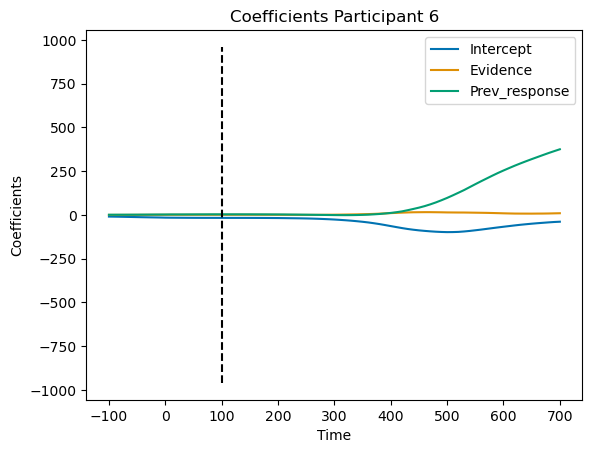

Participant 7, Iteration 1
Participant 7, Iteration 2
Participant 7, Iteration 3
Participant 7, Iteration 4
Participant 7, Iteration 5
Participant 7, Iteration 6
Participant 7, Iteration 7
Participant 7, Iteration 8
Participant 7, Iteration 9
Participant 7, Iteration 10
Participant 7, Iteration 11
Participant 7, Iteration 12
Participant 7, Iteration 13
Participant 7, Iteration 14
Participant 7, Iteration 15
Participant 7, Iteration 16
Participant 7, Iteration 17
Participant 7, Iteration 18
Participant 7, Iteration 19
Participant 7, Iteration 20
Participant 7, Iteration 21
Participant 7, Iteration 22
Participant 7, Iteration 23
Participant 7, Iteration 24
Participant 7, Iteration 25
Participant 7, Iteration 26
Participant 7, Iteration 27
Participant 7, Iteration 28
Participant 7, Iteration 29
Participant 7, Iteration 30
Participant 7, Iteration 31
Participant 7, Iteration 32
Participant 7, Iteration 33
Participant 7, Iteration 34
Participant 7, Iteration 35
Participant 7, Iteration 36
P

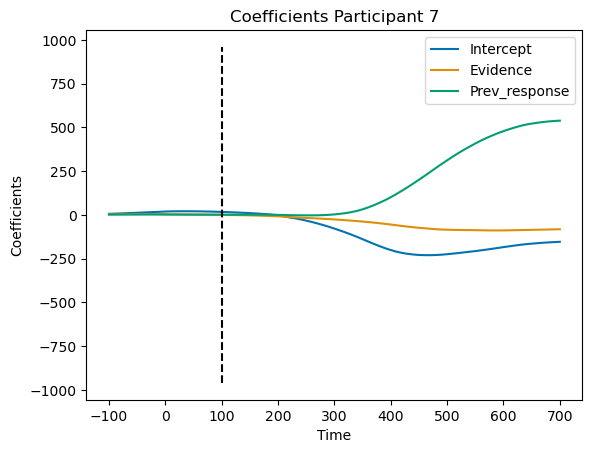

Participant 8, Iteration 1
Participant 8, Iteration 2
Participant 8, Iteration 3
Participant 8, Iteration 4
Participant 8, Iteration 5
Participant 8, Iteration 6
Participant 8, Iteration 7
Participant 8, Iteration 8
Participant 8, Iteration 9
Participant 8, Iteration 10
Participant 8, Iteration 11
Participant 8, Iteration 12
Participant 8, Iteration 13
Participant 8, Iteration 14
Participant 8, Iteration 15
Participant 8, Iteration 16
Participant 8, Iteration 17
Participant 8, Iteration 18
Participant 8, Iteration 19
Participant 8, Iteration 20
Participant 8, Iteration 21
Participant 8, Iteration 22
Participant 8, Iteration 23
Participant 8, Iteration 24
Participant 8, Iteration 25
Participant 8, Iteration 26
Participant 8, Iteration 27
Participant 8, Iteration 28
Participant 8, Iteration 29
Participant 8, Iteration 30
Participant 8, Iteration 31
Participant 8, Iteration 32
Participant 8, Iteration 33
Participant 8, Iteration 34
Participant 8, Iteration 35
Participant 8, Iteration 36
P

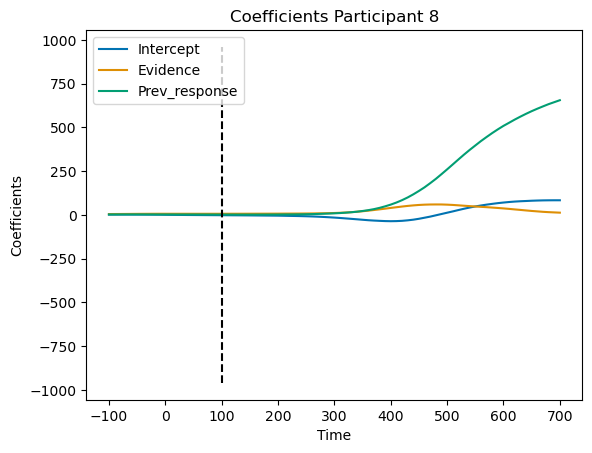

Participant 9, Iteration 1
Participant 9, Iteration 2
Participant 9, Iteration 3
Participant 9, Iteration 4
Participant 9, Iteration 5
Participant 9, Iteration 6
Participant 9, Iteration 7
Participant 9, Iteration 8
Participant 9, Iteration 9
Participant 9, Iteration 10
Participant 9, Iteration 11
Participant 9, Iteration 12
Participant 9, Iteration 13
Participant 9, Iteration 14
Participant 9, Iteration 15
Participant 9, Iteration 16
Participant 9, Iteration 17
Participant 9, Iteration 18
Participant 9, Iteration 19
Participant 9, Iteration 20
Participant 9, Iteration 21
Participant 9, Iteration 22
Participant 9, Iteration 23
Participant 9, Iteration 24
Participant 9, Iteration 25
Participant 9, Iteration 26
Participant 9, Iteration 27
Participant 9, Iteration 28
Participant 9, Iteration 29
Participant 9, Iteration 30
Participant 9, Iteration 31
Participant 9, Iteration 32
Participant 9, Iteration 33
Participant 9, Iteration 34
Participant 9, Iteration 35
Participant 9, Iteration 36
P

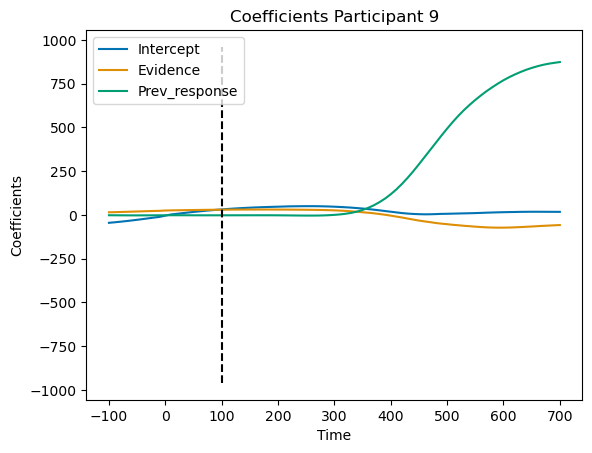

In [ ]:
######################################
#Previous Response
######################################
time = list(range(-100, 71 * 10, 10))
#df_lm = df[df['true_value'] != 'Control']
df_lm = df[df['previous_response'] != 'NAN']
df_lm['previous_response'] = df_lm['previous_response'].apply(lambda x: 1 if x == 'Red' else - 1)
# Get the unique participant numbers
participants = df_lm['pt_num'].unique()
all_coefs = []
# Iterate over each participant
for participant in participants:
    # Filter the dataframe for the current participant
    df_lm_participant = df_lm[df_lm['pt_num'] == participant]
    # One-hot encode the categorical predictor 'true_value'
    #df_encoded_participant = pd.get_dummies(df_lm_participant, columns=['previous_response'])
    df_encoded_participant = df_lm_participant
    

    # Drop rows with missing values
    df_cleaned_participant = df_encoded_participant.dropna()

    coefs = []
    for i in range(0, 81):
        # Extract the dependent variable
        first_values = df_cleaned_participant['x_values'].apply(lambda x: x[i])
        y = np.array(first_values).astype(int)

        # Extract the independent variables
        X_categorical = df_cleaned_participant[['previous_response']].values
        
        X_numerical = df_cleaned_participant['muval_rescaled'].values.reshape(-1, 1)
        #X_numerical = np.abs(X_numerical)

        # Add interaction term
        #interaction_term = X_categorical * X_numerical

        # Concatenate predictors and interaction term
        X = np.concatenate((X_categorical, X_numerical), axis=1)

        # Add constant term for intercept
        X = sm.add_constant(X)

        # Perform linear regression
        model = sm.OLS(y, X).fit()

        # Append coefficients to the list
        coefs.append((model.params[0], model.params[1], model.params[2]))

        # Print the summary of the regression results
        print(f"Participant {participant}, Iteration {i+1}")
        #print(model.summary())
    plt.plot(time, coefs)
    plt.xlabel('Time')
    plt.ylabel('Coefficients')
    plt.title(f'Coefficients ' + f'Participant {participant}')
    plt.vlines(100, -960, 960, colors='black', linestyles='dashed')
    plt.legend(['Intercept', 'Evidence', 'Prev_response'])
    plt.show()
    all_coefs.append(coefs)


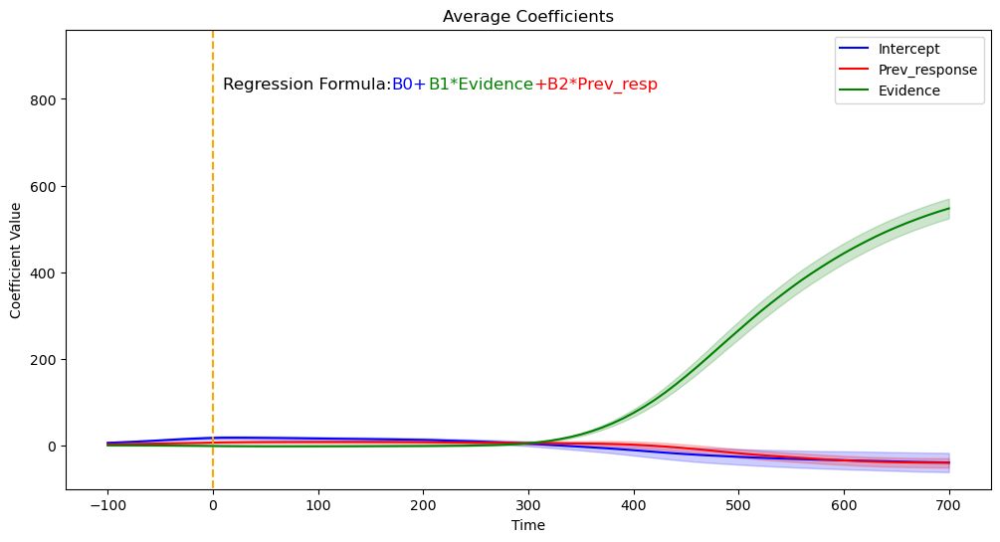

In [ ]:

### Plottting the average coefficients

# Convert the list of coefficients to a numpy array
all_coefs_array = np.array(all_coefs)

# Calculate the average of each coefficient across all samples
average_coefs = np.mean(all_coefs_array, axis=0)

# Extract the x, y, and z values of the coefficients
x_coefs = average_coefs[:, 0]
y_coefs = average_coefs[:, 1]
z_coefs = average_coefs[:, 2]

# Calculate the standard error of each coefficient across all samples
std_coefs = np.std(all_coefs_array, axis=0, ddof=1) / np.sqrt(all_coefs_array.shape[0])

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the average coefficients with error bars
plt.plot(time, x_coefs, label='Intercept', color='blue')
plt.plot(time, y_coefs, label='Prev_response', color='red')
plt.plot(time, z_coefs, label='Evidence', color='green')
plt.fill_between(time, x_coefs - std_coefs[:, 0], x_coefs + std_coefs[:, 0], alpha=0.2, color='blue')
plt.fill_between(time, y_coefs - std_coefs[:, 1], y_coefs + std_coefs[:, 1], alpha=0.2, color='red')
plt.fill_between(time, z_coefs - std_coefs[:, 2], z_coefs + std_coefs[:, 2], alpha=0.2, color='green')

# Add the regression formula as text
plt.text(10, 850, 'Regression Formula:', color='black', fontsize=12, verticalalignment='top')
#plt.text(180, 800, 'y ~ B0 + B1*Evidence + B2*Prev_resp', color='red', fontsize=12, verticalalignment='top')
plt.text(170, 850, 'B0+', color='blue', fontsize=12, verticalalignment='top')
plt.text(205, 850, 'B1*Evidence', color='green', fontsize=12, verticalalignment='top')
plt.text(305, 850, '+B2*Prev_resp', color='red', fontsize=12, verticalalignment='top')
plt.xlabel('Time')
plt.ylabel('Coefficient Value')
plt.title('Average Coefficients')
plt.xticks(np.arange(-100, 710, 100))
plt.ylim(-100, 960)
plt.vlines(0, -960, 960, colors='orange', linestyles='dashed')

plt.legend()
plt.show()


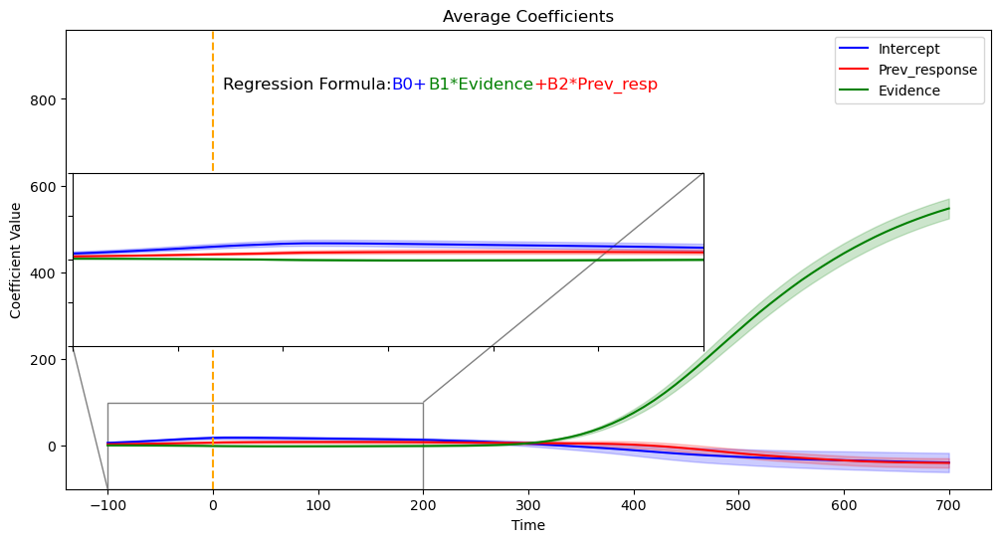

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
import mplcursors



# Convert the list of coefficients to a numpy array
all_coefs_array = np.array(all_coefs)

# Calculate the average of each coefficient across all samples
average_coefs = np.mean(all_coefs_array, axis=0)

# Extract the x, y, and z values of the coefficients
x_coefs = average_coefs[:, 0]
y_coefs = average_coefs[:, 1]
z_coefs = average_coefs[:, 2]

# Calculate the standard error of each coefficient across all samples
std_coefs = np.std(all_coefs_array, axis=0, ddof=1) / np.sqrt(all_coefs_array.shape[0])

# Set the figure size
fig, ax = plt.subplots(figsize=(12, 6))

# Plot the average coefficients with error bars
ax.plot(time, x_coefs, label='Intercept', color='blue')
ax.plot(time, y_coefs, label='Prev_response', color='red')
ax.plot(time, z_coefs, label='Evidence', color='green')
ax.fill_between(time, x_coefs - std_coefs[:, 0], x_coefs + std_coefs[:, 0], alpha=0.2, color='blue')
ax.fill_between(time, y_coefs - std_coefs[:, 1], y_coefs + std_coefs[:, 1], alpha=0.2, color='red')
ax.fill_between(time, z_coefs - std_coefs[:, 2], z_coefs + std_coefs[:, 2], alpha=0.2, color='green')

# Add the regression formula as text
ax.text(10, 850, 'Regression Formula:', color='black', fontsize=12, verticalalignment='top')
ax.text(170, 850, 'B0+', color='blue', fontsize=12, verticalalignment='top')
ax.text(205, 850, 'B1*Evidence', color='green', fontsize=12, verticalalignment='top')
ax.text(305, 850, '+B2*Prev_resp', color='red', fontsize=12, verticalalignment='top')

ax.set_xlabel('Time')
ax.set_ylabel('Coefficient Value')
ax.set_title('Average Coefficients')
ax.set_xticks(np.arange(-100, 710, 100))
ax.set_ylim(-100, 960)
ax.axvline(0, color='orange', linestyle='dashed')

ax.legend()

# Add interactive data cursors
mplcursors.cursor(hover=True)

# Add zoomed inset axes
axins = zoomed_inset_axes(ax, zoom=2, loc='center left')  # zoom=2 means zoom in 2 times
axins.plot(time, x_coefs, label='Intercept', color='blue')
axins.plot(time, y_coefs, label='Prev_response', color='red')
axins.plot(time, z_coefs, label='Evidence', color='green')
axins.fill_between(time, x_coefs - std_coefs[:, 0], x_coefs + std_coefs[:, 0], alpha=0.2, color='blue')
axins.fill_between(time, y_coefs - std_coefs[:, 1], y_coefs + std_coefs[:, 1], alpha=0.2, color='red')
axins.fill_between(time, z_coefs - std_coefs[:, 2], z_coefs + std_coefs[:, 2], alpha=0.2, color='green')

x1, x2, y1, y2 = -100, 200, -100, 100  # specify the limits of the zoomed region
axins.set_xlim(x1, x2)  # apply the x-limits to the zoomed inset axes
axins.set_ylim(y1, y2)  # apply the y-limits to the zoomed inset axes
plt.xticks(visible=False)
plt.yticks(visible=False)

mark_inset(ax, axins, loc1=1, loc2=3, fc="none", ec="0.5")  # draw a rectangle around the zoomed region

plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from ipywidgets import interactive

# Convert the list of coefficients to a numpy array
all_coefs_array = np.array(all_coefs)

# Calculate the average of each coefficient across all samples
average_coefs = np.mean(all_coefs_array, axis=0)

# Extract the x, y, and z values of the coefficients
x_coefs = average_coefs[:, 0]
y_coefs = average_coefs[:, 1]
z_coefs = average_coefs[:, 2]

# Calculate the standard error of each coefficient across all samples
std_coefs = np.std(all_coefs_array, axis=0, ddof=1) / np.sqrt(all_coefs_array.shape[0])

def plot_zoom(factor):
    plt.figure(figsize=(12, 6))
    plt.plot(time, x_coefs, label='Intercept', color='blue')
    plt.plot(time, y_coefs, label='Prev_response', color='red')
    plt.plot(time, z_coefs, label='Evidence', color='green')
    plt.fill_between(time, x_coefs - std_coefs[:, 0], x_coefs + std_coefs[:, 0], alpha=0.2, color='blue')
    plt.fill_between(time, y_coefs - std_coefs[:, 1], y_coefs + std_coefs[:, 1], alpha=0.2, color='red')
    plt.fill_between(time, z_coefs - std_coefs[:, 2], z_coefs + std_coefs[:, 2], alpha=0.2, color='green')
    plt.xlabel('Time')
    plt.ylabel('Coefficient Value')
    plt.title('Average Coefficients')
    # Add the regression formula as text
    #plt.text(10, 850, 'Regression Formula:', color='black', fontsize=12, verticalalignment='bottom')
    #plt.text(170, 850, 'B0+', color='blue', fontsize=12, verticalalignment='bottom')
    #plt.text(205, 850, 'B1*Evidence', color='green', fontsize=12, verticalalignment='bottom')
    #plt.text(305, 850, '+B2*Prev_resp', color='red', fontsize=12, verticalalignment='bottom')
    #plt.xticks(np.arange(-100, 710, 100))
    plt.ylim(-100, 960)
    plt.vlines(0, -960, 960, colors='orange', linestyles='dashed')
    plt.legend()
    plt.xlim(min(time), max(time))  # Use min() and max() to find the limits
    plt.ylim(-100, x_coefs.max() + factor)
    plt.show()

interactive_plot = interactive(plot_zoom, factor=(0, 960, 20))
interactive_plot


interactive(children=(IntSlider(value=480, description='factor', max=960, step=20), Output()), _dom_classes=('…

### Finding previous Evidence

Participant 10, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                 -0.002
Method:                 Least Squares   F-statistic:                    0.4746
Date:                Tue, 19 Mar 2024   Prob (F-statistic):              0.700
Time:                        12:27:38   Log-Likelihood:                -3811.0
No. Observations:                 826   AIC:                             7630.
Df Residuals:                     822   BIC:                             7649.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          3.3304   

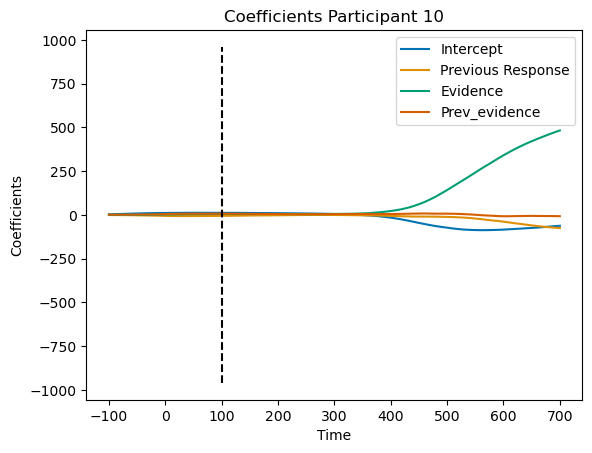

Participant 11, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.005
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     1.553
Date:                Tue, 19 Mar 2024   Prob (F-statistic):              0.199
Time:                        12:27:39   Log-Likelihood:                -4476.1
No. Observations:                 849   AIC:                             8960.
Df Residuals:                     845   BIC:                             8979.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         29.1351   

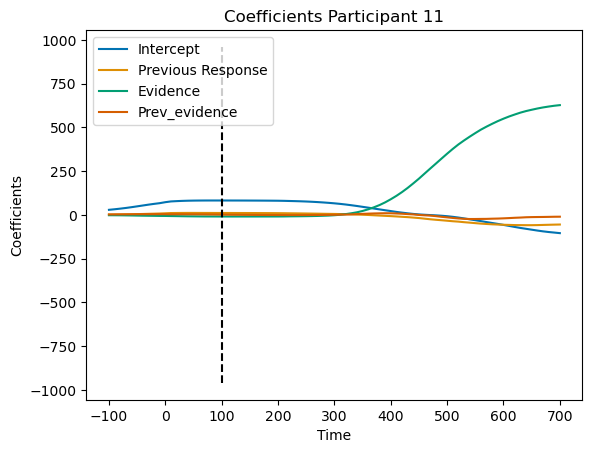

Participant 12, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.019
Model:                            OLS   Adj. R-squared:                  0.016
Method:                 Least Squares   F-statistic:                     5.661
Date:                Tue, 19 Mar 2024   Prob (F-statistic):           0.000767
Time:                        12:27:40   Log-Likelihood:                -4374.2
No. Observations:                 858   AIC:                             8756.
Df Residuals:                     854   BIC:                             8775.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         21.7446   

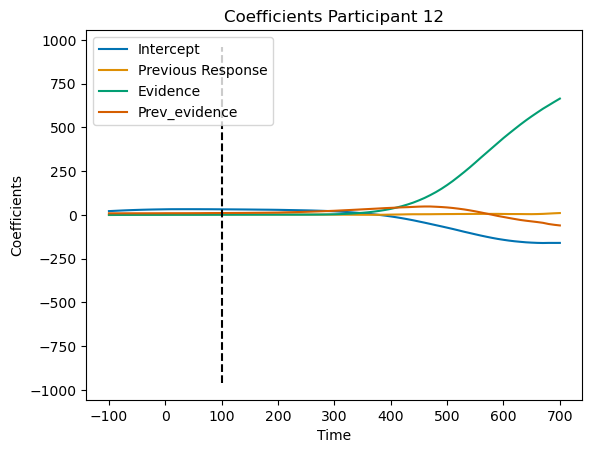

Participant 13, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.002
Method:                 Least Squares   F-statistic:                    0.3271
Date:                Tue, 19 Mar 2024   Prob (F-statistic):              0.806
Time:                        12:27:41   Log-Likelihood:                -4097.8
No. Observations:                 904   AIC:                             8204.
Df Residuals:                     900   BIC:                             8223.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          5.1179   

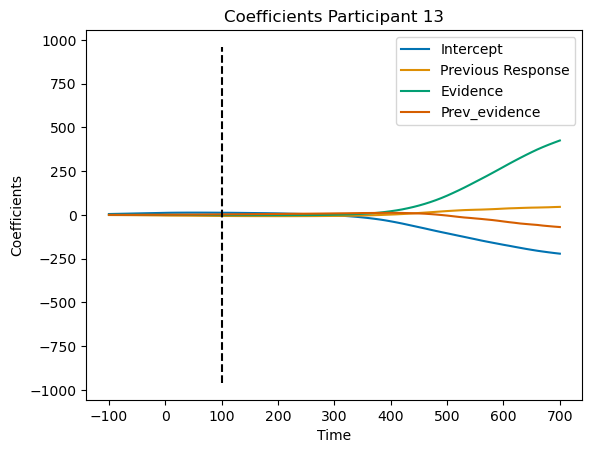

Participant 14, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.009
Model:                            OLS   Adj. R-squared:                  0.006
Method:                 Least Squares   F-statistic:                     2.588
Date:                Tue, 19 Mar 2024   Prob (F-statistic):             0.0519
Time:                        12:27:42   Log-Likelihood:                -4718.7
No. Observations:                 824   AIC:                             9445.
Df Residuals:                     820   BIC:                             9464.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         30.0854   

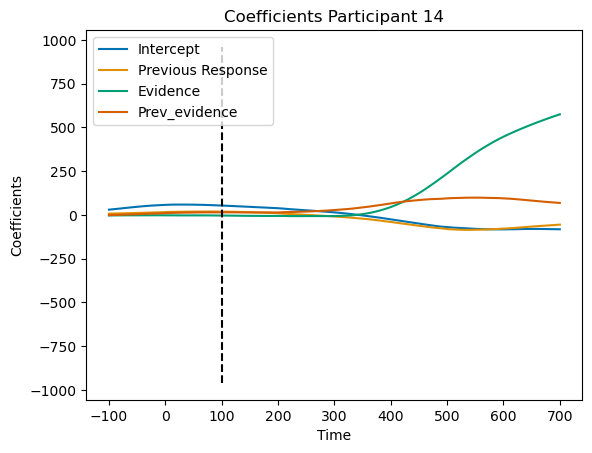

Participant 15, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.009
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     1.957
Date:                Tue, 19 Mar 2024   Prob (F-statistic):              0.119
Time:                        12:27:44   Log-Likelihood:                -3409.4
No. Observations:                 668   AIC:                             6827.
Df Residuals:                     664   BIC:                             6845.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          6.0571   

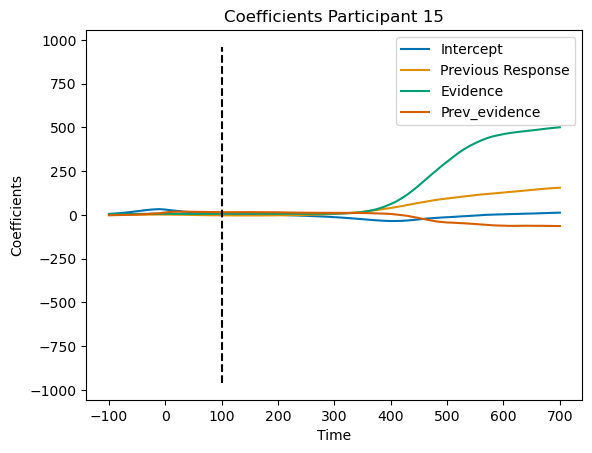

Participant 16, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.013
Model:                            OLS   Adj. R-squared:                  0.008
Method:                 Least Squares   F-statistic:                     2.831
Date:                Tue, 19 Mar 2024   Prob (F-statistic):             0.0376
Time:                        12:27:45   Log-Likelihood:                -4065.6
No. Observations:                 668   AIC:                             8139.
Df Residuals:                     664   BIC:                             8157.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         16.5852   

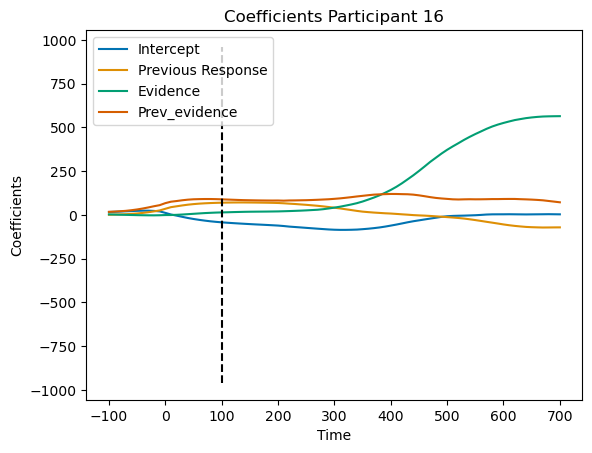

Participant 17, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.026
Model:                            OLS   Adj. R-squared:                  0.023
Method:                 Least Squares   F-statistic:                     7.510
Date:                Tue, 19 Mar 2024   Prob (F-statistic):           5.80e-05
Time:                        12:27:46   Log-Likelihood:                -4378.1
No. Observations:                 845   AIC:                             8764.
Df Residuals:                     841   BIC:                             8783.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          8.2751   

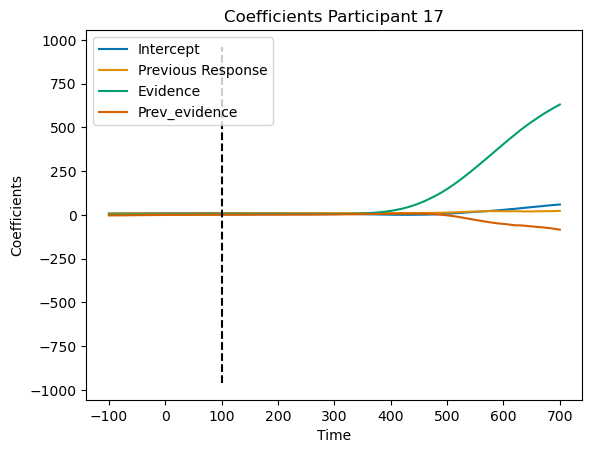

Participant 18, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.006
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     1.673
Date:                Tue, 19 Mar 2024   Prob (F-statistic):              0.171
Time:                        12:27:47   Log-Likelihood:                -4442.5
No. Observations:                 788   AIC:                             8893.
Df Residuals:                     784   BIC:                             8912.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          3.8477   

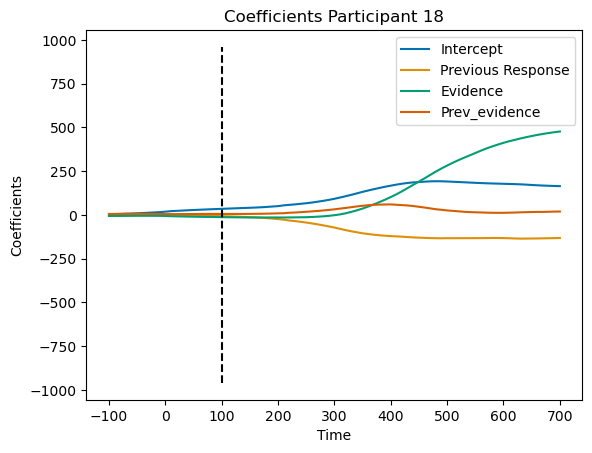

Participant 19, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.017
Model:                            OLS   Adj. R-squared:                  0.013
Method:                 Least Squares   F-statistic:                     4.720
Date:                Tue, 19 Mar 2024   Prob (F-statistic):            0.00284
Time:                        12:27:48   Log-Likelihood:                -4422.2
No. Observations:                 840   AIC:                             8852.
Df Residuals:                     836   BIC:                             8871.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -7.4771   

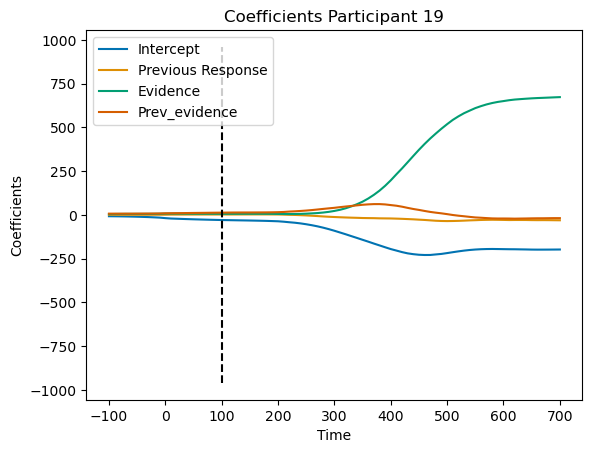

Participant 1, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.002
Method:                 Least Squares   F-statistic:                    0.3961
Date:                Tue, 19 Mar 2024   Prob (F-statistic):              0.756
Time:                        12:27:50   Log-Likelihood:                -3826.8
No. Observations:                 806   AIC:                             7662.
Df Residuals:                     802   BIC:                             7680.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          9.4639    

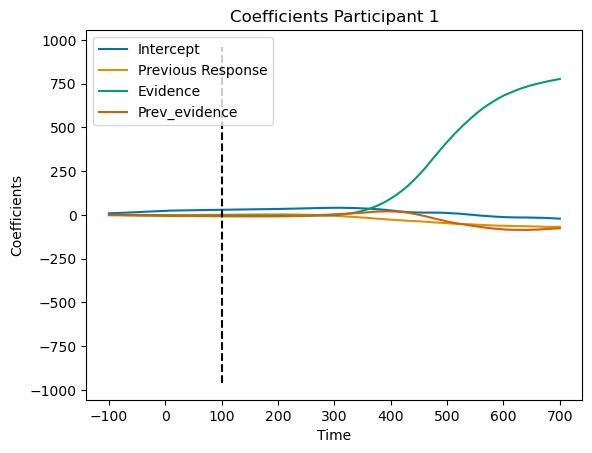

Participant 20, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.028
Model:                            OLS   Adj. R-squared:                  0.024
Method:                 Least Squares   F-statistic:                     7.725
Date:                Tue, 19 Mar 2024   Prob (F-statistic):           4.30e-05
Time:                        12:27:51   Log-Likelihood:                -3846.9
No. Observations:                 821   AIC:                             7702.
Df Residuals:                     817   BIC:                             7721.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.9666   

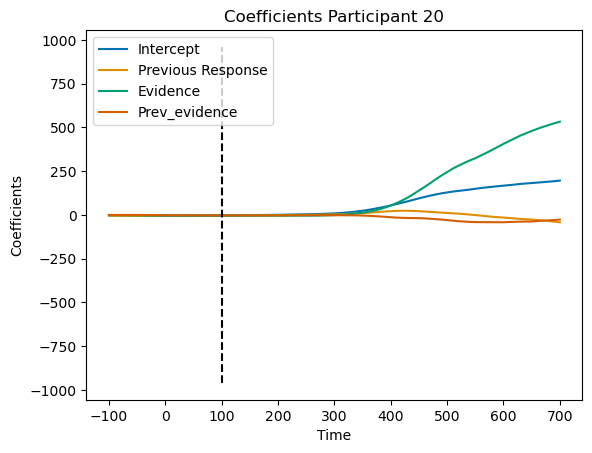

Participant 23, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.005
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     1.436
Date:                Tue, 19 Mar 2024   Prob (F-statistic):              0.231
Time:                        12:27:52   Log-Likelihood:                -4128.6
No. Observations:                 866   AIC:                             8265.
Df Residuals:                     862   BIC:                             8284.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.7135   

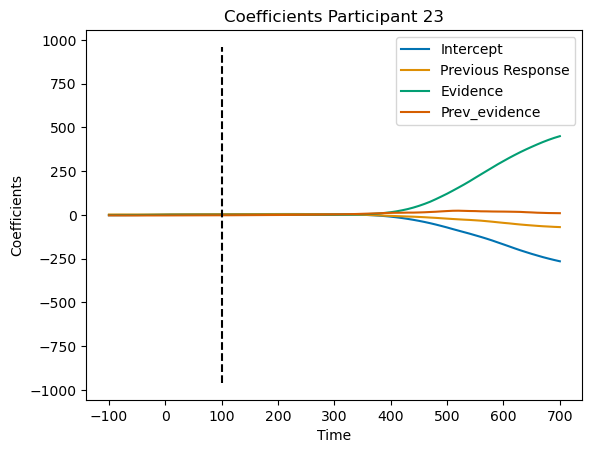

Participant 24, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.016
Model:                            OLS   Adj. R-squared:                  0.012
Method:                 Least Squares   F-statistic:                     4.234
Date:                Tue, 19 Mar 2024   Prob (F-statistic):            0.00556
Time:                        12:27:54   Log-Likelihood:                -3610.4
No. Observations:                 799   AIC:                             7229.
Df Residuals:                     795   BIC:                             7248.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -3.9081   

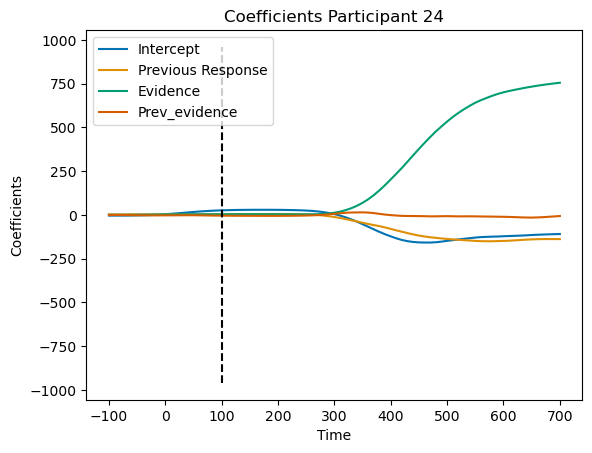

Participant 25, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.012
Model:                            OLS   Adj. R-squared:                  0.009
Method:                 Least Squares   F-statistic:                     3.401
Date:                Tue, 19 Mar 2024   Prob (F-statistic):             0.0174
Time:                        12:27:55   Log-Likelihood:                -3488.6
No. Observations:                 815   AIC:                             6985.
Df Residuals:                     811   BIC:                             7004.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.8403   

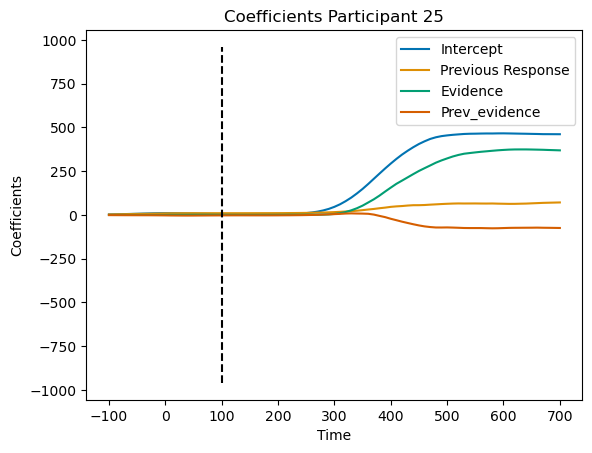

Participant 26, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.006
Method:                 Least Squares   F-statistic:                    0.1584
Date:                Tue, 19 Mar 2024   Prob (F-statistic):              0.924
Time:                        12:27:56   Log-Likelihood:                -2149.7
No. Observations:                 393   AIC:                             4307.
Df Residuals:                     389   BIC:                             4323.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         16.3646   

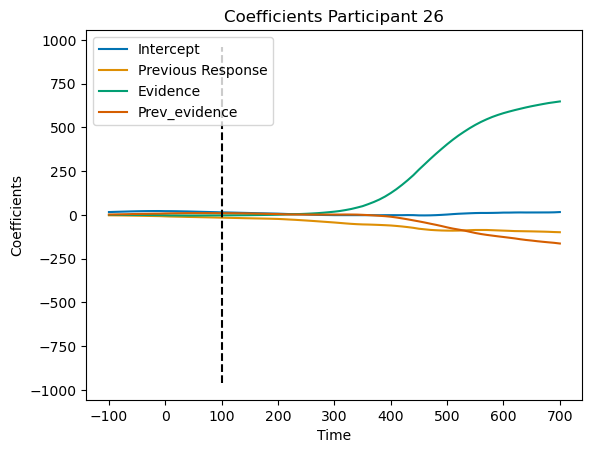

Participant 27, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.026
Model:                            OLS   Adj. R-squared:                  0.023
Method:                 Least Squares   F-statistic:                     8.094
Date:                Tue, 19 Mar 2024   Prob (F-statistic):           2.53e-05
Time:                        12:27:57   Log-Likelihood:                -4474.7
No. Observations:                 912   AIC:                             8957.
Df Residuals:                     908   BIC:                             8977.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -2.6835   

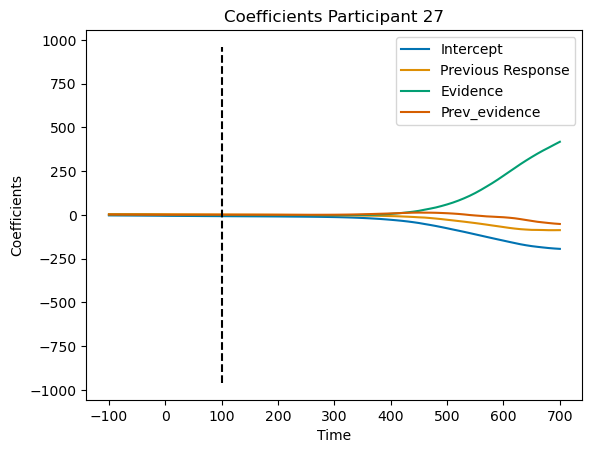

Participant 28, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.046
Model:                            OLS   Adj. R-squared:                  0.042
Method:                 Least Squares   F-statistic:                     12.23
Date:                Tue, 19 Mar 2024   Prob (F-statistic):           7.97e-08
Time:                        12:27:58   Log-Likelihood:                -3924.3
No. Observations:                 770   AIC:                             7857.
Df Residuals:                     766   BIC:                             7875.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.3427   

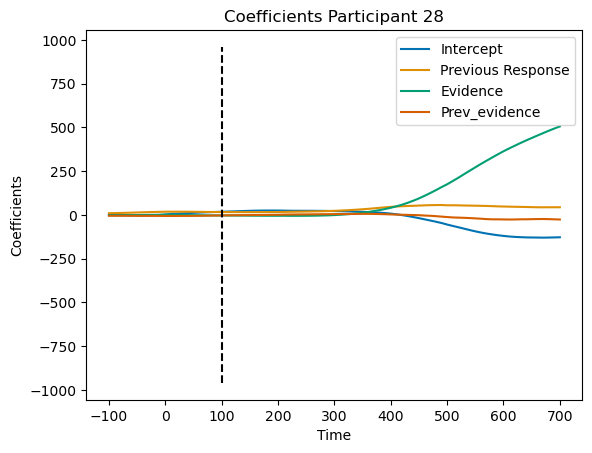

Participant 29, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.025
Model:                            OLS   Adj. R-squared:                  0.022
Method:                 Least Squares   F-statistic:                     7.406
Date:                Tue, 19 Mar 2024   Prob (F-statistic):           6.69e-05
Time:                        12:27:59   Log-Likelihood:                -4189.3
No. Observations:                 862   AIC:                             8387.
Df Residuals:                     858   BIC:                             8406.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -3.7031   

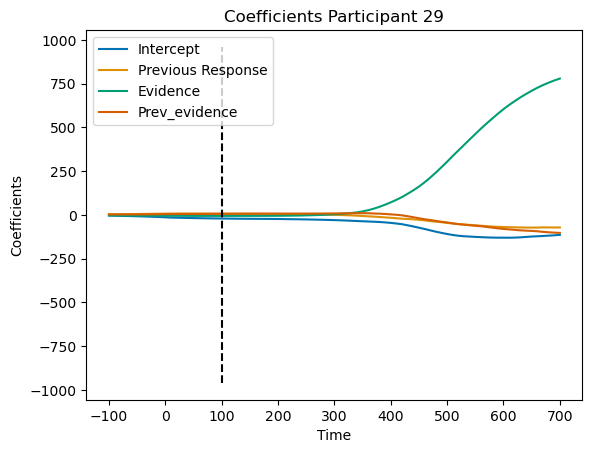

Participant 2, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.009
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     1.360
Date:                Tue, 19 Mar 2024   Prob (F-statistic):              0.254
Time:                        12:28:00   Log-Likelihood:                -2253.2
No. Observations:                 434   AIC:                             4514.
Df Residuals:                     430   BIC:                             4531.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         23.0511    

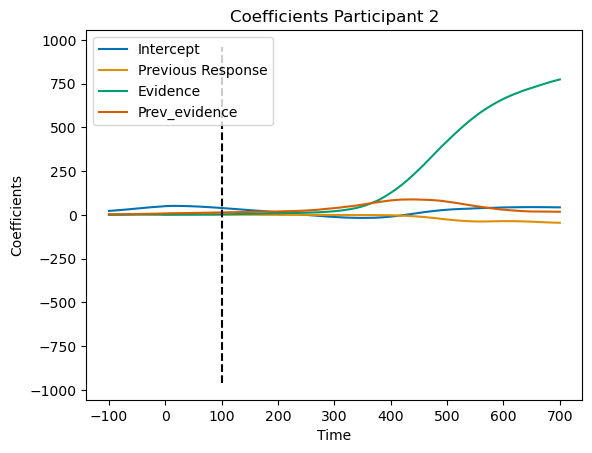

Participant 30, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.004
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     1.257
Date:                Tue, 19 Mar 2024   Prob (F-statistic):              0.288
Time:                        12:28:01   Log-Likelihood:                -4419.7
No. Observations:                 859   AIC:                             8847.
Df Residuals:                     855   BIC:                             8866.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         10.5414   

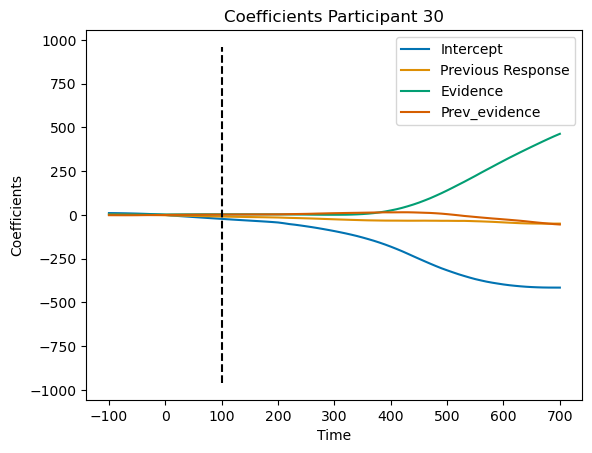

Participant 32, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.009
Model:                            OLS   Adj. R-squared:                  0.005
Method:                 Least Squares   F-statistic:                     2.566
Date:                Tue, 19 Mar 2024   Prob (F-statistic):             0.0534
Time:                        12:28:02   Log-Likelihood:                -3952.2
No. Observations:                 853   AIC:                             7912.
Df Residuals:                     849   BIC:                             7931.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          6.7278   

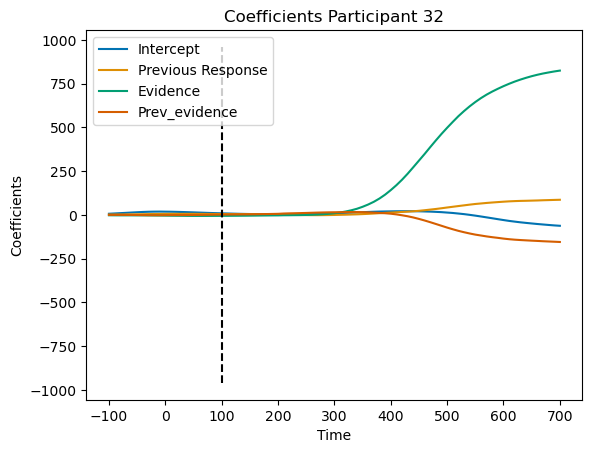

Participant 33, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.005
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     1.482
Date:                Tue, 19 Mar 2024   Prob (F-statistic):              0.218
Time:                        12:28:03   Log-Likelihood:                -4686.9
No. Observations:                 815   AIC:                             9382.
Df Residuals:                     811   BIC:                             9401.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         15.1462   

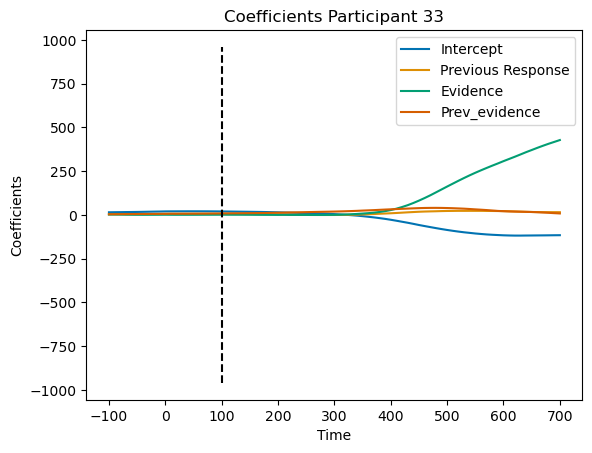

Participant 34, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.046
Model:                            OLS   Adj. R-squared:                  0.042
Method:                 Least Squares   F-statistic:                     11.29
Date:                Tue, 19 Mar 2024   Prob (F-statistic):           3.05e-07
Time:                        12:28:04   Log-Likelihood:                -4437.5
No. Observations:                 713   AIC:                             8883.
Df Residuals:                     709   BIC:                             8901.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.8981   

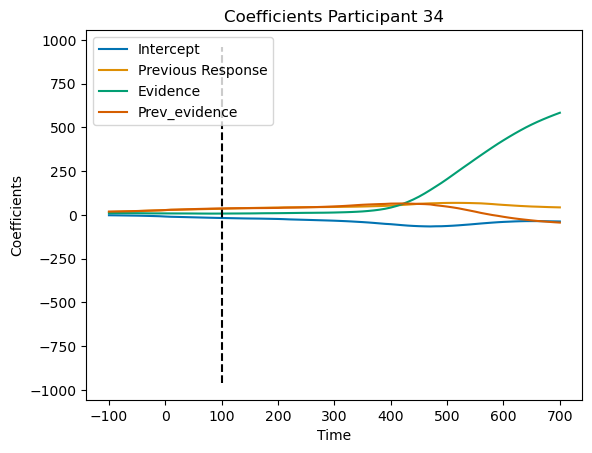

Participant 36, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.009
Model:                            OLS   Adj. R-squared:                  0.006
Method:                 Least Squares   F-statistic:                     2.743
Date:                Tue, 19 Mar 2024   Prob (F-statistic):             0.0422
Time:                        12:28:05   Log-Likelihood:                -4153.9
No. Observations:                 864   AIC:                             8316.
Df Residuals:                     860   BIC:                             8335.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.4884   

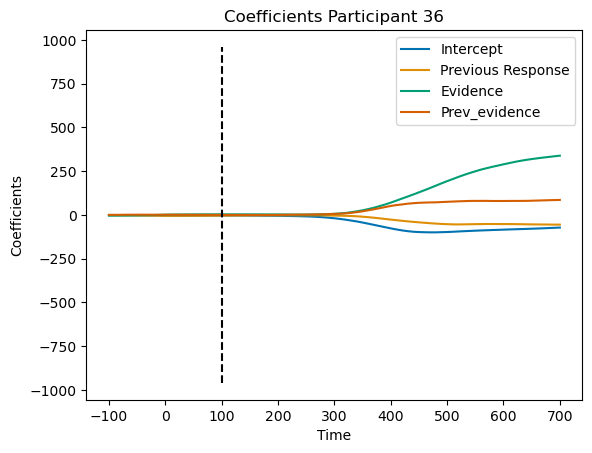

Participant 37, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.010
Model:                            OLS   Adj. R-squared:                  0.006
Method:                 Least Squares   F-statistic:                     2.713
Date:                Tue, 19 Mar 2024   Prob (F-statistic):             0.0439
Time:                        12:28:06   Log-Likelihood:                -4484.4
No. Observations:                 843   AIC:                             8977.
Df Residuals:                     839   BIC:                             8996.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.5100   

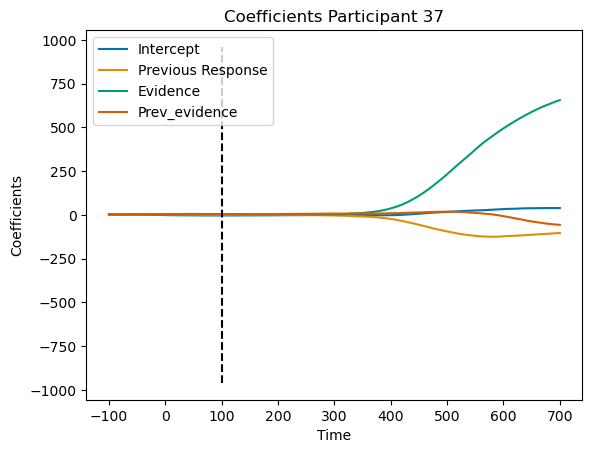

Participant 38, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.009
Model:                            OLS   Adj. R-squared:                  0.005
Method:                 Least Squares   F-statistic:                     2.418
Date:                Tue, 19 Mar 2024   Prob (F-statistic):             0.0651
Time:                        12:28:07   Log-Likelihood:                -3459.2
No. Observations:                 785   AIC:                             6926.
Df Residuals:                     781   BIC:                             6945.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.6424   

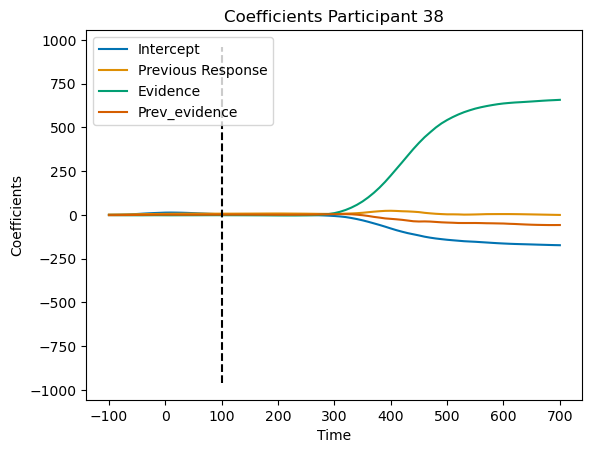

Participant 39, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.025
Model:                            OLS   Adj. R-squared:                  0.021
Method:                 Least Squares   F-statistic:                     7.448
Date:                Tue, 19 Mar 2024   Prob (F-statistic):           6.28e-05
Time:                        12:28:08   Log-Likelihood:                -5083.0
No. Observations:                 891   AIC:                         1.017e+04
Df Residuals:                     887   BIC:                         1.019e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         36.3180   

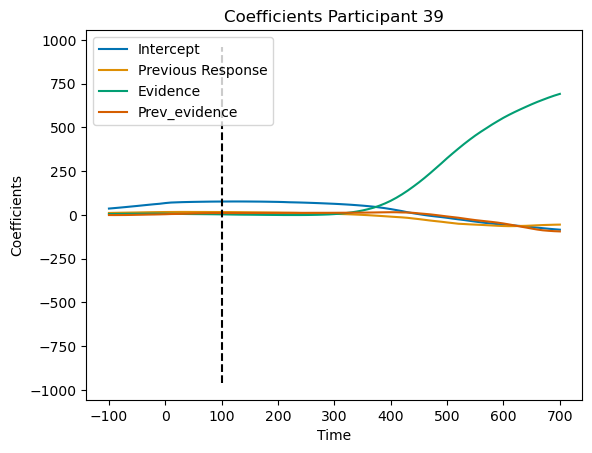

Participant 3, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.004
Method:                 Least Squares   F-statistic:                    0.1637
Date:                Tue, 19 Mar 2024   Prob (F-statistic):              0.921
Time:                        12:28:09   Log-Likelihood:                -3478.7
No. Observations:                 704   AIC:                             6965.
Df Residuals:                     700   BIC:                             6984.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         13.0126    

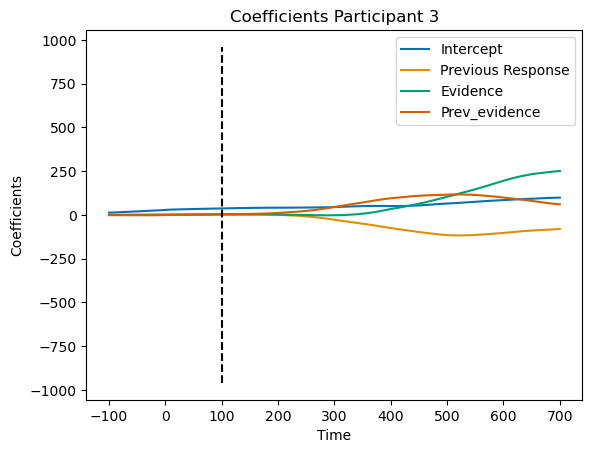

Participant 40, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.012
Model:                            OLS   Adj. R-squared:                  0.007
Method:                 Least Squares   F-statistic:                     2.799
Date:                Tue, 19 Mar 2024   Prob (F-statistic):             0.0392
Time:                        12:28:10   Log-Likelihood:                -3897.5
No. Observations:                 721   AIC:                             7803.
Df Residuals:                     717   BIC:                             7821.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         10.8984   

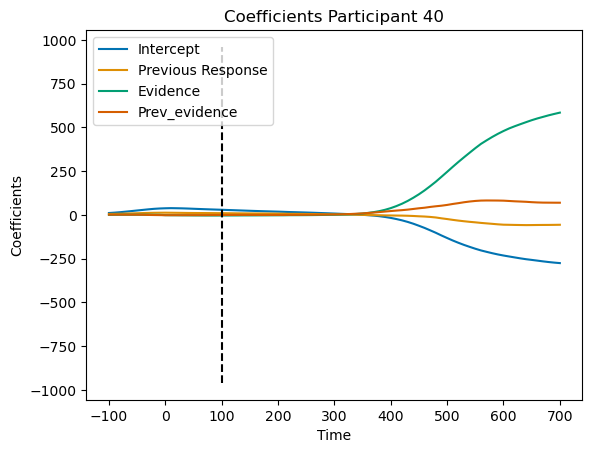

Participant 41, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.003
Method:                 Least Squares   F-statistic:                    0.1832
Date:                Tue, 19 Mar 2024   Prob (F-statistic):              0.908
Time:                        12:28:11   Log-Likelihood:                -3490.2
No. Observations:                 741   AIC:                             6988.
Df Residuals:                     737   BIC:                             7007.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.7288   

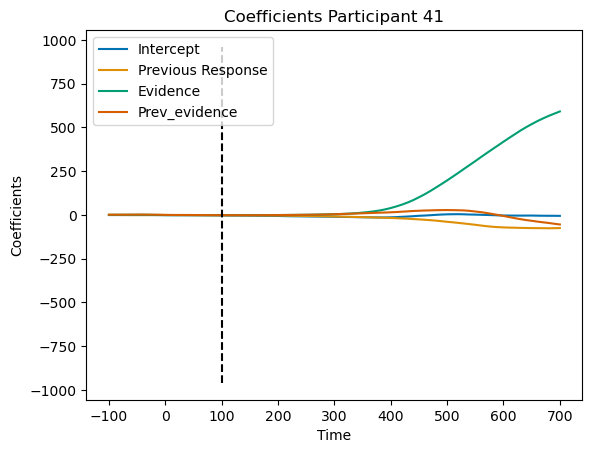

Participant 42, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.016
Model:                            OLS   Adj. R-squared:                  0.012
Method:                 Least Squares   F-statistic:                     4.775
Date:                Tue, 19 Mar 2024   Prob (F-statistic):            0.00262
Time:                        12:28:12   Log-Likelihood:                -4227.7
No. Observations:                 896   AIC:                             8463.
Df Residuals:                     892   BIC:                             8483.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.1522   

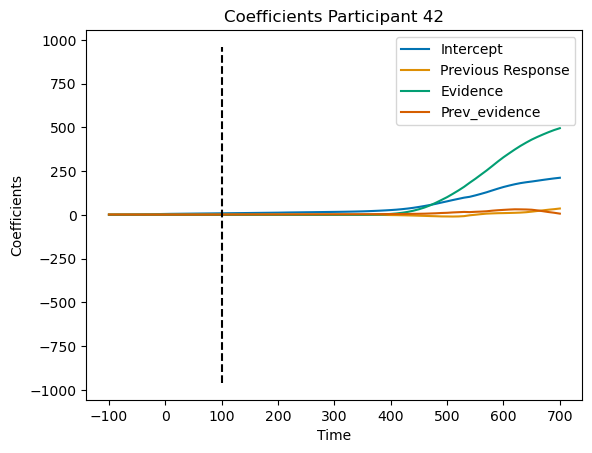

Participant 43, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                 -0.004
Method:                 Least Squares   F-statistic:                    0.4051
Date:                Tue, 19 Mar 2024   Prob (F-statistic):              0.749
Time:                        12:28:13   Log-Likelihood:                -3009.3
No. Observations:                 464   AIC:                             6027.
Df Residuals:                     460   BIC:                             6043.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         13.3779   

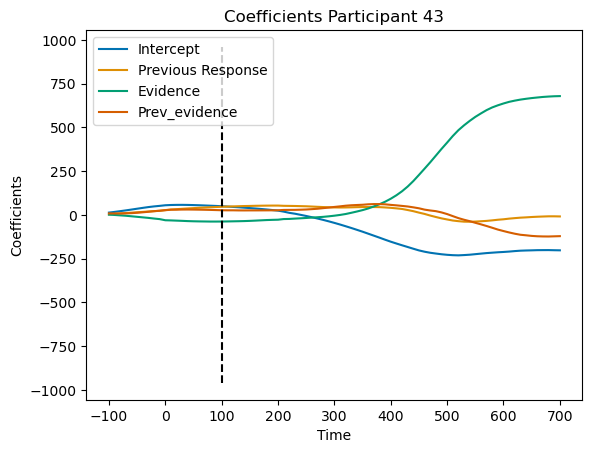

Participant 45, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.008
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     2.082
Date:                Tue, 19 Mar 2024   Prob (F-statistic):              0.101
Time:                        12:28:15   Log-Likelihood:                -3922.0
No. Observations:                 784   AIC:                             7852.
Df Residuals:                     780   BIC:                             7871.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          5.0440   

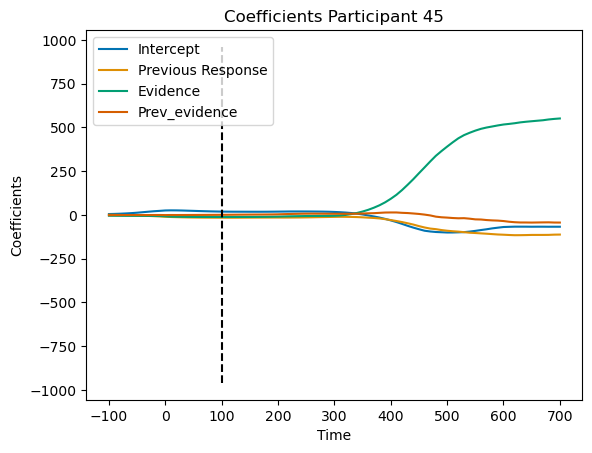

Participant 46, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.005
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.8978
Date:                Tue, 19 Mar 2024   Prob (F-statistic):              0.442
Time:                        12:28:16   Log-Likelihood:                -2423.1
No. Observations:                 539   AIC:                             4854.
Df Residuals:                     535   BIC:                             4871.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -2.9403   

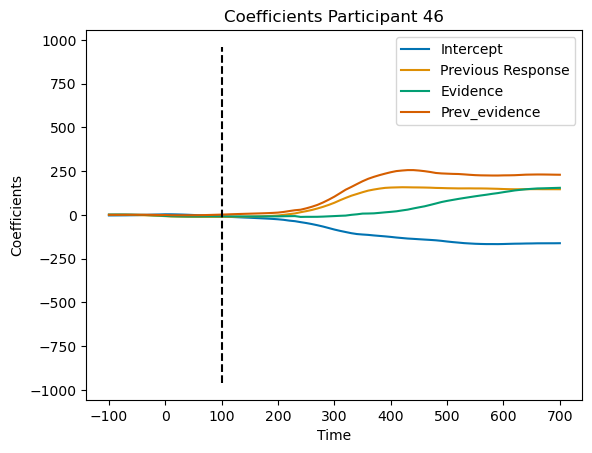

Participant 47, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                 -0.003
Method:                 Least Squares   F-statistic:                    0.3736
Date:                Tue, 19 Mar 2024   Prob (F-statistic):              0.772
Time:                        12:28:17   Log-Likelihood:                -3523.3
No. Observations:                 692   AIC:                             7055.
Df Residuals:                     688   BIC:                             7073.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         14.2943   

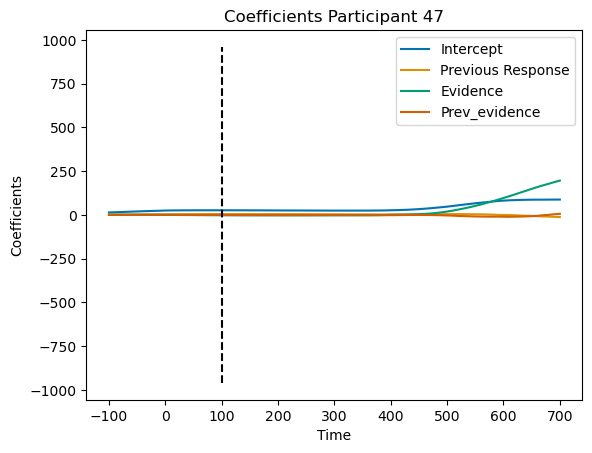

Participant 48, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.039
Model:                            OLS   Adj. R-squared:                  0.036
Method:                 Least Squares   F-statistic:                     11.72
Date:                Tue, 19 Mar 2024   Prob (F-statistic):           1.57e-07
Time:                        12:28:19   Log-Likelihood:                -4223.4
No. Observations:                 866   AIC:                             8455.
Df Residuals:                     862   BIC:                             8474.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.7187   

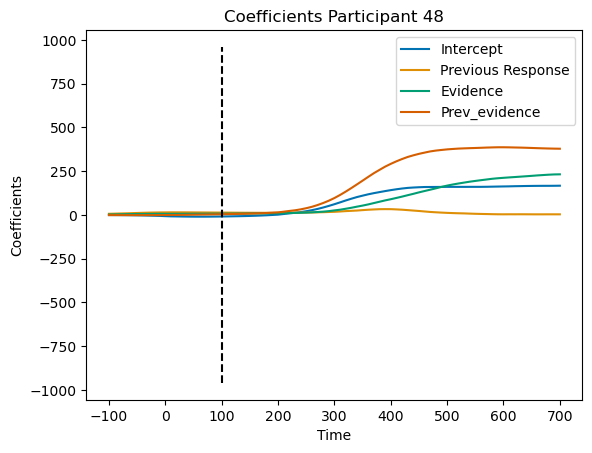

Participant 49, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.009
Model:                            OLS   Adj. R-squared:                  0.005
Method:                 Least Squares   F-statistic:                     2.334
Date:                Tue, 19 Mar 2024   Prob (F-statistic):             0.0726
Time:                        12:28:21   Log-Likelihood:                -4323.3
No. Observations:                 803   AIC:                             8655.
Df Residuals:                     799   BIC:                             8673.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.3495   

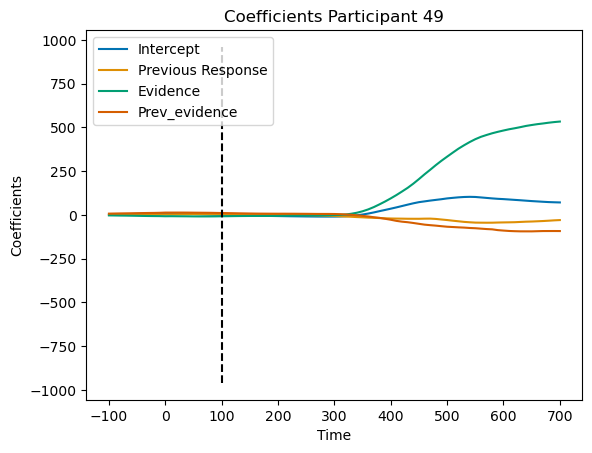

Participant 4, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.014
Model:                            OLS   Adj. R-squared:                  0.011
Method:                 Least Squares   F-statistic:                     4.177
Date:                Tue, 19 Mar 2024   Prob (F-statistic):            0.00600
Time:                        12:28:23   Log-Likelihood:                -4119.9
No. Observations:                 884   AIC:                             8248.
Df Residuals:                     880   BIC:                             8267.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          9.2905    

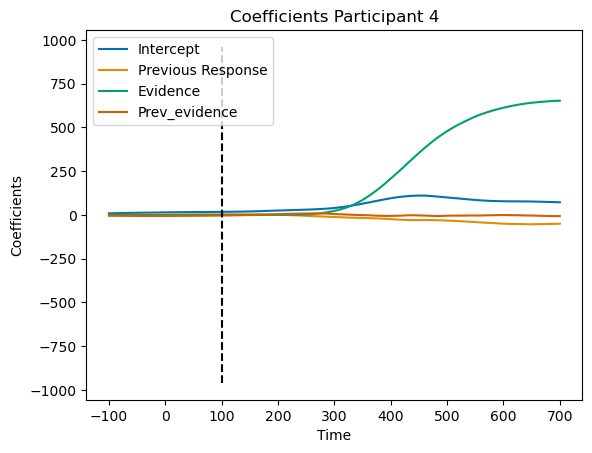

Participant 50, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.050
Model:                            OLS   Adj. R-squared:                  0.046
Method:                 Least Squares   F-statistic:                     13.78
Date:                Tue, 19 Mar 2024   Prob (F-statistic):           9.10e-09
Time:                        12:28:24   Log-Likelihood:                -4123.5
No. Observations:                 797   AIC:                             8255.
Df Residuals:                     793   BIC:                             8274.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.0811   

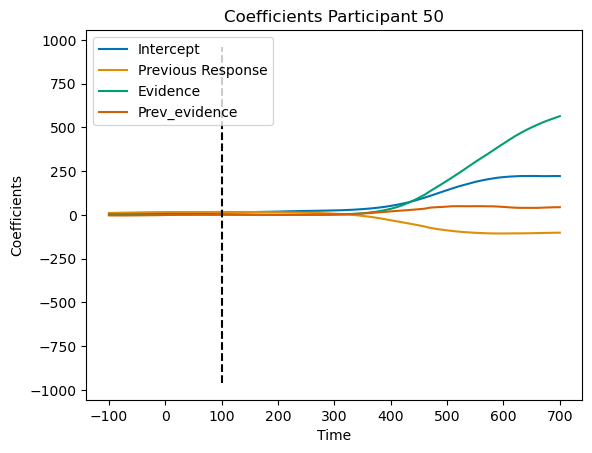

Participant 52, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.002
Method:                 Least Squares   F-statistic:                    0.3031
Date:                Tue, 19 Mar 2024   Prob (F-statistic):              0.823
Time:                        12:28:26   Log-Likelihood:                -4391.7
No. Observations:                 846   AIC:                             8791.
Df Residuals:                     842   BIC:                             8810.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.7100   

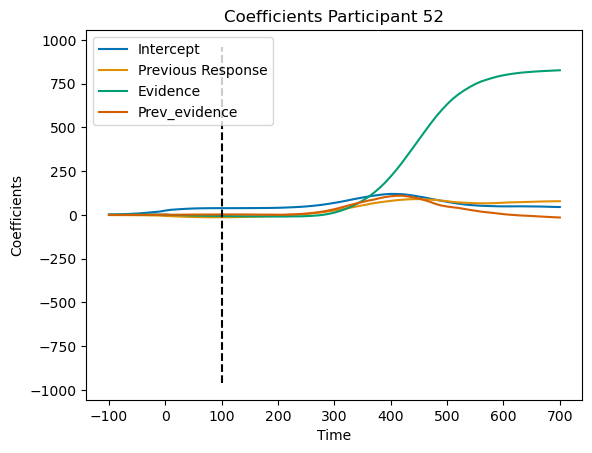

Participant 53, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.032
Model:                            OLS   Adj. R-squared:                  0.025
Method:                 Least Squares   F-statistic:                     4.632
Date:                Tue, 19 Mar 2024   Prob (F-statistic):            0.00336
Time:                        12:28:28   Log-Likelihood:                -2093.2
No. Observations:                 424   AIC:                             4194.
Df Residuals:                     420   BIC:                             4211.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.3047   

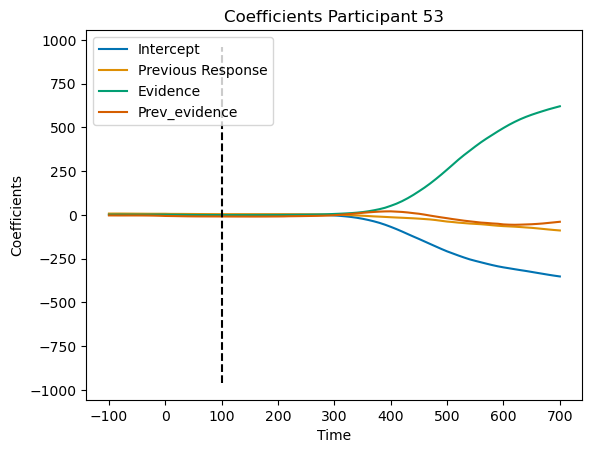

Participant 54, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                 -0.002
Method:                 Least Squares   F-statistic:                    0.5298
Date:                Tue, 19 Mar 2024   Prob (F-statistic):              0.662
Time:                        12:28:29   Log-Likelihood:                -4565.1
No. Observations:                 884   AIC:                             9138.
Df Residuals:                     880   BIC:                             9157.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.8926   

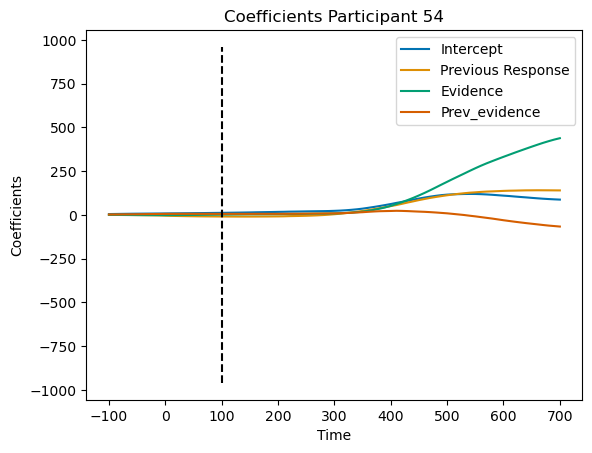

Participant 55, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.008
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     1.584
Date:                Tue, 19 Mar 2024   Prob (F-statistic):              0.192
Time:                        12:28:31   Log-Likelihood:                -2967.9
No. Observations:                 626   AIC:                             5944.
Df Residuals:                     622   BIC:                             5962.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          6.0833   

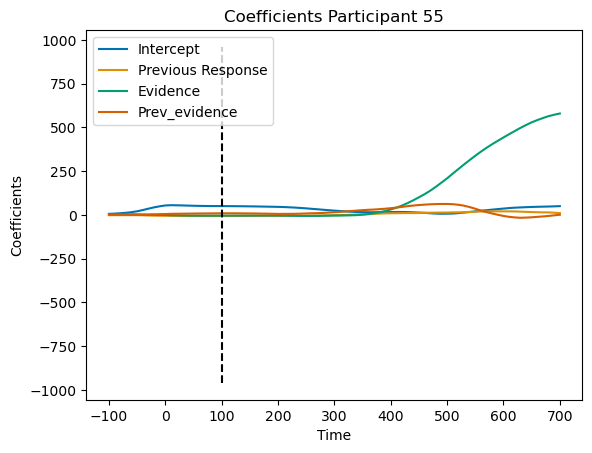

Participant 56, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                 -0.006
Method:                 Least Squares   F-statistic:                    0.2290
Date:                Tue, 19 Mar 2024   Prob (F-statistic):              0.876
Time:                        12:28:32   Log-Likelihood:                -2472.3
No. Observations:                 418   AIC:                             4953.
Df Residuals:                     414   BIC:                             4969.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         36.7741   

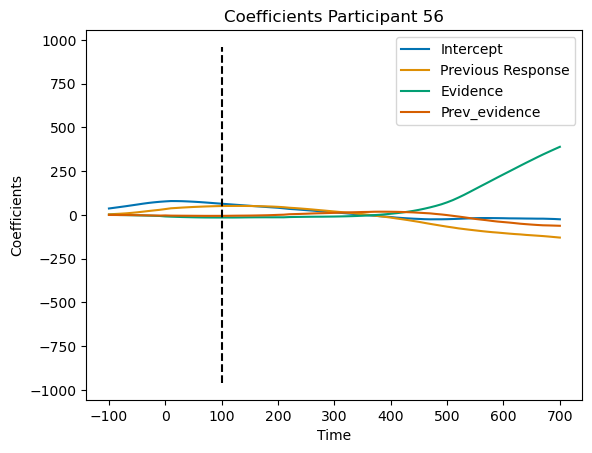

Participant 57, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.008
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     2.184
Date:                Tue, 19 Mar 2024   Prob (F-statistic):             0.0885
Time:                        12:28:34   Log-Likelihood:                -4778.0
No. Observations:                 853   AIC:                             9564.
Df Residuals:                     849   BIC:                             9583.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         29.4642   

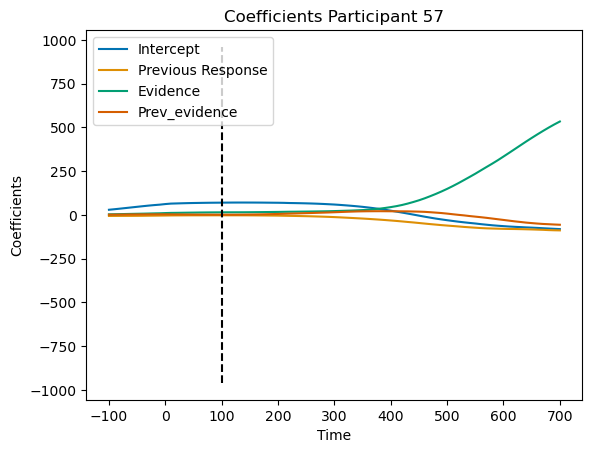

Participant 58, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.031
Model:                            OLS   Adj. R-squared:                  0.024
Method:                 Least Squares   F-statistic:                     4.468
Date:                Tue, 19 Mar 2024   Prob (F-statistic):            0.00420
Time:                        12:28:36   Log-Likelihood:                -2245.3
No. Observations:                 428   AIC:                             4499.
Df Residuals:                     424   BIC:                             4515.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         10.3457   

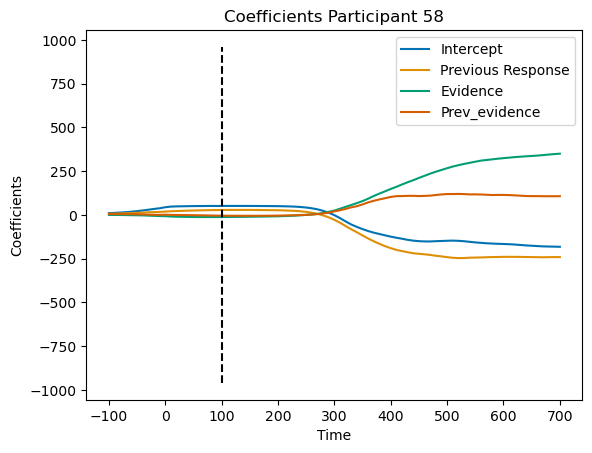

Participant 6, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.002
Method:                 Least Squares   F-statistic:                    0.3799
Date:                Tue, 19 Mar 2024   Prob (F-statistic):              0.767
Time:                        12:28:37   Log-Likelihood:                -5089.9
No. Observations:                 918   AIC:                         1.019e+04
Df Residuals:                     914   BIC:                         1.021e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -9.4241    

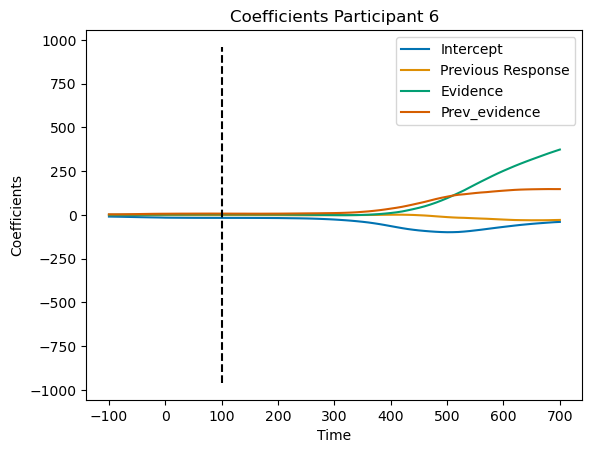

Participant 7, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.020
Model:                            OLS   Adj. R-squared:                  0.017
Method:                 Least Squares   F-statistic:                     5.819
Date:                Tue, 19 Mar 2024   Prob (F-statistic):           0.000615
Time:                        12:28:39   Log-Likelihood:                -4001.1
No. Observations:                 861   AIC:                             8010.
Df Residuals:                     857   BIC:                             8029.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          6.1642    

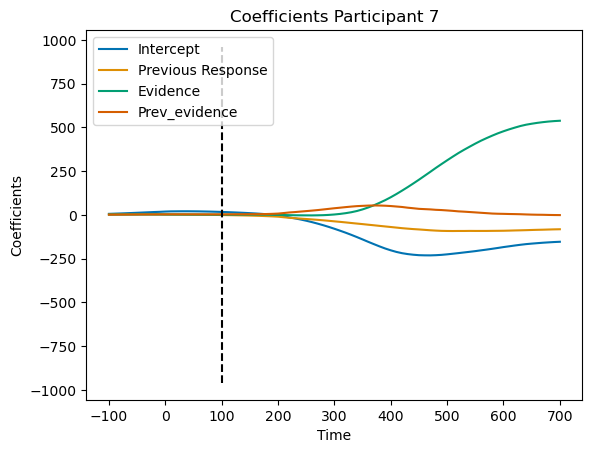

Participant 8, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.021
Model:                            OLS   Adj. R-squared:                  0.018
Method:                 Least Squares   F-statistic:                     6.205
Date:                Tue, 19 Mar 2024   Prob (F-statistic):           0.000359
Time:                        12:28:41   Log-Likelihood:                -4381.2
No. Observations:                 874   AIC:                             8770.
Df Residuals:                     870   BIC:                             8790.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.8856    

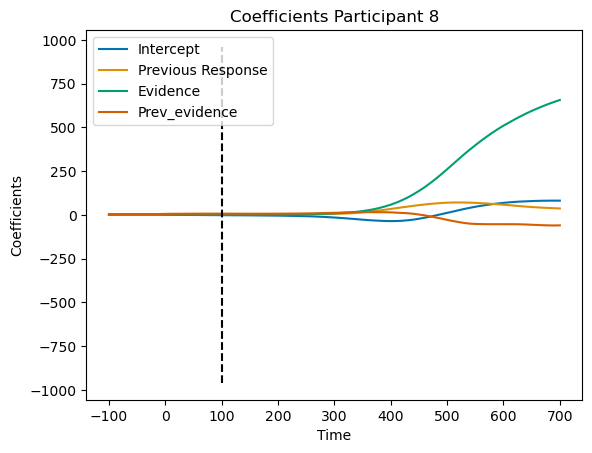

Participant 9, Iteration 1
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.026
Model:                            OLS   Adj. R-squared:                  0.022
Method:                 Least Squares   F-statistic:                     7.678
Date:                Tue, 19 Mar 2024   Prob (F-statistic):           4.56e-05
Time:                        12:28:43   Log-Likelihood:                -5289.8
No. Observations:                 874   AIC:                         1.059e+04
Df Residuals:                     870   BIC:                         1.061e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -45.1143    

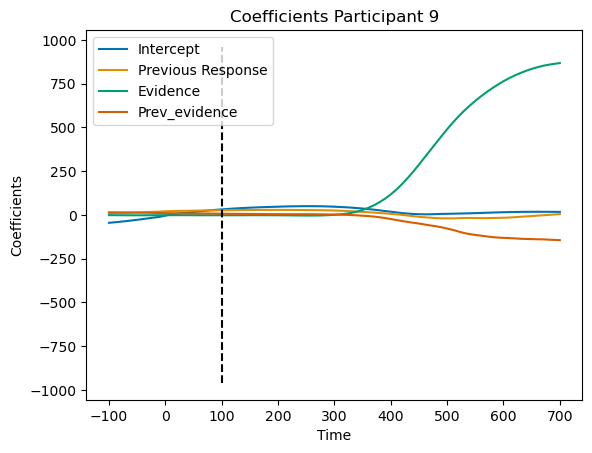

In [ ]:
######################################
#Previous Response
######################################
time = list(range(-100, 71 * 10, 10))
#df_lm = df[df['true_value'] != 'Control']
df_lm = df_11[df_11['previous_response'] != 'NAN']
df_lm['previous_response'] = df_lm['previous_response'].apply(lambda x: 1 if x == 'Red' else - 1)
# Get the unique participant numbers
participants = df_lm['pt_num'].unique()
all_coefs = []
# Iterate over each participant
for participant in participants:
    # Filter the dataframe for the current participant
    df_lm_participant = df_lm[df_lm['pt_num'] == participant]
    # One-hot encode the categorical predictor 'true_value'
    #df_encoded_participant = pd.get_dummies(df_lm_participant, columns=['previous_response'])
    df_encoded_participant = df_lm_participant
    

    # Drop rows with missing values
    df_cleaned_participant = df_encoded_participant.dropna()

    coefs = []
    for i in range(0, 81):
        # Extract the dependent variable
        first_values = df_cleaned_participant['x_values'].apply(lambda x: x[i])
        y = np.array(first_values).astype(int)

        # Extract the independent variables
        X_categorical = df_cleaned_participant[['previous_response']].values
        
        X_numerical = df_cleaned_participant['muval_rescaled'].values.reshape(-1, 1)
        X_numerical_2 = df_cleaned_participant['prev_evidence_rescaled'].values.reshape(-1, 1)
        #X_numerical = np.abs(X_numerical)

        # Add interaction term
        #interaction_term = X_categorical * X_numerical

        # Concatenate predictors and interaction term
        X = np.concatenate((X_categorical, X_numerical, X_numerical_2), axis=1)

        # Add constant term for intercept
        X = sm.add_constant(X)

        # Perform linear regression
        model = sm.OLS(y, X).fit()

        # Append coefficients to the list
        coefs.append((model.params[0], model.params[1], model.params[2], model.params[3]))

        # Print the summary of the regression results
        print(f"Participant {participant}, Iteration {i+1}")
        print(model.summary())
    plt.plot(time, coefs)
    plt.xlabel('Time')
    plt.ylabel('Coefficients')
    plt.title(f'Coefficients ' + f'Participant {participant}')
    plt.vlines(100, -960, 960, colors='black', linestyles='dashed')
    plt.legend(['Intercept',"Previous Response",'Evidence', 'Prev_evidence'])
    plt.show()
    all_coefs.append(coefs)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from ipywidgets import interactive

# Convert the list of coefficients to a numpy array
all_coefs_array = np.array(all_coefs)

# Calculate the average of each coefficient across all samples
average_coefs = np.mean(all_coefs_array, axis=0)

# Extract the x, y, and z values of the coefficients
intercept_coefs = average_coefs[:, 0]
prv_resp_coefs = average_coefs[:, 1]
evidence_coefs = average_coefs[:, 2]
prv_evidence_coefs = average_coefs[:, 3]

# Calculate the standard error of each coefficient across all samples
std_coefs = np.std(all_coefs_array, axis=0, ddof=1) / np.sqrt(all_coefs_array.shape[0])

def plot_zoom(factor):
    plt.figure(figsize=(12, 6))
    plt.plot(time, intercept_coefs, label='Intercept', color='blue')
    plt.plot(time, prv_resp_coefs, label='Previous Response', color='red')
    plt.plot(time, evidence_coefs, label='Evidence', color='green')
    plt.plot(time, prv_evidence_coefs, label='Previous evidence', color='orange')
    plt.fill_between(time, intercept_coefs - std_coefs[:, 0], x_coefs + std_coefs[:, 0], alpha=0.2, color='blue')
    plt.fill_between(time, prv_resp_coefs - std_coefs[:, 1], y_coefs + std_coefs[:, 1], alpha=0.2, color='red')
    plt.fill_between(time, evidence_coefs - std_coefs[:, 2], z_coefs + std_coefs[:, 2], alpha=0.2, color='green')
    plt.fill_between(time, prv_evidence_coefs - std_coefs[:, 3], zz_coefs + std_coefs[:, 3], alpha=0.2, color='orange')
    plt.xlabel('Time')
    plt.ylabel('Coefficient Value')
    plt.title('Average Coefficients')
    # Add the regression formula as text
    #plt.text(10, 850, 'Regression Formula:', color='black', fontsize=12, verticalalignment='bottom')
    #plt.text(170, 850, 'B0+', color='blue', fontsize=12, verticalalignment='bottom')
    #plt.text(205, 850, 'B1*Evidence', color='green', fontsize=12, verticalalignment='bottom')
    #plt.text(305, 850, '+B2*Prev_resp', color='red', fontsize=12, verticalalignment='bottom')
    #plt.xticks(np.arange(-100, 710, 100))
    plt.ylim(-100, 960)
    plt.vlines(0, -960, 960, colors='orange', linestyles='dashed')
    plt.legend()
    plt.xlim(min(time), max(time))  # Use min() and max() to find the limits
    plt.ylim(-100, x_coefs.max() + factor)
    plt.show()

interactive_plot = interactive(plot_zoom, factor=(0, 960, 20))
interactive_plot


interactive(children=(IntSlider(value=480, description='factor', max=960, step=20), Output()), _dom_classes=('…

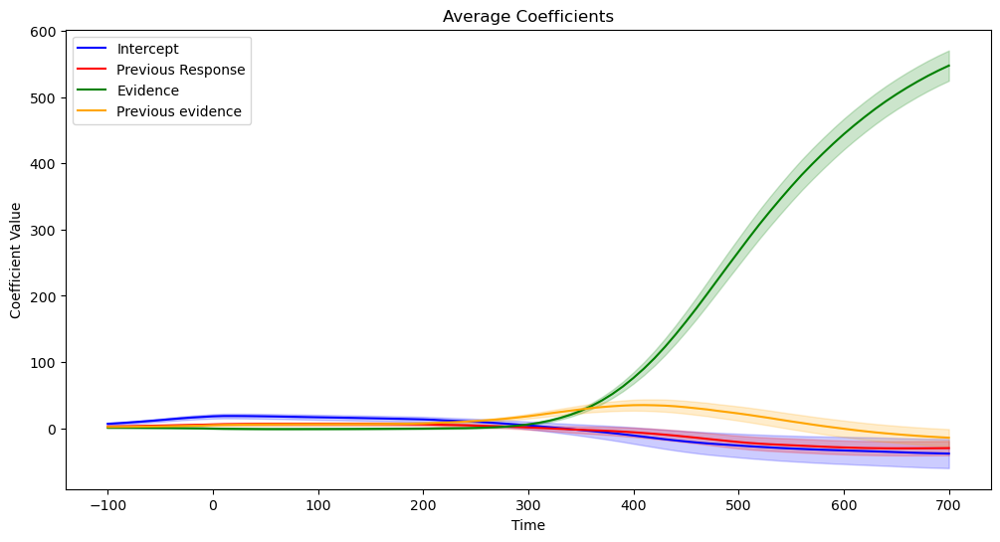

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from ipywidgets import interactive

# Convert the list of coefficients to a numpy array
all_coefs_array = np.array(all_coefs)

# Calculate the average of each coefficient across all samples
average_coefs = np.mean(all_coefs_array, axis=0)
#logging coefs
log_average_coefs = np.log(average_coefs[:, 2])

# Extract the x, y, and z values of the coefficients
intercept_coefs = average_coefs[:, 0]
prv_resp_coefs = average_coefs[:, 1]
evidence_coefs = average_coefs[:, 2]
prv_evidence_coefs = average_coefs[:, 3]

# Calculate the standard error of each coefficient across all samples
std_coefs = np.std(all_coefs_array, axis=0, ddof=1) / np.sqrt(all_coefs_array.shape[0])


plt.figure(figsize=(12, 6))
plt.plot(time, intercept_coefs, label='Intercept', color='blue')
plt.plot(time, prv_resp_coefs, label='Previous Response', color='red')
plt.plot(time, evidence_coefs, label='Evidence', color='green')
plt.plot(time, prv_evidence_coefs, label='Previous evidence', color='orange')
plt.fill_between(time, intercept_coefs - std_coefs[:, 0], intercept_coefs + std_coefs[:, 0], alpha=0.2, color='blue')
plt.fill_between(time, prv_resp_coefs - std_coefs[:, 1], prv_resp_coefs + std_coefs[:, 1], alpha=0.2, color='red')
plt.fill_between(time, evidence_coefs - std_coefs[:, 2], evidence_coefs + std_coefs[:, 2], alpha=0.2, color='green')
plt.fill_between(time, prv_evidence_coefs - std_coefs[:, 3], prv_evidence_coefs + std_coefs[:, 3], alpha=0.2, color='orange')
plt.xlabel('Time')
plt.ylabel('Coefficient Value')
#plt.yscale('log')
plt.title('Average Coefficients')
# Add the regression formula as text
#plt.text(10, 850, 'Regression Formula:', color='black', fontsize=12, verticalalignment='bottom')
#plt.text(170, 850, 'B0+', color='blue', fontsize=12, verticalalignment='bottom')
#plt.text(205, 850, 'B1*Evidence', color='green', fontsize=12, verticalalignment='bottom')
#plt.text(305, 850, '+B2*Prev_resp', color='red', fontsize=12, verticalalignment='bottom')
#plt.xticks(np.arange(-100, 710, 100))
#plt.ylim(-100, 960)
#plt.vlines(0, -960, 960, colors='orange', linestyles='dashed')
plt.legend()
#plt.xlim(min(time), max(time))  # Use min() and max() to find the limits
#plt.ylim(-100, x_coefs.max() + factor)
plt.show()

# Assuming your average coefs data is stored in the variable 'average_coefs'
#log_average_coefs = np.log(average_coefs)

